In [5]:
import numpy as np

In [6]:
import matplotlib.pyplot as plt

In [409]:
mark = ['H', 'C', 'S', 'D']
number = ['A', '2', '3', '4', '5', '6', '7', '8', '9', '10', 'J', 'Q', 'K']

class BJ(object):
    
    # 카드 초기값
    card = [(i, j) for i in mark for j in number]
    
    def __init__(self, thresh, name, isdealer, total_money, money):
        self.total_money = total_money
        self.money = money
        self.name = name
        self.isdealer = isdealer
        self.deck = None
        self.thresh = thresh
        self.status = ''
        self.win = 'Even'
        self.win_history = []
        self.history = [total_money]
        self.bet_history = [money]
        self.mood_history = []
        self.tension_history = []
        
    def card_draw(self):
        
        a = BJ.card[np.random.randint(0, len(BJ.card))]
        BJ.card.remove(a)
        if a[1] in ['K', 'Q', 'J']:
            b = 10
        elif a[1] == 'A':
            b = 1
        else:
            b = int(a[1])
        return a, b


    # A 카드 바꾸기
    def A_change(self):
        if self.deck.count(1) == 2:
            self.deck.remove(1)
            self.deck.append(11)
            if sum(self.deck) > 21:
                self.deck.remove(11)
                self.deck.append(1)
            #return self.deck
        elif 1 in self.deck:
            if sum(self.deck) > 21:
                pass
                #return deck
            else:
                self.deck.remove(1)
                self.deck.append(11)
                if sum(self.deck) > 21:
                    self.deck.remove(11)
                    self.deck.append(1)
                
                #return deck
        else:
            pass
            #return deck

    # 플레이어 재현
    def play(self, threshold=17):
        if self.deck == None:
            A, a = self.card_draw()    
            self.deck = [a]
            self.pair = [A]
            self.A_change()
            if self.isdealer:
                #print(A)
                return a, A
            return True
            #return deck, pair
        
        elif len(self.deck) == 1:
            B, b = self.card_draw()
            self.deck.append(b)
            self.pair.append(B)
            self.A_change()
            return True
            
        elif self.score >= threshold:
            self.status = 'Stay'
            self.A_change()
            #return deck, pair
            return False
        elif self.score > 21:
            self.A_change()
            return False
            
        else:
            self.status = 'Hit'
            C, c = self.card_draw()
            self.pair.append(C)
            self.deck.append(c)
            self.A_change()
            #return deck, pair
            return True
        
    def scores(self):
        self.score = sum(self.deck)
        if self.score == 21:
            if self.name != 'dealer':
                self.tension += 0.1
            mention = 'BlackJack!'
        
        elif self.score > 21:
            if self.name != 'dealer':
                self.tension -= 0.1
                self.mood -= 0.1
            mention = 'Bust!!!'
            
        else:
            mention = 'Hmm...'
        #print(self.name, ':', mention, self.score, self.pair)
        return "%s : %s %s %s\n"%(self.name, mention, self.score, self.pair)
    
    # 승패로 인한 돈 계산
    def charge(self, dealer_score):
        if ((self.score > 21) & (dealer_score > 21)) | (dealer_score == self.score):
            # 둘다 Bust거나 score가 같음
            self.win = 'Even!'
            self.history.append(self.total_money)
            self.win_history.append(self.win)
            #print(self.win)
            #print('%s: remain money is %s '% (self.name, self.total_money))
            #print("\n%s's mood is %.4f, tension is %.4f\n" % (self.name, self.mood, self.tension))
            
            text = '\n%s' % self.win
            text += '\n%s: remain money is %s '% (self.name, self.total_money)
            text += "\n%s's mood is %.4f, tension is %.4f\n" % (self.name, self.mood, self.tension)
            #self.tension = 1 / (1 + np.e ** (- self.tension + 0.1))
            self.tension = np.tanh(self.tension + 0.1 * (self.money * 0.01))
            self.mood_history.append(self.mood)
            self.tension_history.append(self.tension)
            
            return text
            
        elif (self.score == 21) & (len(self.deck) == 2):
            self.total_money += 1.5 * self.money
            self.history.append(self.total_money)
            self.win = 'BlackJack!'
            self.win_history.append(self.win)
            
            #print('%s %s wins %s' % (self.win, self.name, 1.5 * self.money))
            #print('%s: remain money is %s '% (self.name, self.total_money))
            #print("\n%s's mood is %.4f, tension is %.4f\n" % (self.name, self.mood, self.tension))
            
            text = '%s %s wins %s\n' % (self.win, self.name, 1.5 * self.money)
            text += '%s: remain money is %s '% (self.name, self.total_money)
            text += "\n%s's mood is %.4f, tension is %.4f\n" % (self.name, self.mood, self.tension)
            
            # 블랙잭을 맞아서 흥분하면서 기분이 아주 좋은 상태
            #self.mood = 1 / (1 + np.e ** (- self.mood - 0.1))
            #self.tension = 1 / (1 + np.e ** (- self.tension - 0.5))
            self.mood = np.tanh(self.mood + 0.1 * (self.money * 0.01))
            self.tension = np.tanh(self.tension + 0.5 * (self.money * 0.01))
            self.mood_history.append(self.mood)
            self.tension_history.append(self.tension)
            return text
            
        elif (self.score <= 21) & (dealer_score > 21):
            # 주인공이 이김
            self.total_money += self.money
            self.history.append(self.total_money)
            self.win = 'win'
            self.win_history.append(self.win)
            #print('%s earns %s' % (self.name, 2 * self.money))
            #print('%s: remain money is %s '% (self.name, self.total_money))
            #print("\n%s's mood is %.4f, tension is %.4f\n" % (self.name, self.mood, self.tension))
            
            text = '%s earns %s\n' % (self.name,  self.money)
            text += '%s: remain money is %s '% (self.name, self.total_money)
            text += "\n%s's mood is %.4f, tension is %.4f\n" % (self.name, self.mood, self.tension)
            
            # 주인공이 이겨서 기분이 아주 좋은 상태
            #self.mood = 1 / (1 + np.e ** (- self.mood - 0.1))
            self.mood = np.tanh(self.mood + 0.1 * (self.money * 0.01))
            self.mood_history.append(self.mood)
            self.tension_history.append(self.tension)
            return text
        
        elif (self.score > 21) | (self.score < dealer_score):
            # 주인공이 Bust거나 딜러에게 짐
            self.total_money -= self.money
            self.history.append(self.total_money)
            self.win = 'lose'
            self.win_history.append(self.win)
            #print('%s losts %s' % (self.name, self.money))
            #print('%s: remain money is %s '% (self.name, self.total_money))
            #print("\n%s's mood is %.4f, tension is %.4f\n" % (self.name, self.mood, self.tension))
            
            text = '%s lost %s\n' % (self.name, self.money)
            text += '%s: remain money is %s '% (self.name, self.total_money)
            text += "\n%s's mood is %.4f, tension is %.4f\n" % (self.name, self.mood, self.tension)
            # 져서 기분이 안좋고 우울함
            #self.mood = 1 / (1 + np.e ** (- self.mood + 0.2))
            #self.tension = 1 / (1 + np.e ** (- self.tension + 0.2))
            self.mood = np.tanh(self.mood - 0.2 * (self.money * 0.01))
            self.tension = np.tanh(self.tension - 0.2 * (self.money * 0.01))
            self.mood_history.append(self.mood)
            self.tension_history.append(self.tension)
            return text
            
        elif (self.score <= 21) & (self.score > dealer_score):
            # 주인공이 이김
            self.total_money += self.money
            self.history.append(self.total_money)
            self.win = 'win'
            self.win_history.append(self.win)
            #print('%s earns %s' % (self.name, 2 * self.money))
            #print('%s: remain money is %s '% (self.name, self.total_money))
            #print("\n%s's mood is %.4f, tension is %.4f\n" % (self.name, self.mood, self.tension))
            
            text = '%s earns %s\n' % (self.name, 2 * self.money)
            text += '%s: remain money is %s '% (self.name, self.total_money)
            text += "\n%s's mood is %.4f, tension is %.4f\n" % (self.name, self.mood, self.tension)
            
            # 주인공이 이겨서 기분이 아주 좋은 상태
            #self.mood = 1 / (1 + np.e ** (- self.mood - 0.1))
            self.mood = np.tanh(self.mood + 0.1 * (self.money * 0.01))
            self.mood_history.append(self.mood)
            self.tension_history.append(self.tension)
            return text
    
    def money_bias(self, mood, tension, param):
        if self.win_history[-3:] == ['lose', 'lose', 'lose']:
            #print("%s lslsls(*) %.2f, mood(%.2f), tension(%.2f)" % (self.name, self.emotion(self.mood, self.tension, state='lslsls', param=self.param), self.mood, self.tension))
            self.money *= self.emotion(self.mood, self.tension, state='lslsls', param=self.param)
            if self.money > self.total_money:
                self.money = self.total_money
            elif self.money < 0:
                self.money = 100
            return self.money
        elif self.win == 'win':
            #print("%s win(+) %.2f, mood(%.2f), tension(%.2f)" % (self.name, self.emotion(self.mood, self.tension, state='win', param=self.param), self.mood, self.tension))
            self.money += self.emotion(self.mood, self.tension, state='win', param=self.param)
            if self.money > self.total_money:
                self.money = self.total_money
            elif self.money < 0:
                self.money = 100
            return self.money
        elif self.win == 'BlackJack!':
            #print("%s BJ(*) %.2f, mood(%.2f), tension(%.2f)" % (self.name, self.emotion(self.mood, self.tension, state='BlackJack!', param=self.param), self.mood, self.tension))
            self.money *= self.emotion(self.mood, self.tension, state='BlackJack!', param=self.param)
            if self.money > self.total_money:
                self.money = self.total_money
            elif self.money < 0:
                self.money = 100
            return self.money
        elif self.win == 'lose':
            #print("%s lose(+) %.2f, mood(%.2f), tension(%.2f)" % (self.name, self.emotion(self.mood, self.tension, state='lose', param=self.param), self.mood, self.tension))
            self.money += self.emotion(self.mood, self.tension, state='lose', param=self.param)
            if self.money > self.total_money:
                self.money = self.total_money
            elif self.money < 0:
                self.money = 100
            return self.money
        else:
            return self.money
    
    def emotion(self, mood, tension, state, param):
        '''return betting money'''
        # 기분에 따라 betting 금액을 바꾸는 함수
        self.mood = mood
        self.tension = tension
        self.state = state
        self.param = param
        # 최적화 대상 감정 함수
        if state == 'win':
            return mood * param[0] * 50 + tension * param[1] * 50
        elif state == 'BlackJack!':
            return mood * tension * param[2] * 10
        elif state == 'lose':
            # 졌을 때 기폭을 적게 하기 위해 e^(-x) 함수 사용
            #return np.e ** ((param[3] * mood + param[4] * tension))
            return -(np.e ** (-(mood + tension) * param[3])) * 10 * param[4]
        elif state == 'clue_good':
            return param[5] * mood * 10 + param[6] * tension * 10
        elif state == 'clue_bad':
            return -param[7] * mood * 10 - param[8] * tension * 10
        elif state == 'clue_thresh':
            return abs(int(param[8] * 10))
        elif state == 'lslsls':
            return np.e ** (-(mood * tension * param[9] * 10) ** 2)
    
    def thresh_bias(self, clue, mood, tension, param):
        if clue > self.emotion(mood, tension, state='clue_thresh', param=param):
            return self.emotion(mood, tension, state='clue_good', param=param)
        else:
            return self.emotion(mood, tension, state='clue_bad', param=param)
            
    def newgame(self, money, thresh):
        self.money = money
        self.bet_history.append(money)
        #print('%s bets %s' % (self.name, self.money))
        self.deck = None
        self.thresh = thresh
        self.status = ''
        self.score = None
        self.pair = None
        return ('%s bets %s' % (self.name, self.money))
    
    def card_reset(self):
        BJ.card = [(i, j) for i in mark for j in number] 
        print('card_reset:', len(self.card))
        #card = [(i, j) for i in mark for j in number] 
        
    # 감정 함수
    def threshold(self, dealer_card, open_card, my_money, emotion):

        return threshold

In [399]:
def game(parameter1, parameter2, dealer, p1, p2, cand1=[], cand2=[], p1_money=1000, p2_money=2000, p1_bet=100, p2_bet=20, p1_max=2000, p2_max=5000, text_remain=[]):
    
    for j in range(len(parameter1)):
        dealer = BJ(17, 'dealer', True, total_money=1000, money=100)
        p1 = BJ(12, 'Alice', False, total_money=1000, money=100)
        p2 = BJ(16, 'Bob', False, total_money=2000, money=20)
        if len(p1.card) < 30:
            p1.card_reset()
        
        text = ''
        p1.mood = np.random.rand() * 2 - 1
        p2.mood = np.random.rand() * 2 - 1
        p1.tension = np.random.rand() * 2 - 1
        p2.tension = np.random.rand() * 2 - 1
        p1.mood_history.append(p1.mood)
        p2.mood_history.append(p2.mood)
        p1.tension_history.append(p1.tension)
        p2.tension_history.append(p2.tension)

        param1 = parameter1[j]
        param2 = parameter2[j]

        i = 0
        #print('%sth game:' % j)
        while (p1.total_money > 0) & (p2.total_money > 0) & (p1.total_money < p1_max) & (p2.total_money < p2_max):
            i += 1
            if len(p1.card) < 30:
                p1.card_reset()
            dealer.newgame(50, thresh=17)

            clue, txt = dealer.play()

            txt = p1.newgame(int(p1.money_bias(p1.mood, p1.tension, param1)), thresh=p1.thresh_bias(clue, p1.mood, p1.tension, param1))
            text += '%s\n' % str(txt)
            txt = p2.newgame(int(p2.money_bias(p2.mood, p2.tension, param2)), thresh=p2.thresh_bias(clue, p2.mood, p2.tension, param2))
            text += str(txt)

            condd = True
            cond1 = True
            cond2 = True
            #print('reset')
            while condd or cond1 or cond2:
                #print(len(p2.card))
                text += '\n'
                #print('')
                condd = dealer.play()
                txt = dealer.scores()
                
                text += '%s'% str(txt)
                cond1 = p1.play(p1.thresh_bias(clue, p1.mood, p1.tension, param1))
                txt = p1.scores()
                
                text += '%s'% str(txt)
                cond2 = p2.play(p2.thresh_bias(clue, p2.mood, p2.tension, param2))
                txt = p2.scores()
                
                text += '%s'% str(txt)
                
            text += '\n'
            #print()
            text += p1.charge(dealer.score)
            text += p2.charge(dealer.score)
            text += '\n'+ '=' * 80 + '\n'

            #print()
            #print('=' * 80)

        #print(p1.card)
        #p1.card_reset()
        print(i, '-' * 80)
        if (i < 30) & (i > 5):# & ((max(p1.mood_history) - min(p1.mood_history)) > 0.6) & ((max(p1.tension_history) - min(p1.tension_history)) > 0.7):
            cand1.append(param1)
            #if (i < 30) & ((max(p2.mood_history) - min(p2.mood_history)) > 0.6) & ((max(p2.tension_history) - min(p2.tension_history)) > 0.6):
            cand2.append(param2)
            
            text = text +  '=' * 80
            text_remain.append(text)
            #print(text)

            plt.figure(figsize=(16, 6))
            plt.subplot(131)
            plt.title('Total money')
            plt.plot(range(len(p1.history)), p1.history, label='Alice', c='b')
            plt.plot(range(len(p2.history)), p2.history, label='Bob', c='r')
            plt.plot(range(len(p1.bet_history)), p1.bet_history, label='Alice(bet)', ls='--', c='b', alpha=0.5)
            plt.plot(range(len(p2.bet_history)), p2.bet_history, label='Bob(bet)', ls='--', c='r', alpha=0.5)
            plt.grid()
            plt.legend()

            plt.subplot(132)
            plt.title('Betting money')
            plt.plot(range(len(p1.bet_history)), p1.bet_history, label='Alice', c='b')
            plt.plot(range(len(p2.bet_history)), p2.bet_history, label='Bob', c='r')
            
            plt.legend()

            plt.subplot(133)
            plt.title('mood')
            plt.scatter(0, 0, c='black', s=15)
            plt.scatter(p1.mood_history[0], p1.tension_history[0], marker='o', s=10, c='b')
            plt.scatter(p2.mood_history[0], p2.tension_history[0], marker='D', s=10, c='r')
            plt.plot(p1.mood_history, p1.tension_history, label='Alice', c='b')
            plt.plot(p2.mood_history, p2.tension_history, label='Bob', c='r')
            plt.ylim(-1.2, 1.2)
            plt.xlim(-1.2, 1.2)
            plt.grid()
            plt.xlabel('mood')
            plt.ylabel('tension')

            plt.legend()
            plt.show()
    return cand1, cand2, text_remain

In [379]:
# 점수
def evaluation(x):
    #return abs(15 - np.sum(x, 1))
    return x
# 점수를 정규화하여 선택 확률로 놓고 랜덤하게 리턴

def prob(x):
    x = np.array(x)
    return (1 / evaluation(x)) / sum(1 / evaluation(x))

def choose(x1, x2, x):
    x1 = np.array(x1)
    x2 = np.array(x2)
    choice = np.random.choice(range(len(x)), 2, p=prob(x))
    return x1[choice], x2[choice]

def cross(x1, x2):
    x1 = np.array(x1)
    x2 = np.array(x2)
    idx = np.random.choice([0, 1], (10))
    #print(idx)
    #return np.concatenate((x[[0]] * idx + x[[1]] * ((idx + 1) % 2), x[[1]] * idx + x[[0]] * ((idx + 1) % 2)), axis=0)
    return (x1 * idx + np.random.permutation(x1) * ((idx + 1) % 2)), (x2 * idx + np.random.permutation(x2) * ((idx + 1) % 2))

def mutation(x1, x2):
    x1 = x1 + np.random.rand(len(x1), 10) * 0.1
    x2 = x2 + np.random.rand(len(x2), 10) * 0.1
    return x1, x2

def gen(x1, x2, x):
    x1, x2 = choose(x1, x2, x)
    x1, x2 = cross(x1, x2)
    return mutation(x1, x2)

In [410]:
dealer = BJ(17, 'dealer', True, total_money=1000, money=100)
p1 = BJ(12, 'Alice', False, total_money=1000, money=100)
p2 = BJ(16, 'Bob', False, total_money=2000, money=20)
if len(p1.card) < 30:
    p1.card_reset()

0th game:
reset
51
dealer : Hmm... 19 [('D', '9'), ('S', 'K')]

Alice : Hmm... 2 [('D', '2')]

Bob : Hmm... 10 [('H', 'J')]

48
dealer : Hmm... 19 [('D', '9'), ('S', 'K')]

Alice : Hmm... 8 [('D', '2'), ('S', '6')]

Bob : Hmm... 14 [('H', 'J'), ('S', '4')]

46
dealer : Hmm... 19 [('D', '9'), ('S', 'K')]

Alice : Hmm... 8 [('D', '2'), ('S', '6')]

Bob : Hmm... 14 [('H', 'J'), ('S', '4')]

reset
45
dealer : Hmm... 15 [('H', '7'), ('C', '8')]

Alice : Hmm... 11 [('H', 'A')]

Bob : Hmm... 5 [('D', '5')]

42
dealer : Bust!!! 24 [('H', '7'), ('C', '8'), ('C', '9')]

Alice : BlackJack! 21 [('H', 'A'), ('H', 'Q')]

Bob : Hmm... 9 [('D', '5'), ('H', '4')]

39
dealer : Bust!!! 24 [('H', '7'), ('C', '8'), ('C', '9')]

Alice : BlackJack! 21 [('H', 'A'), ('H', 'Q')]

Bob : Hmm... 9 [('D', '5'), ('H', '4')]

reset
38
dealer : Hmm... 18 [('H', '10'), ('D', '8')]

Alice : Hmm... 4 [('D', '4')]

Bob : Hmm... 10 [('D', 'K')]

35
dealer : Hmm... 18 [('H', '10'), ('D', '8')]

Alice : Hmm... 15 [('D', '4')

dealer : Hmm... 20 [('H', '2'), ('D', 'Q'), ('H', '4'), ('D', '4')]

Alice : Hmm... 10 [('S', '5'), ('C', '5')]

Bob : Hmm... 11 [('H', '6'), ('D', '5')]

reset
43
dealer : Hmm... 13 [('H', '3'), ('H', 'Q')]

Alice : Hmm... 8 [('C', '8')]

Bob : Hmm... 4 [('S', '4')]

40
dealer : Hmm... 20 [('H', '3'), ('H', 'Q'), ('H', '7')]

Alice : Hmm... 18 [('C', '8'), ('D', 'K')]

Bob : Hmm... 9 [('S', '4'), ('H', '5')]

37
dealer : Hmm... 20 [('H', '3'), ('H', 'Q'), ('H', '7')]

Alice : Hmm... 18 [('C', '8'), ('D', 'K')]

Bob : Hmm... 19 [('S', '4'), ('H', '5'), ('D', 'J')]

36
dealer : Hmm... 20 [('H', '3'), ('H', 'Q'), ('H', '7')]

Alice : Hmm... 18 [('C', '8'), ('D', 'K')]

Bob : Hmm... 19 [('S', '4'), ('H', '5'), ('D', 'J')]

reset
35
dealer : Hmm... 20 [('C', 'A'), ('H', '9')]

Alice : Hmm... 10 [('H', '10')]

Bob : Hmm... 7 [('C', '7')]

32
dealer : Hmm... 20 [('C', 'A'), ('H', '9')]

Alice : BlackJack! 21 [('H', '10'), ('H', 'A')]

Bob : Hmm... 17 [('C', '7'), ('C', 'J')]

30
dealer : Hmm


Bob : Hmm... 7 [('D', '4'), ('S', '3')]

45
dealer : Bust!!! 24 [('H', '6'), ('D', 'Q'), ('S', '8')]

Alice : Hmm... 15 [('S', '10'), ('S', '5')]

Bob : Hmm... 18 [('D', '4'), ('S', '3'), ('C', 'A')]

44
dealer : Bust!!! 24 [('H', '6'), ('D', 'Q'), ('S', '8')]

Alice : Hmm... 15 [('S', '10'), ('S', '5')]

Bob : Hmm... 18 [('D', '4'), ('S', '3'), ('C', 'A')]

reset
43
dealer : Hmm... 14 [('H', 'A'), ('D', '3')]

Alice : Hmm... 6 [('S', '6')]

Bob : Hmm... 3 [('H', '3')]

40
dealer : Hmm... 19 [('H', 'A'), ('D', '3'), ('D', '5')]

Alice : Hmm... 16 [('S', '6'), ('C', 'Q')]

Bob : Hmm... 13 [('H', '3'), ('S', 'Q')]

37
dealer : Hmm... 19 [('H', 'A'), ('D', '3'), ('D', '5')]

Alice : Hmm... 16 [('S', '6'), ('C', 'Q')]

Bob : Hmm... 13 [('H', '3'), ('S', 'Q')]

reset
36
dealer : Hmm... 15 [('D', '6'), ('C', '9')]

Alice : Hmm... 10 [('S', 'K')]

Bob : Hmm... 4 [('S', '4')]

33
dealer : Hmm... 16 [('D', '6'), ('C', '9'), ('D', 'A')]

Alice : Hmm... 14 [('S', 'K'), ('C', '4')]

Bob : Hmm... 


Alice : Hmm... 14 [('C', 'A'), ('H', '3')]

Bob : Hmm... 11 [('H', '2'), ('C', '9')]

reset
37
dealer : Hmm... 14 [('S', '5'), ('H', '9')]

Alice : Hmm... 9 [('D', '9')]

Bob : Hmm... 9 [('S', '9')]

34
dealer : Bust!!! 24 [('S', '5'), ('H', '9'), ('C', 'J')]

Alice : Hmm... 20 [('D', '9'), ('S', 'A')]

Bob : Hmm... 19 [('S', '9'), ('H', 'K')]

31
dealer : Bust!!! 24 [('S', '5'), ('H', '9'), ('C', 'J')]

Alice : Hmm... 20 [('D', '9'), ('S', 'A')]

Bob : Hmm... 19 [('S', '9'), ('H', 'K')]

reset
30
dealer : Hmm... 7 [('S', '4'), ('S', '3')]

Alice : Hmm... 8 [('S', '8')]

Bob : Hmm... 10 [('H', '10')]

27
dealer : Hmm... 11 [('S', '4'), ('S', '3'), ('C', '4')]

Alice : Hmm... 18 [('S', '8'), ('D', 'K')]

Bob : Hmm... 15 [('H', '10'), ('H', '5')]

24
dealer : BlackJack! 21 [('S', '4'), ('S', '3'), ('C', '4'), ('S', 'J')]

Alice : Hmm... 18 [('S', '8'), ('D', 'K')]

Bob : Hmm... 15 [('H', '10'), ('H', '5')]

23
dealer : BlackJack! 21 [('S', '4'), ('S', '3'), ('C', '4'), ('S', 'J')]

Alic

Bob : Hmm... 11 [('C', '4'), ('S', '7')]

reset
38
dealer : BlackJack! 21 [('S', 'A'), ('S', 'Q')]

Alice : Hmm... 8 [('H', '8')]

Bob : Hmm... 2 [('H', '2')]

35
dealer : BlackJack! 21 [('S', 'A'), ('S', 'Q')]

Alice : Hmm... 12 [('H', '8'), ('H', '4')]

Bob : Hmm... 12 [('H', '2'), ('D', 'J')]

33
dealer : BlackJack! 21 [('S', 'A'), ('S', 'Q')]

Alice : Hmm... 12 [('H', '8'), ('H', '4')]

Bob : Hmm... 12 [('H', '2'), ('D', 'J')]

reset
32
dealer : Hmm... 15 [('C', 'Q'), ('H', '5')]

Alice : Hmm... 5 [('C', '5')]

Bob : Hmm... 7 [('H', '7')]

29
dealer : BlackJack! 21 [('C', 'Q'), ('H', '5'), ('C', '6')]

Alice : Hmm... 15 [('C', '5'), ('C', 'J')]

Bob : Hmm... 15 [('H', '7'), ('D', '8')]

26
dealer : BlackJack! 21 [('C', 'Q'), ('H', '5'), ('C', '6')]

Alice : Hmm... 15 [('C', '5'), ('C', 'J')]

Bob : Hmm... 15 [('H', '7'), ('D', '8')]

card_reset: 52
reset
51
dealer : Hmm... 20 [('S', 'K'), ('D', 'K')]

Alice : Hmm... 7 [('S', '7')]

Bob : Hmm... 10 [('H', 'K')]

48
dealer : Hmm... 2


48
dealer : Bust!!! 25 [('H', '4'), ('D', 'A'), ('D', 'J')]

Alice : Hmm... 19 [('H', '9'), ('D', 'Q')]

Bob : Hmm... 16 [('H', 'K'), ('S', '6')]

45
dealer : Bust!!! 25 [('H', '4'), ('D', 'A'), ('D', 'J')]

Alice : Hmm... 19 [('H', '9'), ('D', 'Q')]

Bob : Hmm... 16 [('H', 'K'), ('S', '6')]

reset
44
dealer : BlackJack! 21 [('C', 'A'), ('H', 'J')]

Alice : Hmm... 10 [('H', '10')]

Bob : Hmm... 4 [('D', '4')]

41
dealer : BlackJack! 21 [('C', 'A'), ('H', 'J')]

Alice : Hmm... 13 [('H', '10'), ('C', '3')]

Bob : Hmm... 11 [('D', '4'), ('S', '7')]

39
dealer : BlackJack! 21 [('C', 'A'), ('H', 'J')]

Alice : Hmm... 13 [('H', '10'), ('C', '3')]

Bob : Hmm... 11 [('D', '4'), ('S', '7')]

reset
38
dealer : Hmm... 15 [('D', '7'), ('D', '8')]

Alice : Hmm... 10 [('C', 'K')]

Bob : Hmm... 6 [('D', '6')]

35
dealer : BlackJack! 21 [('D', '7'), ('D', '8'), ('H', '6')]

Alice : Hmm... 17 [('C', 'K'), ('H', '7')]

Bob : Hmm... 17 [('D', '6'), ('S', 'A')]

32
dealer : BlackJack! 21 [('D', '7'), ('D


Alice : Hmm... 17 [('D', '8'), ('S', '9')]

Bob : Hmm... 16 [('D', '6'), ('S', 'J')]

card_reset: 52
reset
51
dealer : Hmm... 13 [('H', 'Q'), ('H', '3')]

Alice : Hmm... 8 [('S', '8')]

Bob : Hmm... 10 [('C', 'Q')]

48
dealer : Hmm... 20 [('H', 'Q'), ('H', '3'), ('C', '7')]

Alice : Hmm... 14 [('S', '8'), ('C', '6')]

Bob : Hmm... 19 [('C', 'Q'), ('D', '9')]

45
dealer : Hmm... 20 [('H', 'Q'), ('H', '3'), ('C', '7')]

Alice : Hmm... 14 [('S', '8'), ('C', '6')]

Bob : Hmm... 19 [('C', 'Q'), ('D', '9')]

reset
44
dealer : Hmm... 15 [('D', '6'), ('H', '9')]

Alice : Hmm... 10 [('H', '10')]

Bob : Hmm... 10 [('C', 'J')]

41
dealer : Bust!!! 25 [('D', '6'), ('H', '9'), ('H', 'J')]

Alice : Hmm... 14 [('H', '10'), ('C', '4')]

Bob : Hmm... 16 [('C', 'J'), ('H', '6')]

38
dealer : Bust!!! 25 [('D', '6'), ('H', '9'), ('H', 'J')]

Alice : Hmm... 14 [('H', '10'), ('C', '4')]

Bob : Hmm... 16 [('C', 'J'), ('H', '6')]

reset
37
dealer : Hmm... 11 [('S', '6'), ('C', '5')]

Alice : Hmm... 11 [('D',


48
dealer : Hmm... 18 [('H', '5'), ('D', '5'), ('D', '8')]

Alice : Hmm... 16 [('S', '6'), ('D', '10')]

Bob : Hmm... 10 [('C', '4'), ('C', '6')]

45
dealer : Hmm... 18 [('H', '5'), ('D', '5'), ('D', '8')]

Alice : Hmm... 16 [('S', '6'), ('D', '10')]

Bob : Hmm... 10 [('C', '4'), ('C', '6')]

reset
44
dealer : Hmm... 9 [('D', '7'), ('H', '2')]

Alice : Hmm... 10 [('H', 'K')]

Bob : Hmm... 2 [('D', '2')]

41
dealer : Hmm... 11 [('D', '7'), ('H', '2'), ('C', '2')]

Alice : Hmm... 14 [('H', 'K'), ('H', '4')]

Bob : Hmm... 11 [('D', '2'), ('H', '9')]

38
dealer : BlackJack! 21 [('D', '7'), ('H', '2'), ('C', '2'), ('S', 'J')]

Alice : Hmm... 14 [('H', 'K'), ('H', '4')]

Bob : Hmm... 11 [('D', '2'), ('H', '9')]

37
dealer : BlackJack! 21 [('D', '7'), ('H', '2'), ('C', '2'), ('S', 'J')]

Alice : Hmm... 14 [('H', 'K'), ('H', '4')]

Bob : Hmm... 11 [('D', '2'), ('H', '9')]

reset
36
dealer : Hmm... 8 [('S', '3'), ('S', '5')]

Alice : Hmm... 7 [('H', '7')]

Bob : Hmm... 11 [('C', 'A')]

33
deal

24
dealer : Bust!!! 26 [('H', '4'), ('C', '2'), ('S', '10'), ('S', 'Q')]

Alice : Hmm... 16 [('S', '7'), ('D', '9')]

Bob : Hmm... 7 [('C', '5'), ('H', '2')]

23
dealer : Bust!!! 26 [('H', '4'), ('C', '2'), ('S', '10'), ('S', 'Q')]

Alice : Hmm... 16 [('S', '7'), ('D', '9')]

Bob : Hmm... 7 [('C', '5'), ('H', '2')]

card_reset: 52
reset
51
dealer : Hmm... 16 [('C', '10'), ('S', '6')]

Alice : Hmm... 3 [('S', '3')]

Bob : Hmm... 11 [('D', 'A')]

48
dealer : Bust!!! 26 [('C', '10'), ('S', '6'), ('H', 'J')]

Alice : Hmm... 10 [('S', '3'), ('D', '7')]

Bob : Hmm... 18 [('D', 'A'), ('H', '7')]

45
dealer : Bust!!! 26 [('C', '10'), ('S', '6'), ('H', 'J')]

Alice : Hmm... 10 [('S', '3'), ('D', '7')]

Bob : Hmm... 18 [('D', 'A'), ('H', '7')]

reset
44
dealer : Hmm... 13 [('H', '3'), ('D', 'K')]

Alice : Hmm... 4 [('H', '4')]

Bob : Hmm... 3 [('C', '3')]

41
dealer : Hmm... 18 [('H', '3'), ('D', 'K'), ('D', '5')]

Alice : Hmm... 14 [('H', '4'), ('H', 'K')]

Bob : Hmm... 7 [('C', '3'), ('S', '4'

Bob : Hmm... 5 [('H', '5')]

26
dealer : Hmm... 19 [('D', '9'), ('H', '10')]

Alice : Hmm... 20 [('H', 'K'), ('D', 'K')]

Bob : Hmm... 15 [('H', '5'), ('C', 'J')]

24
dealer : Hmm... 19 [('D', '9'), ('H', '10')]

Alice : Hmm... 20 [('H', 'K'), ('D', 'K')]

Bob : Hmm... 15 [('H', '5'), ('C', 'J')]

card_reset: 52
reset
51
dealer : Hmm... 16 [('S', '7'), ('S', '9')]

Alice : Hmm... 10 [('S', 'K')]

Bob : Hmm... 10 [('S', 'Q')]

48
dealer : Bust!!! 26 [('S', '7'), ('S', '9'), ('C', 'J')]

Alice : Hmm... 19 [('S', 'K'), ('H', '9')]

Bob : Hmm... 18 [('S', 'Q'), ('D', '8')]

45
dealer : Bust!!! 26 [('S', '7'), ('S', '9'), ('C', 'J')]

Alice : Hmm... 19 [('S', 'K'), ('H', '9')]

Bob : Hmm... 18 [('S', 'Q'), ('D', '8')]

reset
44
dealer : Hmm... 16 [('D', '6'), ('S', '10')]

Alice : Hmm... 11 [('D', 'A')]

Bob : Hmm... 10 [('H', 'Q')]

41
dealer : Hmm... 20 [('D', '6'), ('S', '10'), ('C', '4')]

Alice : Hmm... 13 [('D', 'A'), ('D', '2')]

Bob : Hmm... 20 [('H', 'Q'), ('H', 'K')]

38
dealer : 


Alice : Hmm... 13 [('D', '4'), ('D', '9')]

Bob : Hmm... 20 [('D', 'Q'), ('D', '10')]

24
dealer : Hmm... 18 [('H', '7'), ('C', '4'), ('D', '7')]

Alice : Hmm... 13 [('D', '4'), ('D', '9')]

Bob : Hmm... 20 [('D', 'Q'), ('D', '10')]

card_reset: 52
reset
51
dealer : Hmm... 13 [('D', 'K'), ('H', '3')]

Alice : Hmm... 6 [('D', '6')]

Bob : Hmm... 10 [('D', '10')]

48
dealer : Hmm... 18 [('D', 'K'), ('H', '3'), ('H', '5')]

Alice : Hmm... 17 [('D', '6'), ('C', 'A')]

Bob : Hmm... 20 [('D', '10'), ('H', 'J')]

45
dealer : Hmm... 18 [('D', 'K'), ('H', '3'), ('H', '5')]

Alice : Hmm... 17 [('D', '6'), ('C', 'A')]

Bob : Hmm... 20 [('D', '10'), ('H', 'J')]

reset
44
dealer : Hmm... 18 [('D', 'J'), ('D', '8')]

Alice : Hmm... 11 [('D', 'A')]

Bob : Hmm... 10 [('S', 'K')]

41
dealer : Hmm... 18 [('D', 'J'), ('D', '8')]

Alice : BlackJack! 21 [('D', 'A'), ('H', 'Q')]

Bob : Hmm... 14 [('S', 'K'), ('C', '4')]

39
dealer : Hmm... 18 [('D', 'J'), ('D', '8')]

Alice : BlackJack! 21 [('D', 'A'), ('H


Alice : Hmm... 18 [('S', '9'), ('C', '9')]

Bob : Hmm... 10 [('H', '7'), ('C', '3')]

37
dealer : Hmm... 19 [('S', '2'), ('H', '10'), ('S', '7')]

Alice : Hmm... 18 [('S', '9'), ('C', '9')]

Bob : Hmm... 10 [('H', '7'), ('C', '3')]

reset
36
dealer : Hmm... 15 [('C', '6'), ('D', '9')]

Alice : Hmm... 10 [('D', '10')]

Bob : Hmm... 7 [('C', '7')]

33
dealer : Bust!!! 23 [('C', '6'), ('D', '9'), ('S', '8')]

Alice : Hmm... 20 [('D', '10'), ('C', 'K')]

Bob : Hmm... 17 [('C', '7'), ('S', '10')]

30
dealer : Bust!!! 23 [('C', '6'), ('D', '9'), ('S', '8')]

Alice : Hmm... 20 [('D', '10'), ('C', 'K')]

Bob : Hmm... 17 [('C', '7'), ('S', '10')]

reset
29
dealer : Hmm... 13 [('H', '3'), ('C', '10')]

Alice : Hmm... 5 [('C', '5')]

Bob : Hmm... 11 [('S', 'A')]

26
dealer : Hmm... 18 [('H', '3'), ('C', '10'), ('H', '5')]

Alice : Hmm... 14 [('C', '5'), ('H', '9')]

Bob : Hmm... 19 [('S', 'A'), ('H', '8')]

23
dealer : Hmm... 18 [('H', '3'), ('C', '10'), ('H', '5')]

Alice : Hmm... 14 [('C', '5'

dealer : Hmm... 20 [('S', 'A'), ('C', '3'), ('S', '6')]

Alice : Hmm... 18 [('S', '8'), ('C', '10')]

Bob : Hmm... 12 [('D', '2'), ('S', 'K')]

reset
44
dealer : Hmm... 9 [('H', '7'), ('H', '2')]

Alice : Hmm... 10 [('C', 'J')]

Bob : Hmm... 9 [('D', '9')]

41
dealer : Hmm... 12 [('H', '7'), ('H', '2'), ('D', '3')]

Alice : Hmm... 20 [('C', 'J'), ('H', 'J')]

Bob : Hmm... 19 [('D', '9'), ('H', 'Q')]

38
dealer : Hmm... 16 [('H', '7'), ('H', '2'), ('D', '3'), ('C', '4')]

Alice : Hmm... 20 [('C', 'J'), ('H', 'J')]

Bob : Hmm... 19 [('D', '9'), ('H', 'Q')]

37
dealer : Bust!!! 25 [('H', '7'), ('H', '2'), ('D', '3'), ('C', '4'), ('C', '9')]

Alice : Hmm... 20 [('C', 'J'), ('H', 'J')]

Bob : Hmm... 19 [('D', '9'), ('H', 'Q')]

36
dealer : Bust!!! 25 [('H', '7'), ('H', '2'), ('D', '3'), ('C', '4'), ('C', '9')]

Alice : Hmm... 20 [('C', 'J'), ('H', 'J')]

Bob : Hmm... 19 [('D', '9'), ('H', 'Q')]

reset
35
dealer : Hmm... 14 [('S', '4'), ('S', 'Q')]

Alice : Hmm... 5 [('D', '5')]

Bob : Hmm..

48
dealer : Hmm... 20 [('H', 'Q'), ('S', 'Q')]

Alice : BlackJack! 21 [('H', 'J'), ('C', 'A')]

Bob : Hmm... 9 [('C', '3'), ('C', '6')]

46
dealer : Hmm... 20 [('H', 'Q'), ('S', 'Q')]

Alice : BlackJack! 21 [('H', 'J'), ('C', 'A')]

Bob : Hmm... 9 [('C', '3'), ('C', '6')]

reset
45
dealer : Hmm... 9 [('H', '7'), ('C', '2')]

Alice : Hmm... 3 [('S', '3')]

Bob : Hmm... 8 [('H', '8')]

42
dealer : Hmm... 19 [('H', '7'), ('C', '2'), ('S', 'K')]

Alice : Hmm... 13 [('S', '3'), ('H', 'K')]

Bob : Hmm... 19 [('H', '8'), ('D', 'A')]

39
dealer : Hmm... 19 [('H', '7'), ('C', '2'), ('S', 'K')]

Alice : Hmm... 13 [('S', '3'), ('H', 'K')]

Bob : Hmm... 19 [('H', '8'), ('D', 'A')]

reset
38
dealer : Hmm... 15 [('D', '4'), ('S', 'A')]

Alice : Hmm... 3 [('H', '3')]

Bob : Hmm... 10 [('H', '10')]

35
dealer : Hmm... 19 [('D', '4'), ('S', 'A'), ('S', '4')]

Alice : Hmm... 5 [('H', '3'), ('S', '2')]

Bob : Hmm... 20 [('H', '10'), ('C', 'J')]

32
dealer : Hmm... 19 [('D', '4'), ('S', 'A'), ('S', '4')]


35
dealer : BlackJack! 21 [('D', '4'), ('H', '9'), ('S', '8')]

Alice : Hmm... 17 [('H', 'Q'), ('S', '7')]

Bob : Hmm... 13 [('D', 'J'), ('H', '3')]

32
dealer : BlackJack! 21 [('D', '4'), ('H', '9'), ('S', '8')]

Alice : Hmm... 17 [('H', 'Q'), ('S', '7')]

Bob : Hmm... 13 [('D', 'J'), ('H', '3')]

reset
31
dealer : Hmm... 13 [('D', 'A'), ('C', '2')]

Alice : Hmm... 10 [('D', 'Q')]

Bob : Hmm... 10 [('C', 'Q')]

28
dealer : Bust!!! 23 [('D', 'A'), ('C', '2'), ('S', '10')]

Alice : BlackJack! 21 [('D', 'Q'), ('S', 'A')]

Bob : Hmm... 15 [('C', 'Q'), ('C', '5')]

25
dealer : Bust!!! 23 [('D', 'A'), ('C', '2'), ('S', '10')]

Alice : BlackJack! 21 [('D', 'Q'), ('S', 'A')]

Bob : Hmm... 15 [('C', 'Q'), ('C', '5')]

card_reset: 52
reset
51
dealer : Hmm... 17 [('H', 'J'), ('C', '7')]

Alice : Hmm... 4 [('H', '4')]

Bob : Hmm... 10 [('H', 'K')]

48
dealer : Hmm... 17 [('H', 'J'), ('C', '7')]

Alice : Hmm... 13 [('H', '4'), ('S', '9')]

Bob : Hmm... 20 [('H', 'K'), ('D', 'K')]

46
dealer : Hmm.

45
dealer : Hmm... 17 [('D', '9'), ('C', '7'), ('S', 'A')]

Alice : Hmm... 20 [('S', '10'), ('H', 'J')]

Bob : Hmm... 12 [('C', '5'), ('S', '7')]

reset
44
dealer : Hmm... 10 [('C', '6'), ('H', '4')]

Alice : Hmm... 2 [('D', '2')]

Bob : Hmm... 9 [('C', '9')]

41
dealer : Hmm... 12 [('C', '6'), ('H', '4'), ('H', '2')]

Alice : Hmm... 4 [('D', '2'), ('C', '2')]

Bob : Hmm... 19 [('C', '9'), ('S', 'Q')]

38
dealer : Hmm... 20 [('C', '6'), ('H', '4'), ('H', '2'), ('D', '8')]

Alice : Hmm... 4 [('D', '2'), ('C', '2')]

Bob : Hmm... 19 [('C', '9'), ('S', 'Q')]

37
dealer : Hmm... 20 [('C', '6'), ('H', '4'), ('H', '2'), ('D', '8')]

Alice : Hmm... 4 [('D', '2'), ('C', '2')]

Bob : Hmm... 19 [('C', '9'), ('S', 'Q')]

reset
36
dealer : Hmm... 18 [('D', '10'), ('S', '8')]

Alice : Hmm... 3 [('D', '3')]

Bob : Hmm... 7 [('H', '7')]

33
dealer : Hmm... 18 [('D', '10'), ('S', '8')]

Alice : Hmm... 13 [('D', '3'), ('C', 'K')]

Bob : Hmm... 17 [('H', '7'), ('H', 'Q')]

31
dealer : Hmm... 18 [('D', '


Bob : Hmm... 16 [('D', 'J'), ('D', '6')]

46
dealer : Hmm... 17 [('S', '7'), ('C', 'K')]

Alice : BlackJack! 21 [('C', 'A'), ('D', 'Q')]

Bob : Hmm... 16 [('D', 'J'), ('D', '6')]

reset
45
dealer : Hmm... 12 [('H', '5'), ('C', '7')]

Alice : Hmm... 6 [('S', '6')]

Bob : Hmm... 10 [('H', 'K')]

42
dealer : Hmm... 19 [('H', '5'), ('C', '7'), ('H', '7')]

Alice : Hmm... 16 [('S', '6'), ('C', 'Q')]

Bob : Hmm... 13 [('H', 'K'), ('S', '3')]

39
dealer : Hmm... 19 [('H', '5'), ('C', '7'), ('H', '7')]

Alice : Hmm... 16 [('S', '6'), ('C', 'Q')]

Bob : Hmm... 13 [('H', 'K'), ('S', '3')]

reset
38
dealer : Hmm... 14 [('S', '5'), ('D', '9')]

Alice : Hmm... 2 [('D', '2')]

Bob : Hmm... 10 [('D', '10')]

35
dealer : Hmm... 16 [('S', '5'), ('D', '9'), ('S', '2')]

Alice : Hmm... 11 [('D', '2'), ('S', '9')]

Bob : BlackJack! 21 [('D', '10'), ('D', 'A')]

32
dealer : Hmm... 17 [('S', '5'), ('D', '9'), ('S', '2'), ('H', 'A')]

Alice : Hmm... 11 [('D', '2'), ('S', '9')]

Bob : BlackJack! 21 [('D', '1


Alice : Hmm... 17 [('D', 'J'), ('H', '7')]

Bob : Hmm... 11 [('H', '3'), ('S', '8')]

reset
37
dealer : Hmm... 11 [('C', '5'), ('S', '6')]

Alice : Hmm... 10 [('D', 'K')]

Bob : Hmm... 10 [('C', 'Q')]

34
dealer : Hmm... 19 [('C', '5'), ('S', '6'), ('D', '8')]

Alice : Hmm... 14 [('D', 'K'), ('H', '4')]

Bob : Hmm... 15 [('C', 'Q'), ('H', '5')]

31
dealer : Hmm... 19 [('C', '5'), ('S', '6'), ('D', '8')]

Alice : Hmm... 14 [('D', 'K'), ('H', '4')]

Bob : Hmm... 15 [('C', 'Q'), ('H', '5')]

reset
30
dealer : Hmm... 9 [('C', '3'), ('H', '6')]

Alice : Hmm... 7 [('D', '7')]

Bob : Hmm... 11 [('S', 'A')]

27
dealer : Hmm... 14 [('C', '3'), ('H', '6'), ('S', '5')]

Alice : Hmm... 9 [('D', '7'), ('S', '2')]

Bob : Hmm... 15 [('S', 'A'), ('S', '4')]

24
dealer : Bust!!! 24 [('C', '3'), ('H', '6'), ('S', '5'), ('S', 'K')]

Alice : Hmm... 9 [('D', '7'), ('S', '2')]

Bob : Hmm... 15 [('S', 'A'), ('S', '4')]

23
dealer : Bust!!! 24 [('C', '3'), ('H', '6'), ('S', '5'), ('S', 'K')]

Alice : Hmm... 

51
dealer : Hmm... 19 [('D', '9'), ('D', 'K')]

Alice : Hmm... 6 [('S', '6')]

Bob : Hmm... 8 [('C', '8')]

48
dealer : Hmm... 19 [('D', '9'), ('D', 'K')]

Alice : Hmm... 8 [('S', '6'), ('C', '2')]

Bob : Hmm... 19 [('C', '8'), ('D', 'A')]

46
dealer : Hmm... 19 [('D', '9'), ('D', 'K')]

Alice : Hmm... 8 [('S', '6'), ('C', '2')]

Bob : Hmm... 19 [('C', '8'), ('D', 'A')]

reset
45
dealer : Hmm... 17 [('H', '9'), ('D', '8')]

Alice : Hmm... 6 [('C', '6')]

Bob : Hmm... 10 [('H', 'K')]

42
dealer : Hmm... 17 [('H', '9'), ('D', '8')]

Alice : Hmm... 11 [('C', '6'), ('S', '5')]

Bob : BlackJack! 21 [('H', 'K'), ('C', 'A')]

40
dealer : Hmm... 17 [('H', '9'), ('D', '8')]

Alice : Hmm... 11 [('C', '6'), ('S', '5')]

Bob : BlackJack! 21 [('H', 'K'), ('C', 'A')]

reset
39
dealer : Hmm... 16 [('H', '6'), ('S', 'K')]

Alice : Hmm... 10 [('S', 'Q')]

Bob : Hmm... 4 [('S', '4')]

36
dealer : BlackJack! 21 [('H', '6'), ('S', 'K'), ('H', '5')]

Alice : Hmm... 14 [('S', 'Q'), ('C', '4')]

Bob : Hmm...

dealer : Hmm... 17 [('S', '10'), ('D', '7')]

Alice : Hmm... 20 [('D', 'Q'), ('C', 'K')]

Bob : Hmm... 19 [('C', 'Q'), ('S', '9')]

reset
31
dealer : Hmm... 15 [('H', 'J'), ('S', '5')]

Alice : Hmm... 9 [('H', '9')]

Bob : Hmm... 4 [('D', '4')]

28
dealer : Bust!!! 25 [('H', 'J'), ('S', '5'), ('C', 'J')]

Alice : Hmm... 20 [('H', '9'), ('S', 'A')]

Bob : Hmm... 9 [('D', '4'), ('H', '5')]

25
dealer : Bust!!! 25 [('H', 'J'), ('S', '5'), ('C', 'J')]

Alice : Hmm... 20 [('H', '9'), ('S', 'A')]

Bob : Hmm... 9 [('D', '4'), ('H', '5')]

card_reset: 52
reset
51
dealer : Hmm... 16 [('D', '10'), ('S', '6')]

Alice : Hmm... 11 [('D', 'A')]

Bob : Hmm... 4 [('S', '4')]

48
dealer : Bust!!! 22 [('D', '10'), ('S', '6'), ('C', '6')]

Alice : Hmm... 16 [('D', 'A'), ('D', '5')]

Bob : Hmm... 14 [('S', '4'), ('H', '10')]

45
dealer : Bust!!! 22 [('D', '10'), ('S', '6'), ('C', '6')]

Alice : Hmm... 16 [('D', 'A'), ('D', '5')]

Bob : Hmm... 14 [('S', '4'), ('H', '10')]

reset
44
dealer : Hmm... 19 [('D'

41
dealer : Hmm... 20 [('D', 'Q'), ('C', '10')]

Alice : Hmm... 7 [('D', '2'), ('S', '5')]

Bob : Hmm... 12 [('D', 'A'), ('H', 'A')]

39
dealer : Hmm... 20 [('D', 'Q'), ('C', '10')]

Alice : Hmm... 7 [('D', '2'), ('S', '5')]

Bob : Hmm... 12 [('D', 'A'), ('H', 'A')]

202 --------------------------------------------------------------------------------
1th game:
reset
38
dealer : Hmm... 14 [('H', '7'), ('S', '7')]

Alice : Hmm... 9 [('C', '9')]

Bob : Hmm... 8 [('S', '8')]

35
dealer : Bust!!! 22 [('H', '7'), ('S', '7'), ('D', '8')]

Alice : Hmm... 14 [('C', '9'), ('C', '5')]

Bob : Hmm... 18 [('S', '8'), ('C', 'K')]

32
dealer : Bust!!! 22 [('H', '7'), ('S', '7'), ('D', '8')]

Alice : Hmm... 14 [('C', '9'), ('C', '5')]

Bob : Hmm... 18 [('S', '8'), ('C', 'K')]

reset
31
dealer : Hmm... 17 [('D', '7'), ('S', '10')]

Alice : Hmm... 10 [('H', '10')]

Bob : Hmm... 8 [('C', '8')]

28
dealer : Hmm... 17 [('D', '7'), ('S', '10')]

Alice : Hmm... 20 [('H', '10'), ('S', 'J')]

Bob : Hmm... 14 [(

33
dealer : BlackJack! 21 [('S', '10'), ('S', 'A')]

Alice : Hmm... 13 [('S', 'J'), ('C', '3')]

Bob : Hmm... 7 [('H', '2'), ('H', '5')]

31
dealer : BlackJack! 21 [('S', '10'), ('S', 'A')]

Alice : Hmm... 13 [('S', 'J'), ('C', '3')]

Bob : Hmm... 7 [('H', '2'), ('H', '5')]

reset
30
dealer : Hmm... 16 [('H', '7'), ('D', '9')]

Alice : Hmm... 2 [('S', '2')]

Bob : Hmm... 10 [('H', '10')]

27
dealer : BlackJack! 21 [('H', '7'), ('D', '9'), ('C', '5')]

Alice : Hmm... 12 [('S', '2'), ('D', 'K')]

Bob : Hmm... 13 [('H', '10'), ('S', '3')]

24
dealer : BlackJack! 21 [('H', '7'), ('D', '9'), ('C', '5')]

Alice : Hmm... 12 [('S', '2'), ('D', 'K')]

Bob : Hmm... 13 [('H', '10'), ('S', '3')]

card_reset: 52
reset
51
dealer : Hmm... 5 [('S', '2'), ('D', '3')]

Alice : Hmm... 8 [('C', '8')]

Bob : Hmm... 10 [('S', 'J')]

48
dealer : Hmm... 13 [('S', '2'), ('D', '3'), ('S', '8')]

Alice : Hmm... 12 [('C', '8'), ('D', '4')]

Bob : Hmm... 20 [('S', 'J'), ('D', '10')]

45
dealer : Hmm... 17 [('S', '

card_reset: 52
reset
51
dealer : Hmm... 19 [('D', '9'), ('C', '10')]

Alice : Hmm... 10 [('C', 'J')]

Bob : Hmm... 10 [('D', 'J')]

48
dealer : Hmm... 19 [('D', '9'), ('C', '10')]

Alice : Hmm... 13 [('C', 'J'), ('S', '3')]

Bob : Hmm... 12 [('D', 'J'), ('S', '2')]

46
dealer : Hmm... 19 [('D', '9'), ('C', '10')]

Alice : Hmm... 13 [('C', 'J'), ('S', '3')]

Bob : Hmm... 12 [('D', 'J'), ('S', '2')]

reset
45
dealer : Hmm... 18 [('H', '10'), ('D', '8')]

Alice : Hmm... 10 [('D', '10')]

Bob : Hmm... 8 [('C', '8')]

42
dealer : Hmm... 18 [('H', '10'), ('D', '8')]

Alice : Hmm... 19 [('D', '10'), ('C', '9')]

Bob : Hmm... 11 [('C', '8'), ('D', '3')]

40
dealer : Hmm... 18 [('H', '10'), ('D', '8')]

Alice : Hmm... 19 [('D', '10'), ('C', '9')]

Bob : Hmm... 11 [('C', '8'), ('D', '3')]

reset
39
dealer : Hmm... 7 [('C', '2'), ('H', '5')]

Alice : Hmm... 5 [('S', '5')]

Bob : Hmm... 7 [('C', '7')]

36
dealer : Hmm... 17 [('C', '2'), ('H', '5'), ('S', 'Q')]

Alice : Hmm... 16 [('S', '5'), ('S',


Alice : Hmm... 13 [('S', 'Q'), ('C', '3')]

Bob : Hmm... 18 [('S', '8'), ('C', 'K')]

reset
43
dealer : Hmm... 14 [('C', 'J'), ('H', '4')]

Alice : Hmm... 3 [('H', '3')]

Bob : Hmm... 6 [('D', '6')]

40
dealer : Bust!!! 24 [('C', 'J'), ('H', '4'), ('D', 'J')]

Alice : Hmm... 11 [('H', '3'), ('C', '8')]

Bob : Hmm... 17 [('D', '6'), ('S', 'A')]

37
dealer : Bust!!! 24 [('C', 'J'), ('H', '4'), ('D', 'J')]

Alice : Hmm... 11 [('H', '3'), ('C', '8')]

Bob : Hmm... 17 [('D', '6'), ('S', 'A')]

reset
36
dealer : Hmm... 16 [('H', '6'), ('H', 'K')]

Alice : Hmm... 5 [('D', '5')]

Bob : Hmm... 10 [('C', '10')]

33
dealer : Hmm... 18 [('H', '6'), ('H', 'K'), ('D', '2')]

Alice : Hmm... 14 [('D', '5'), ('C', '9')]

Bob : Hmm... 17 [('C', '10'), ('D', '7')]

30
dealer : Hmm... 18 [('H', '6'), ('H', 'K'), ('D', '2')]

Alice : Hmm... 14 [('D', '5'), ('C', '9')]

Bob : Hmm... 17 [('C', '10'), ('D', '7')]

reset
29
dealer : Hmm... 15 [('S', '10'), ('C', '5')]

Alice : Hmm... 11 [('C', 'A')]

Bob : Hm


Alice : Hmm... 10 [('C', 'Q')]

Bob : Hmm... 4 [('C', '4')]

29
dealer : Hmm... 19 [('C', '6'), ('S', '3'), ('S', '10')]

Alice : Hmm... 18 [('C', 'Q'), ('S', '8')]

Bob : Hmm... 7 [('C', '4'), ('D', '3')]

26
dealer : Hmm... 19 [('C', '6'), ('S', '3'), ('S', '10')]

Alice : Hmm... 18 [('C', 'Q'), ('S', '8')]

Bob : Hmm... 7 [('C', '4'), ('D', '3')]

card_reset: 52
reset
51
dealer : Hmm... 8 [('C', '6'), ('C', '2')]

Alice : Hmm... 10 [('D', 'J')]

Bob : Hmm... 7 [('S', '7')]

48
dealer : Hmm... 14 [('C', '6'), ('C', '2'), ('D', '6')]

Alice : Hmm... 15 [('D', 'J'), ('D', '5')]

Bob : Hmm... 17 [('S', '7'), ('D', 'Q')]

45
dealer : Bust!!! 24 [('C', '6'), ('C', '2'), ('D', '6'), ('C', 'K')]

Alice : Hmm... 15 [('D', 'J'), ('D', '5')]

Bob : Hmm... 17 [('S', '7'), ('D', 'Q')]

44
dealer : Bust!!! 24 [('C', '6'), ('C', '2'), ('D', '6'), ('C', 'K')]

Alice : Hmm... 15 [('D', 'J'), ('D', '5')]

Bob : Hmm... 17 [('S', '7'), ('D', 'Q')]

reset
43
dealer : Hmm... 10 [('S', '2'), ('D', '8')]



card_reset: 52
reset
51
dealer : Hmm... 18 [('H', 'A'), ('S', '7')]

Alice : Hmm... 3 [('S', '3')]

Bob : Hmm... 10 [('H', 'K')]

48
dealer : Hmm... 18 [('H', 'A'), ('S', '7')]

Alice : Hmm... 13 [('S', '3'), ('S', 'J')]

Bob : Hmm... 20 [('H', 'K'), ('S', '10')]

46
dealer : Hmm... 18 [('H', 'A'), ('S', '7')]

Alice : Hmm... 13 [('S', '3'), ('S', 'J')]

Bob : Hmm... 20 [('H', 'K'), ('S', '10')]

67 --------------------------------------------------------------------------------
8th game:
reset
45
dealer : Hmm... 20 [('S', 'A'), ('D', '9')]

Alice : Hmm... 4 [('H', '4')]

Bob : Hmm... 8 [('C', '8')]

42
dealer : Hmm... 20 [('S', 'A'), ('D', '9')]

Alice : Hmm... 14 [('H', '4'), ('D', 'K')]

Bob : Hmm... 11 [('C', '8'), ('C', '3')]

40
dealer : Hmm... 20 [('S', 'A'), ('D', '9')]

Alice : Hmm... 14 [('H', '4'), ('D', 'K')]

Bob : Hmm... 11 [('C', '8'), ('C', '3')]

reset
39
dealer : Hmm... 18 [('S', 'Q'), ('H', '8')]

Alice : Hmm... 5 [('S', '5')]

Bob : Hmm... 10 [('D', '10')]

36
deal


45
dealer : Hmm... 20 [('D', '2'), ('D', 'Q'), ('S', '8')]

Alice : BlackJack! 21 [('S', 'A'), ('C', 'K')]

Bob : Hmm... 17 [('H', '7'), ('C', 'J')]

reset
44
dealer : Hmm... 10 [('D', '4'), ('H', '6')]

Alice : Hmm... 10 [('D', '10')]

Bob : Hmm... 4 [('C', '4')]

41
dealer : Hmm... 15 [('D', '4'), ('H', '6'), ('S', '5')]

Alice : Hmm... 13 [('D', '10'), ('H', '3')]

Bob : Hmm... 6 [('C', '4'), ('S', '2')]

38
dealer : Hmm... 18 [('D', '4'), ('H', '6'), ('S', '5'), ('C', '3')]

Alice : Hmm... 13 [('D', '10'), ('H', '3')]

Bob : Hmm... 6 [('C', '4'), ('S', '2')]

37
dealer : Hmm... 18 [('D', '4'), ('H', '6'), ('S', '5'), ('C', '3')]

Alice : Hmm... 13 [('D', '10'), ('H', '3')]

Bob : Hmm... 6 [('C', '4'), ('S', '2')]

reset
36
dealer : Hmm... 10 [('D', '7'), ('S', '3')]

Alice : Hmm... 8 [('H', '8')]

Bob : Hmm... 4 [('H', '4')]

33
dealer : Hmm... 16 [('D', '7'), ('S', '3'), ('S', '6')]

Alice : Hmm... 17 [('H', '8'), ('H', '9')]

Bob : Hmm... 14 [('H', '4'), ('S', 'J')]

30
dealer :

31
dealer : Hmm... 7 [('D', '5'), ('C', '2')]

Alice : Hmm... 4 [('S', '4')]

Bob : Hmm... 8 [('C', '8')]

28
dealer : Hmm... 17 [('D', '5'), ('C', '2'), ('D', 'K')]

Alice : Hmm... 13 [('S', '4'), ('H', '9')]

Bob : Hmm... 15 [('C', '8'), ('H', '7')]

25
dealer : Hmm... 17 [('D', '5'), ('C', '2'), ('D', 'K')]

Alice : Hmm... 13 [('S', '4'), ('H', '9')]

Bob : Hmm... 15 [('C', '8'), ('H', '7')]

card_reset: 52
reset
51
dealer : Hmm... 15 [('H', 'K'), ('C', '5')]

Alice : Hmm... 10 [('S', 'K')]

Bob : Hmm... 9 [('H', '9')]

48
dealer : Hmm... 17 [('H', 'K'), ('C', '5'), ('H', '2')]

Alice : Hmm... 20 [('S', 'K'), ('H', '10')]

Bob : Hmm... 14 [('H', '9'), ('D', '5')]

45
dealer : Hmm... 17 [('H', 'K'), ('C', '5'), ('H', '2')]

Alice : Hmm... 20 [('S', 'K'), ('H', '10')]

Bob : Hmm... 14 [('H', '9'), ('D', '5')]

reset
44
dealer : BlackJack! 21 [('S', '10'), ('H', 'A')]

Alice : Hmm... 3 [('D', '3')]

Bob : Hmm... 10 [('C', 'K')]

41
dealer : BlackJack! 21 [('S', '10'), ('H', 'A')]

Alic

Bob : Hmm... 11 [('C', 'A')]

48
dealer : Bust!!! 23 [('C', '4'), ('D', 'A'), ('D', '8')]

Alice : Hmm... 16 [('H', '6'), ('C', 'K')]

Bob : Hmm... 15 [('C', 'A'), ('H', '4')]

45
dealer : Bust!!! 23 [('C', '4'), ('D', 'A'), ('D', '8')]

Alice : Hmm... 16 [('H', '6'), ('C', 'K')]

Bob : Hmm... 15 [('C', 'A'), ('H', '4')]

reset
44
dealer : Hmm... 14 [('H', '5'), ('C', '9')]

Alice : Hmm... 9 [('S', '9')]

Bob : Hmm... 5 [('D', '5')]

41
dealer : Bust!!! 24 [('H', '5'), ('C', '9'), ('C', 'Q')]

Alice : Hmm... 19 [('S', '9'), ('C', 'J')]

Bob : Hmm... 16 [('D', '5'), ('H', 'A')]

38
dealer : Bust!!! 24 [('H', '5'), ('C', '9'), ('C', 'Q')]

Alice : Hmm... 19 [('S', '9'), ('C', 'J')]

Bob : Hmm... 16 [('D', '5'), ('H', 'A')]

reset
37
dealer : Hmm... 18 [('S', '8'), ('S', 'K')]

Alice : Hmm... 10 [('S', 'Q')]

Bob : Hmm... 5 [('C', '5')]

34
dealer : Hmm... 18 [('S', '8'), ('S', 'K')]

Alice : Hmm... 20 [('S', 'Q'), ('H', 'K')]

Bob : Hmm... 15 [('C', '5'), ('D', 'J')]

32
dealer : Hmm... 

dealer : BlackJack! 21 [('H', '8'), ('C', '3'), ('D', 'J')]

Alice : Hmm... 12 [('D', 'A'), ('H', 'A')]

Bob : Hmm... 10 [('D', '2'), ('S', '8')]

39
dealer : BlackJack! 21 [('H', '8'), ('C', '3'), ('D', 'J')]

Alice : Hmm... 12 [('D', 'A'), ('H', 'A')]

Bob : Hmm... 10 [('D', '2'), ('S', '8')]

reset
38
dealer : Hmm... 17 [('C', '7'), ('C', 'Q')]

Alice : Hmm... 5 [('C', '5')]

Bob : Hmm... 10 [('S', 'J')]

35
dealer : Hmm... 17 [('C', '7'), ('C', 'Q')]

Alice : Hmm... 15 [('C', '5'), ('D', 'Q')]

Bob : Hmm... 15 [('S', 'J'), ('S', '5')]

33
dealer : Hmm... 17 [('C', '7'), ('C', 'Q')]

Alice : Hmm... 15 [('C', '5'), ('D', 'Q')]

Bob : Hmm... 15 [('S', 'J'), ('S', '5')]

reset
32
dealer : Hmm... 10 [('D', '7'), ('H', '3')]

Alice : Hmm... 3 [('S', '3')]

Bob : Hmm... 10 [('H', 'J')]

29
dealer : Hmm... 20 [('D', '7'), ('H', '3'), ('D', '10')]

Alice : Hmm... 13 [('S', '3'), ('S', 'Q')]

Bob : Hmm... 14 [('H', 'J'), ('H', '4')]

26
dealer : Hmm... 20 [('D', '7'), ('H', '3'), ('D', '10')

reset
31
dealer : Hmm... 9 [('D', '5'), ('H', '4')]

Alice : Hmm... 2 [('D', '2')]

Bob : Hmm... 11 [('D', 'A')]

28
dealer : Hmm... 13 [('D', '5'), ('H', '4'), ('S', '4')]

Alice : Hmm... 5 [('D', '2'), ('D', '3')]

Bob : Hmm... 20 [('D', 'A'), ('H', '9')]

25
dealer : Hmm... 19 [('D', '5'), ('H', '4'), ('S', '4'), ('D', '6')]

Alice : Hmm... 5 [('D', '2'), ('D', '3')]

Bob : Hmm... 20 [('D', 'A'), ('H', '9')]

24
dealer : Hmm... 19 [('D', '5'), ('H', '4'), ('S', '4'), ('D', '6')]

Alice : Hmm... 5 [('D', '2'), ('D', '3')]

Bob : Hmm... 20 [('D', 'A'), ('H', '9')]

card_reset: 52
reset
51
dealer : Hmm... 7 [('H', '4'), ('D', '3')]

Alice : Hmm... 5 [('D', '5')]

Bob : Hmm... 5 [('C', '5')]

48
dealer : Hmm... 13 [('H', '4'), ('D', '3'), ('C', '6')]

Alice : Hmm... 16 [('D', '5'), ('H', 'A')]

Bob : Hmm... 15 [('C', '5'), ('H', 'K')]

45
dealer : Bust!!! 23 [('H', '4'), ('D', '3'), ('C', '6'), ('C', '10')]

Alice : Hmm... 16 [('D', '5'), ('H', 'A')]

Bob : Hmm... 15 [('C', '5'), ('H', 


31
dealer : Bust!!! 23 [('S', '5'), ('D', '8'), ('C', 'A'), ('H', '9')]

Alice : Hmm... 9 [('H', '7'), ('D', '2')]

Bob : Hmm... 12 [('S', '10'), ('H', '2')]

reset
30
dealer : Hmm... 13 [('H', '5'), ('C', '8')]

Alice : Hmm... 2 [('C', '2')]

Bob : Hmm... 7 [('D', '7')]

27
dealer : Hmm... 17 [('H', '5'), ('C', '8'), ('D', '4')]

Alice : Hmm... 12 [('C', '2'), ('D', 'Q')]

Bob : Hmm... 12 [('D', '7'), ('D', '5')]

24
dealer : Hmm... 17 [('H', '5'), ('C', '8'), ('D', '4')]

Alice : Hmm... 12 [('C', '2'), ('D', 'Q')]

Bob : Hmm... 12 [('D', '7'), ('D', '5')]

card_reset: 52
reset
51
dealer : Hmm... 5 [('C', '3'), ('D', '2')]

Alice : Hmm... 3 [('H', '3')]

Bob : Hmm... 9 [('H', '9')]

48
dealer : Hmm... 8 [('C', '3'), ('D', '2'), ('S', '3')]

Alice : Hmm... 13 [('H', '3'), ('C', '10')]

Bob : Hmm... 19 [('H', '9'), ('H', '10')]

45
dealer : Hmm... 14 [('C', '3'), ('D', '2'), ('S', '3'), ('C', '6')]

Alice : Hmm... 13 [('H', '3'), ('C', '10')]

Bob : Hmm... 19 [('H', '9'), ('H', '10')]


dealer : Hmm... 17 [('S', '7'), ('S', 'Q')]

Alice : Hmm... 9 [('H', '9')]

Bob : Hmm... 3 [('S', '3')]

33
dealer : Hmm... 17 [('S', '7'), ('S', 'Q')]

Alice : Hmm... 13 [('H', '9'), ('C', '4')]

Bob : Hmm... 11 [('S', '3'), ('S', '8')]

31
dealer : Hmm... 17 [('S', '7'), ('S', 'Q')]

Alice : Hmm... 13 [('H', '9'), ('C', '4')]

Bob : Hmm... 11 [('S', '3'), ('S', '8')]

reset
30
dealer : Hmm... 20 [('C', '10'), ('H', 'Q')]

Alice : Hmm... 5 [('S', '5')]

Bob : Hmm... 3 [('C', '3')]

27
dealer : Hmm... 20 [('C', '10'), ('H', 'Q')]

Alice : Hmm... 14 [('S', '5'), ('D', '9')]

Bob : Hmm... 11 [('C', '3'), ('H', '8')]

25
dealer : Hmm... 20 [('C', '10'), ('H', 'Q')]

Alice : Hmm... 14 [('S', '5'), ('D', '9')]

Bob : Hmm... 11 [('C', '3'), ('H', '8')]

card_reset: 52
reset
51
dealer : Hmm... 12 [('C', 'K'), ('S', '2')]

Alice : Hmm... 4 [('C', '4')]

Bob : Hmm... 6 [('S', '6')]

48
dealer : Bust!!! 22 [('C', 'K'), ('S', '2'), ('H', 'Q')]

Alice : Hmm... 10 [('C', '4'), ('D', '6')]

Bob : Hm

dealer : Bust!!! 22 [('D', '4'), ('D', '5'), ('S', '3'), ('H', 'Q')]

Alice : Hmm... 11 [('C', '4'), ('S', '7')]

Bob : Hmm... 15 [('C', '5'), ('S', 'Q')]

38
dealer : Bust!!! 22 [('D', '4'), ('D', '5'), ('S', '3'), ('H', 'Q')]

Alice : Hmm... 11 [('C', '4'), ('S', '7')]

Bob : Hmm... 15 [('C', '5'), ('S', 'Q')]

reset
37
dealer : BlackJack! 21 [('D', 'K'), ('S', 'A')]

Alice : Hmm... 10 [('H', 'J')]

Bob : Hmm... 9 [('C', '9')]

34
dealer : BlackJack! 21 [('D', 'K'), ('S', 'A')]

Alice : Hmm... 15 [('H', 'J'), ('S', '5')]

Bob : Hmm... 17 [('C', '9'), ('C', '8')]

32
dealer : BlackJack! 21 [('D', 'K'), ('S', 'A')]

Alice : Hmm... 15 [('H', 'J'), ('S', '5')]

Bob : Hmm... 17 [('C', '9'), ('C', '8')]

reset
31
dealer : BlackJack! 21 [('H', 'K'), ('C', 'A')]

Alice : Hmm... 4 [('S', '4')]

Bob : Hmm... 10 [('S', 'K')]

28
dealer : BlackJack! 21 [('H', 'K'), ('C', 'A')]

Alice : Hmm... 7 [('S', '4'), ('D', '3')]

Bob : Hmm... 16 [('S', 'K'), ('D', '6')]

26
dealer : BlackJack! 21 [('H', '

reset
51
dealer : Hmm... 16 [('D', '6'), ('C', 'Q')]

Alice : Hmm... 2 [('C', '2')]

Bob : Hmm... 11 [('C', 'A')]

48
dealer : Bust!!! 26 [('D', '6'), ('C', 'Q'), ('H', 'J')]

Alice : Hmm... 12 [('C', '2'), ('H', '10')]

Bob : Hmm... 18 [('C', 'A'), ('D', '7')]

45
dealer : Bust!!! 26 [('D', '6'), ('C', 'Q'), ('H', 'J')]

Alice : Hmm... 12 [('C', '2'), ('H', '10')]

Bob : Hmm... 18 [('C', 'A'), ('D', '7')]

reset
44
dealer : Hmm... 18 [('S', '8'), ('S', 'J')]

Alice : Hmm... 8 [('C', '8')]

Bob : Hmm... 8 [('D', '8')]

41
dealer : Hmm... 18 [('S', '8'), ('S', 'J')]

Alice : Hmm... 12 [('C', '8'), ('S', '4')]

Bob : Hmm... 18 [('D', '8'), ('H', 'Q')]

39
dealer : Hmm... 18 [('S', '8'), ('S', 'J')]

Alice : Hmm... 12 [('C', '8'), ('S', '4')]

Bob : Hmm... 18 [('D', '8'), ('H', 'Q')]

reset
38
dealer : Hmm... 7 [('C', '5'), ('S', '2')]

Alice : Hmm... 9 [('D', '9')]

Bob : Hmm... 10 [('C', 'J')]

35
dealer : Hmm... 12 [('C', '5'), ('S', '2'), ('H', '5')]

Alice : Hmm... 20 [('D', '9'), ('


Bob : Hmm... 6 [('H', '6')]

48
dealer : Bust!!! 22 [('D', '3'), ('C', 'J'), ('H', '9')]

Alice : Hmm... 14 [('C', '8'), ('D', '6')]

Bob : Hmm... 12 [('H', '6'), ('C', '6')]

45
dealer : Bust!!! 22 [('D', '3'), ('C', 'J'), ('H', '9')]

Alice : Hmm... 14 [('C', '8'), ('D', '6')]

Bob : Hmm... 12 [('H', '6'), ('C', '6')]

reset
44
dealer : Hmm... 18 [('H', '8'), ('H', '10')]

Alice : Hmm... 5 [('H', '5')]

Bob : Hmm... 10 [('D', 'K')]

41
dealer : Hmm... 18 [('H', '8'), ('H', '10')]

Alice : Hmm... 16 [('H', '5'), ('H', 'A')]

Bob : BlackJack! 21 [('D', 'K'), ('S', 'A')]

39
dealer : Hmm... 18 [('H', '8'), ('H', '10')]

Alice : Hmm... 16 [('H', '5'), ('H', 'A')]

Bob : BlackJack! 21 [('D', 'K'), ('S', 'A')]

reset
38
dealer : Hmm... 19 [('H', 'J'), ('D', '9')]

Alice : Hmm... 7 [('H', '7')]

Bob : Hmm... 9 [('S', '9')]

35
dealer : Hmm... 19 [('H', 'J'), ('D', '9')]

Alice : Hmm... 9 [('H', '7'), ('D', '2')]

Bob : Hmm... 11 [('S', '9'), ('H', '2')]

33
dealer : Hmm... 19 [('H', 'J'), 

Alice : Hmm... 11 [('C', '8'), ('H', '3')]

Bob : Hmm... 20 [('H', '10'), ('D', 'Q')]

46
dealer : Hmm... 17 [('D', '7'), ('D', '10')]

Alice : Hmm... 11 [('C', '8'), ('H', '3')]

Bob : Hmm... 20 [('H', '10'), ('D', 'Q')]

reset
45
dealer : Hmm... 9 [('D', '3'), ('C', '6')]

Alice : Hmm... 10 [('S', 'J')]

Bob : Hmm... 11 [('H', 'A')]

42
dealer : Hmm... 13 [('D', '3'), ('C', '6'), ('H', '4')]

Alice : Hmm... 20 [('S', 'J'), ('S', 'Q')]

Bob : Hmm... 14 [('H', 'A'), ('S', '3')]

39
dealer : Bust!!! 23 [('D', '3'), ('C', '6'), ('H', '4'), ('C', '10')]

Alice : Hmm... 20 [('S', 'J'), ('S', 'Q')]

Bob : Hmm... 14 [('H', 'A'), ('S', '3')]

38
dealer : Bust!!! 23 [('D', '3'), ('C', '6'), ('H', '4'), ('C', '10')]

Alice : Hmm... 20 [('S', 'J'), ('S', 'Q')]

Bob : Hmm... 14 [('H', 'A'), ('S', '3')]

reset
37
dealer : BlackJack! 21 [('D', 'A'), ('D', 'K')]

Alice : Hmm... 10 [('C', 'J')]

Bob : Hmm... 10 [('D', 'J')]

34
dealer : BlackJack! 21 [('D', 'A'), ('D', 'K')]

Alice : Hmm... 20 [('C',

27
dealer : Hmm... 9 [('S', '4'), ('D', '3'), ('C', '2')]

Alice : Hmm... 17 [('C', '10'), ('H', '7')]

Bob : Hmm... 8 [('D', '2'), ('H', '6')]

24
dealer : Hmm... 15 [('S', '4'), ('D', '3'), ('C', '2'), ('C', '6')]

Alice : Hmm... 17 [('C', '10'), ('H', '7')]

Bob : Hmm... 18 [('D', '2'), ('H', '6'), ('S', '10')]

22
dealer : Bust!!! 25 [('S', '4'), ('D', '3'), ('C', '2'), ('C', '6'), ('H', 'J')]

Alice : Hmm... 17 [('C', '10'), ('H', '7')]

Bob : Hmm... 18 [('D', '2'), ('H', '6'), ('S', '10')]

21
dealer : Bust!!! 25 [('S', '4'), ('D', '3'), ('C', '2'), ('C', '6'), ('H', 'J')]

Alice : Hmm... 17 [('C', '10'), ('H', '7')]

Bob : Hmm... 18 [('D', '2'), ('H', '6'), ('S', '10')]

card_reset: 52
reset
51
dealer : Hmm... 4 [('C', '2'), ('H', '2')]

Alice : Hmm... 8 [('D', '8')]

Bob : Hmm... 10 [('D', 'J')]

48
dealer : Hmm... 13 [('C', '2'), ('H', '2'), ('H', '9')]

Alice : Hmm... 17 [('D', '8'), ('S', '9')]

Bob : Hmm... 17 [('D', 'J'), ('H', '7')]

45
dealer : Hmm... 18 [('C', '2'), ('H

26
dealer : Hmm... 18 [('H', '7'), ('D', 'A')]

Alice : Hmm... 16 [('D', 'J'), ('H', '6')]

Bob : Hmm... 14 [('C', '4'), ('H', 'Q')]

card_reset: 52
reset
51
dealer : Hmm... 17 [('D', '7'), ('H', 'J')]

Alice : Hmm... 10 [('S', '10')]

Bob : Hmm... 10 [('S', 'J')]

48
dealer : Hmm... 17 [('D', '7'), ('H', 'J')]

Alice : Hmm... 12 [('S', '10'), ('C', '2')]

Bob : Hmm... 13 [('S', 'J'), ('H', '3')]

46
dealer : Hmm... 17 [('D', '7'), ('H', 'J')]

Alice : Hmm... 12 [('S', '10'), ('C', '2')]

Bob : Hmm... 13 [('S', 'J'), ('H', '3')]

reset
45
dealer : Hmm... 18 [('D', '8'), ('D', '10')]

Alice : Hmm... 10 [('C', 'J')]

Bob : Hmm... 10 [('H', 'Q')]

42
dealer : Hmm... 18 [('D', '8'), ('D', '10')]

Alice : Hmm... 14 [('C', 'J'), ('S', '4')]

Bob : Hmm... 19 [('H', 'Q'), ('S', '9')]

40
dealer : Hmm... 18 [('D', '8'), ('D', '10')]

Alice : Hmm... 14 [('C', 'J'), ('S', '4')]

Bob : Hmm... 19 [('H', 'Q'), ('S', '9')]

reset
39
dealer : Hmm... 13 [('D', '5'), ('S', '8')]

Alice : Hmm... 10 [('D'


reset
44
dealer : Hmm... 14 [('C', '5'), ('S', '9')]

Alice : Hmm... 7 [('D', '7')]

Bob : Hmm... 7 [('H', '7')]

41
dealer : Hmm... 18 [('C', '5'), ('S', '9'), ('C', '4')]

Alice : Hmm... 17 [('D', '7'), ('H', '10')]

Bob : Hmm... 17 [('H', '7'), ('H', 'Q')]

38
dealer : Hmm... 18 [('C', '5'), ('S', '9'), ('C', '4')]

Alice : Hmm... 17 [('D', '7'), ('H', '10')]

Bob : Hmm... 17 [('H', '7'), ('H', 'Q')]

reset
37
dealer : Hmm... 16 [('S', '6'), ('C', 'K')]

Alice : Hmm... 6 [('C', '6')]

Bob : Hmm... 2 [('S', '2')]

34
dealer : Bust!!! 23 [('S', '6'), ('C', 'K'), ('C', '7')]

Alice : Hmm... 9 [('C', '6'), ('C', '3')]

Bob : Hmm... 10 [('S', '2'), ('C', '8')]

31
dealer : Bust!!! 23 [('S', '6'), ('C', 'K'), ('C', '7')]

Alice : Hmm... 9 [('C', '6'), ('C', '3')]

Bob : Hmm... 10 [('S', '2'), ('C', '8')]

reset
30
dealer : Hmm... 19 [('S', 'J'), ('D', '9')]

Alice : Hmm... 5 [('D', '5')]

Bob : Hmm... 9 [('H', '9')]

27
dealer : Hmm... 19 [('S', 'J'), ('D', '9')]

Alice : Hmm... 15 [('D'

Bob : Hmm... 20 [('H', 'K'), ('S', 'K')]

reset
45
dealer : Hmm... 15 [('D', 'Q'), ('D', '5')]

Alice : Hmm... 4 [('D', '4')]

Bob : Hmm... 10 [('S', 'Q')]

42
dealer : BlackJack! 21 [('D', 'Q'), ('D', '5'), ('C', '6')]

Alice : Hmm... 11 [('D', '4'), ('C', '7')]

Bob : Hmm... 20 [('S', 'Q'), ('D', 'K')]

39
dealer : BlackJack! 21 [('D', 'Q'), ('D', '5'), ('C', '6')]

Alice : Hmm... 11 [('D', '4'), ('C', '7')]

Bob : Hmm... 20 [('S', 'Q'), ('D', 'K')]

reset
38
dealer : Hmm... 20 [('S', '9'), ('S', 'A')]

Alice : Hmm... 11 [('H', 'A')]

Bob : Hmm... 6 [('H', '6')]

35
dealer : Hmm... 20 [('S', '9'), ('S', 'A')]

Alice : Hmm... 14 [('H', 'A'), ('H', '3')]

Bob : Hmm... 16 [('H', '6'), ('C', 'K')]

33
dealer : Hmm... 20 [('S', '9'), ('S', 'A')]

Alice : Hmm... 14 [('H', 'A'), ('H', '3')]

Bob : Hmm... 16 [('H', '6'), ('C', 'K')]

reset
32
dealer : Hmm... 14 [('D', '3'), ('D', 'A')]

Alice : Hmm... 4 [('C', '4')]

Bob : Hmm... 9 [('H', '9')]

29
dealer : Bust!!! 24 [('D', '3'), ('D', 'A')

reset
31
dealer : Hmm... 9 [('S', '4'), ('S', '5')]

Alice : Hmm... 3 [('D', '3')]

Bob : Hmm... 7 [('C', '7')]

28
dealer : Hmm... 11 [('S', '4'), ('S', '5'), ('D', '2')]

Alice : Hmm... 13 [('D', '3'), ('D', 'K')]

Bob : Hmm... 9 [('C', '7'), ('H', '2')]

25
dealer : Hmm... 12 [('S', '4'), ('S', '5'), ('D', '2'), ('C', 'A')]

Alice : Hmm... 13 [('D', '3'), ('D', 'K')]

Bob : Hmm... 9 [('C', '7'), ('H', '2')]

24
dealer : BlackJack! 21 [('S', '4'), ('S', '5'), ('D', '2'), ('C', 'A'), ('H', '9')]

Alice : Hmm... 13 [('D', '3'), ('D', 'K')]

Bob : Hmm... 9 [('C', '7'), ('H', '2')]

23
dealer : BlackJack! 21 [('S', '4'), ('S', '5'), ('D', '2'), ('C', 'A'), ('H', '9')]

Alice : Hmm... 13 [('D', '3'), ('D', 'K')]

Bob : Hmm... 9 [('C', '7'), ('H', '2')]

card_reset: 52
reset
51
dealer : Hmm... 16 [('C', '8'), ('S', '8')]

Alice : Hmm... 5 [('S', '5')]

Bob : Hmm... 6 [('H', '6')]

48
dealer : Bust!!! 25 [('C', '8'), ('S', '8'), ('D', '9')]

Alice : Hmm... 15 [('S', '5'), ('D', 'Q')]

Bob :


Alice : Hmm... 18 [('C', 'Q'), ('D', '8')]

Bob : Hmm... 19 [('C', 'K'), ('C', '9')]

27
dealer : Hmm... 17 [('D', 'J'), ('S', '7')]

Alice : Hmm... 18 [('C', 'Q'), ('D', '8')]

Bob : Hmm... 19 [('C', 'K'), ('C', '9')]

card_reset: 52
reset
51
dealer : Hmm... 19 [('D', '9'), ('C', '10')]

Alice : Hmm... 5 [('D', '5')]

Bob : Hmm... 8 [('H', '8')]

48
dealer : Hmm... 19 [('D', '9'), ('C', '10')]

Alice : Hmm... 12 [('D', '5'), ('D', '7')]

Bob : Hmm... 18 [('H', '8'), ('S', 'Q')]

46
dealer : Hmm... 19 [('D', '9'), ('C', '10')]

Alice : Hmm... 12 [('D', '5'), ('D', '7')]

Bob : Hmm... 18 [('H', '8'), ('S', 'Q')]

reset
45
dealer : Hmm... 14 [('C', '4'), ('S', '10')]

Alice : Hmm... 6 [('H', '6')]

Bob : Hmm... 4 [('H', '4')]

42
dealer : Hmm... 20 [('C', '4'), ('S', '10'), ('C', '6')]

Alice : Hmm... 16 [('H', '6'), ('H', '10')]

Bob : Hmm... 13 [('H', '4'), ('S', '9')]

39
dealer : Hmm... 20 [('C', '4'), ('S', '10'), ('C', '6')]

Alice : Hmm... 16 [('H', '6'), ('H', '10')]

Bob : Hmm.


26
dealer : Hmm... 17 [('H', '7'), ('S', 'K')]

Alice : Hmm... 20 [('S', '10'), ('D', 'Q')]

Bob : Hmm... 6 [('D', '4'), ('D', '2')]

24
dealer : Hmm... 17 [('H', '7'), ('S', 'K')]

Alice : Hmm... 20 [('S', '10'), ('D', 'Q')]

Bob : Hmm... 6 [('D', '4'), ('D', '2')]

card_reset: 52
reset
51
dealer : Hmm... 12 [('C', '7'), ('H', '5')]

Alice : Hmm... 11 [('H', 'A')]

Bob : Hmm... 10 [('H', '10')]

48
dealer : Hmm... 16 [('C', '7'), ('H', '5'), ('H', '4')]

Alice : Hmm... 19 [('H', 'A'), ('H', '8')]

Bob : Hmm... 12 [('H', '10'), ('H', '2')]

45
dealer : Bust!!! 24 [('C', '7'), ('H', '5'), ('H', '4'), ('C', '8')]

Alice : Hmm... 19 [('H', 'A'), ('H', '8')]

Bob : Hmm... 12 [('H', '10'), ('H', '2')]

44
dealer : Bust!!! 24 [('C', '7'), ('H', '5'), ('H', '4'), ('C', '8')]

Alice : Hmm... 19 [('H', 'A'), ('H', '8')]

Bob : Hmm... 12 [('H', '10'), ('H', '2')]

reset
43
dealer : Hmm... 16 [('H', 'Q'), ('C', '6')]

Alice : Hmm... 2 [('S', '2')]

Bob : Hmm... 10 [('C', 'J')]

40
dealer : Hmm..

reset
38
dealer : Hmm... 12 [('H', '7'), ('S', '5')]

Alice : Hmm... 4 [('H', '4')]

Bob : Hmm... 5 [('D', '5')]

35
dealer : Hmm... 14 [('H', '7'), ('S', '5'), ('D', '2')]

Alice : Hmm... 8 [('H', '4'), ('D', '4')]

Bob : Hmm... 8 [('D', '5'), ('S', '3')]

32
dealer : Bust!!! 24 [('H', '7'), ('S', '5'), ('D', '2'), ('S', 'J')]

Alice : Hmm... 8 [('H', '4'), ('D', '4')]

Bob : Hmm... 8 [('D', '5'), ('S', '3')]

31
dealer : Bust!!! 24 [('H', '7'), ('S', '5'), ('D', '2'), ('S', 'J')]

Alice : Hmm... 8 [('H', '4'), ('D', '4')]

Bob : Hmm... 8 [('D', '5'), ('S', '3')]

reset
30
dealer : BlackJack! 21 [('C', 'J'), ('C', 'A')]

Alice : Hmm... 10 [('S', 'K')]

Bob : Hmm... 2 [('C', '2')]

27
dealer : BlackJack! 21 [('C', 'J'), ('C', 'A')]

Alice : Hmm... 12 [('S', 'K'), ('H', '2')]

Bob : Hmm... 11 [('C', '2'), ('H', '9')]

25
dealer : BlackJack! 21 [('C', 'J'), ('C', 'A')]

Alice : Hmm... 12 [('S', 'K'), ('H', '2')]

Bob : Hmm... 11 [('C', '2'), ('H', '9')]

card_reset: 52
reset
51
dealer : 

23
dealer : Hmm... 19 [('D', '7'), ('D', '5'), ('C', '7')]

Alice : Hmm... 20 [('H', 'J'), ('C', 'J')]

Bob : Hmm... 19 [('S', '8'), ('C', 'A')]

card_reset: 52
reset
51
dealer : Hmm... 19 [('C', '9'), ('S', 'J')]

Alice : Hmm... 2 [('D', '2')]

Bob : Hmm... 10 [('H', 'K')]

48
dealer : Hmm... 19 [('C', '9'), ('S', 'J')]

Alice : Hmm... 9 [('D', '2'), ('D', '7')]

Bob : Hmm... 20 [('H', 'K'), ('S', 'K')]

46
dealer : Hmm... 19 [('C', '9'), ('S', 'J')]

Alice : Hmm... 9 [('D', '2'), ('D', '7')]

Bob : Hmm... 20 [('H', 'K'), ('S', 'K')]

reset
45
dealer : Hmm... 20 [('D', 'K'), ('C', 'K')]

Alice : Hmm... 5 [('S', '5')]

Bob : Hmm... 4 [('D', '4')]

42
dealer : Hmm... 20 [('D', 'K'), ('C', 'K')]

Alice : Hmm... 15 [('S', '5'), ('D', '10')]

Bob : Hmm... 7 [('D', '4'), ('D', '3')]

40
dealer : Hmm... 20 [('D', 'K'), ('C', 'K')]

Alice : Hmm... 15 [('S', '5'), ('D', '10')]

Bob : Hmm... 7 [('D', '4'), ('D', '3')]

reset
39
dealer : Hmm... 16 [('D', '5'), ('H', 'A')]

Alice : Hmm... 11 [('S

Alice : Hmm... 19 [('D', '9'), ('D', 'K')]

Bob : Hmm... 14 [('C', '8'), ('D', '6')]

30
dealer : Bust!!! 25 [('C', '2'), ('H', '7'), ('C', '3'), ('D', '3'), ('S', 'Q')]

Alice : Hmm... 19 [('D', '9'), ('D', 'K')]

Bob : Hmm... 14 [('C', '8'), ('D', '6')]

29
dealer : Bust!!! 25 [('C', '2'), ('H', '7'), ('C', '3'), ('D', '3'), ('S', 'Q')]

Alice : Hmm... 19 [('D', '9'), ('D', 'K')]

Bob : Hmm... 14 [('C', '8'), ('D', '6')]

card_reset: 52
reset
51
dealer : Hmm... 20 [('S', 'K'), ('H', 'K')]

Alice : Hmm... 11 [('C', 'A')]

Bob : Hmm... 5 [('D', '5')]

48
dealer : Hmm... 20 [('S', 'K'), ('H', 'K')]

Alice : Hmm... 17 [('C', 'A'), ('S', '6')]

Bob : Hmm... 8 [('D', '5'), ('H', '3')]

46
dealer : Hmm... 20 [('S', 'K'), ('H', 'K')]

Alice : Hmm... 17 [('C', 'A'), ('S', '6')]

Bob : Hmm... 8 [('D', '5'), ('H', '3')]

reset
45
dealer : BlackJack! 21 [('C', '10'), ('S', 'A')]

Alice : Hmm... 2 [('S', '2')]

Bob : Hmm... 8 [('S', '8')]

42
dealer : BlackJack! 21 [('C', '10'), ('S', 'A')]

Alic


Bob : Hmm... 11 [('H', '5'), ('C', '6')]

45
dealer : Bust!!! 26 [('D', '5'), ('C', '9'), ('H', '2'), ('H', 'J')]

Alice : Hmm... 12 [('H', '4'), ('H', '8')]

Bob : Hmm... 11 [('H', '5'), ('C', '6')]

44
dealer : Bust!!! 26 [('D', '5'), ('C', '9'), ('H', '2'), ('H', 'J')]

Alice : Hmm... 12 [('H', '4'), ('H', '8')]

Bob : Hmm... 11 [('H', '5'), ('C', '6')]

reset
43
dealer : BlackJack! 21 [('S', 'Q'), ('H', 'A')]

Alice : Hmm... 10 [('H', 'Q')]

Bob : Hmm... 6 [('D', '6')]

40
dealer : BlackJack! 21 [('S', 'Q'), ('H', 'A')]

Alice : Hmm... 14 [('H', 'Q'), ('C', '4')]

Bob : Hmm... 12 [('D', '6'), ('H', '6')]

38
dealer : BlackJack! 21 [('S', 'Q'), ('H', 'A')]

Alice : Hmm... 14 [('H', 'Q'), ('C', '4')]

Bob : Hmm... 12 [('D', '6'), ('H', '6')]

reset
37
dealer : Hmm... 10 [('D', '4'), ('S', '6')]

Alice : Hmm... 3 [('C', '3')]

Bob : Hmm... 8 [('C', '8')]

34
dealer : Hmm... 17 [('D', '4'), ('S', '6'), ('H', '7')]

Alice : Hmm... 13 [('C', '3'), ('D', 'K')]

Bob : Hmm... 19 [('C', '8'


Bob : Hmm... 14 [('H', '6'), ('D', '8')]

25
dealer : Hmm... 18 [('H', 'Q'), ('S', '8')]

Alice : Hmm... 17 [('H', '7'), ('H', 'K')]

Bob : Hmm... 14 [('H', '6'), ('D', '8')]

card_reset: 52
reset
51
dealer : Hmm... 17 [('D', '7'), ('S', 'J')]

Alice : Hmm... 8 [('H', '8')]

Bob : Hmm... 9 [('H', '9')]

48
dealer : Hmm... 17 [('D', '7'), ('S', 'J')]

Alice : Hmm... 11 [('H', '8'), ('H', '3')]

Bob : Hmm... 14 [('H', '9'), ('S', '5')]

46
dealer : Hmm... 17 [('D', '7'), ('S', 'J')]

Alice : Hmm... 11 [('H', '8'), ('H', '3')]

Bob : Hmm... 14 [('H', '9'), ('S', '5')]

reset
45
dealer : Hmm... 6 [('S', '4'), ('C', '2')]

Alice : Hmm... 9 [('C', '9')]

Bob : Hmm... 6 [('S', '6')]

42
dealer : Hmm... 17 [('S', '4'), ('C', '2'), ('H', 'A')]

Alice : Hmm... 19 [('C', '9'), ('S', 'K')]

Bob : Hmm... 17 [('S', '6'), ('C', 'A')]

39
dealer : Hmm... 17 [('S', '4'), ('C', '2'), ('H', 'A')]

Alice : Hmm... 19 [('C', '9'), ('S', 'K')]

Bob : Hmm... 17 [('S', '6'), ('C', 'A')]

reset
38
dealer : Hmm


41
dealer : Hmm... 18 [('C', '8'), ('H', '6'), ('C', '4')]

Alice : Hmm... 15 [('D', 'K'), ('D', '5')]

Bob : Hmm... 18 [('H', 'A'), ('D', '7')]

38
dealer : Hmm... 18 [('C', '8'), ('H', '6'), ('C', '4')]

Alice : Hmm... 15 [('D', 'K'), ('D', '5')]

Bob : Hmm... 18 [('H', 'A'), ('D', '7')]

reset
37
dealer : Hmm... 13 [('H', '7'), ('C', '6')]

Alice : Hmm... 2 [('H', '2')]

Bob : Hmm... 4 [('D', '4')]

34
dealer : Bust!!! 23 [('H', '7'), ('C', '6'), ('C', 'J')]

Alice : Hmm... 7 [('H', '2'), ('S', '5')]

Bob : Hmm... 13 [('D', '4'), ('S', '9')]

31
dealer : Bust!!! 23 [('H', '7'), ('C', '6'), ('C', 'J')]

Alice : Hmm... 7 [('H', '2'), ('S', '5')]

Bob : Hmm... 13 [('D', '4'), ('S', '9')]

reset
30
dealer : Hmm... 20 [('S', 'J'), ('C', '10')]

Alice : Hmm... 3 [('C', '3')]

Bob : Hmm... 4 [('S', '4')]

27
dealer : Hmm... 20 [('S', 'J'), ('C', '10')]

Alice : Hmm... 14 [('C', '3'), ('C', 'A')]

Bob : Hmm... 11 [('S', '4'), ('S', '7')]

25
dealer : Hmm... 20 [('S', 'J'), ('C', '10')]

Al


Bob : Hmm... 10 [('S', '2'), ('C', '8')]

reset
37
dealer : Hmm... 12 [('S', '9'), ('C', '3')]

Alice : Hmm... 10 [('D', 'J')]

Bob : Hmm... 11 [('S', 'A')]

34
dealer : Hmm... 16 [('S', '9'), ('C', '3'), ('C', '4')]

Alice : Hmm... 16 [('D', 'J'), ('H', '6')]

Bob : Hmm... 14 [('S', 'A'), ('H', '3')]

31
dealer : Bust!!! 26 [('S', '9'), ('C', '3'), ('C', '4'), ('C', '10')]

Alice : Hmm... 16 [('D', 'J'), ('H', '6')]

Bob : Hmm... 14 [('S', 'A'), ('H', '3')]

30
dealer : Bust!!! 26 [('S', '9'), ('C', '3'), ('C', '4'), ('C', '10')]

Alice : Hmm... 16 [('D', 'J'), ('H', '6')]

Bob : Hmm... 14 [('S', 'A'), ('H', '3')]

reset
29
dealer : Hmm... 20 [('D', 'K'), ('H', 'K')]

Alice : Hmm... 5 [('C', '5')]

Bob : Hmm... 10 [('D', '10')]

26
dealer : Hmm... 20 [('D', 'K'), ('H', 'K')]

Alice : Hmm... 7 [('C', '5'), ('D', '2')]

Bob : Hmm... 13 [('D', '10'), ('S', '3')]

24
dealer : Hmm... 20 [('D', 'K'), ('H', 'K')]

Alice : Hmm... 7 [('C', '5'), ('D', '2')]

Bob : Hmm... 13 [('D', '10'), ('S'

45
dealer : Hmm... 18 [('S', 'J'), ('D', '8')]

Alice : Hmm... 10 [('H', 'Q')]

Bob : Hmm... 10 [('C', 'Q')]

42
dealer : Hmm... 18 [('S', 'J'), ('D', '8')]

Alice : BlackJack! 21 [('H', 'Q'), ('D', 'A')]

Bob : Hmm... 20 [('C', 'Q'), ('D', 'Q')]

40
dealer : Hmm... 18 [('S', 'J'), ('D', '8')]

Alice : BlackJack! 21 [('H', 'Q'), ('D', 'A')]

Bob : Hmm... 20 [('C', 'Q'), ('D', 'Q')]

reset
39
dealer : Hmm... 14 [('S', '9'), ('H', '5')]

Alice : Hmm... 10 [('C', 'J')]

Bob : Hmm... 10 [('C', '10')]

36
dealer : Hmm... 19 [('S', '9'), ('H', '5'), ('D', '5')]

Alice : BlackJack! 21 [('C', 'J'), ('C', 'A')]

Bob : Hmm... 19 [('C', '10'), ('D', '9')]

33
dealer : Hmm... 19 [('S', '9'), ('H', '5'), ('D', '5')]

Alice : BlackJack! 21 [('C', 'J'), ('C', 'A')]

Bob : Hmm... 19 [('C', '10'), ('D', '9')]

reset
32
dealer : Hmm... 16 [('D', '6'), ('H', 'K')]

Alice : Hmm... 4 [('C', '4')]

Bob : Hmm... 4 [('D', '4')]

29
dealer : Hmm... 19 [('D', '6'), ('H', 'K'), ('S', '3')]

Alice : Hmm... 14 [('


32
dealer : Hmm... 14 [('C', '3'), ('D', '4'), ('S', '3'), ('H', '4')]

Alice : Hmm... 9 [('C', '6'), ('D', '3')]

Bob : Hmm... 17 [('D', '9'), ('C', '8')]

31
dealer : Hmm... 20 [('C', '3'), ('D', '4'), ('S', '3'), ('H', '4'), ('D', '6')]

Alice : Hmm... 9 [('C', '6'), ('D', '3')]

Bob : Hmm... 17 [('D', '9'), ('C', '8')]

30
dealer : Hmm... 20 [('C', '3'), ('D', '4'), ('S', '3'), ('H', '4'), ('D', '6')]

Alice : Hmm... 9 [('C', '6'), ('D', '3')]

Bob : Hmm... 17 [('D', '9'), ('C', '8')]

reset
29
dealer : Hmm... 11 [('S', '6'), ('C', '5')]

Alice : Hmm... 8 [('H', '8')]

Bob : Hmm... 2 [('S', '2')]

26
dealer : BlackJack! 21 [('S', '6'), ('C', '5'), ('C', 'J')]

Alice : Hmm... 18 [('H', '8'), ('H', 'J')]

Bob : Hmm... 12 [('S', '2'), ('H', 'Q')]

23
dealer : BlackJack! 21 [('S', '6'), ('C', '5'), ('C', 'J')]

Alice : Hmm... 18 [('H', '8'), ('H', 'J')]

Bob : Hmm... 12 [('S', '2'), ('H', 'Q')]

card_reset: 52
reset
51
dealer : Hmm... 10 [('S', '2'), ('H', '8')]

Alice : Hmm... 6 [('C

dealer : Hmm... 14 [('C', 'Q'), ('S', '4')]

Alice : Hmm... 11 [('D', 'A')]

Bob : Hmm... 10 [('S', 'J')]

30
dealer : Hmm... 20 [('C', 'Q'), ('S', '4'), ('C', '6')]

Alice : Hmm... 17 [('D', 'A'), ('H', '6')]

Bob : Hmm... 15 [('S', 'J'), ('S', '5')]

27
dealer : Hmm... 20 [('C', 'Q'), ('S', '4'), ('C', '6')]

Alice : Hmm... 17 [('D', 'A'), ('H', '6')]

Bob : Hmm... 15 [('S', 'J'), ('S', '5')]

card_reset: 52
reset
51
dealer : Hmm... 15 [('D', '7'), ('H', '8')]

Alice : Hmm... 6 [('H', '6')]

Bob : Hmm... 10 [('S', 'J')]

48
dealer : Bust!!! 22 [('D', '7'), ('H', '8'), ('C', '7')]

Alice : Hmm... 11 [('H', '6'), ('D', '5')]

Bob : Hmm... 20 [('S', 'J'), ('D', 'Q')]

45
dealer : Bust!!! 22 [('D', '7'), ('H', '8'), ('C', '7')]

Alice : Hmm... 11 [('H', '6'), ('D', '5')]

Bob : Hmm... 20 [('S', 'J'), ('D', 'Q')]

reset
44
dealer : Hmm... 12 [('C', 'J'), ('H', '2')]

Alice : Hmm... 10 [('H', 'Q')]

Bob : Hmm... 11 [('S', 'A')]

41
dealer : Hmm... 18 [('C', 'J'), ('H', '2'), ('S', '6')]

A

reset
44
dealer : Hmm... 20 [('H', '10'), ('S', '10')]

Alice : Hmm... 4 [('H', '4')]

Bob : Hmm... 7 [('S', '7')]

41
dealer : Hmm... 20 [('H', '10'), ('S', '10')]

Alice : Hmm... 14 [('H', '4'), ('D', '10')]

Bob : Hmm... 12 [('S', '7'), ('C', '5')]

39
dealer : Hmm... 20 [('H', '10'), ('S', '10')]

Alice : Hmm... 14 [('H', '4'), ('D', '10')]

Bob : Hmm... 12 [('S', '7'), ('C', '5')]

reset
38
dealer : Hmm... 13 [('D', '7'), ('H', '6')]

Alice : Hmm... 10 [('D', 'K')]

Bob : Hmm... 3 [('D', '3')]

35
dealer : Bust!!! 23 [('D', '7'), ('H', '6'), ('C', '10')]

Alice : Hmm... 20 [('D', 'K'), ('S', 'K')]

Bob : Hmm... 9 [('D', '3'), ('S', '6')]

32
dealer : Bust!!! 23 [('D', '7'), ('H', '6'), ('C', '10')]

Alice : Hmm... 20 [('D', 'K'), ('S', 'K')]

Bob : Hmm... 9 [('D', '3'), ('S', '6')]

reset
31
dealer : Hmm... 7 [('H', '2'), ('H', '5')]

Alice : Hmm... 5 [('S', '5')]

Bob : Hmm... 7 [('H', '7')]

28
dealer : Hmm... 16 [('H', '2'), ('H', '5'), ('S', '9')]

Alice : Hmm... 15 [('S', '5'


Alice : Hmm... 11 [('D', '7'), ('D', '4')]

Bob : Hmm... 15 [('S', '5'), ('C', 'K')]

40
dealer : Hmm... 18 [('D', 'K'), ('C', '8')]

Alice : Hmm... 11 [('D', '7'), ('D', '4')]

Bob : Hmm... 15 [('S', '5'), ('C', 'K')]

reset
39
dealer : Hmm... 17 [('H', 'A'), ('C', '6')]

Alice : Hmm... 4 [('S', '4')]

Bob : Hmm... 11 [('S', 'A')]

36
dealer : Hmm... 17 [('H', 'A'), ('C', '6')]

Alice : Hmm... 7 [('S', '4'), ('S', '3')]

Bob : Hmm... 18 [('S', 'A'), ('H', '7')]

34
dealer : Hmm... 17 [('H', 'A'), ('C', '6')]

Alice : Hmm... 7 [('S', '4'), ('S', '3')]

Bob : Hmm... 18 [('S', 'A'), ('H', '7')]

reset
33
dealer : Hmm... 14 [('C', 'A'), ('D', '3')]

Alice : Hmm... 7 [('S', '7')]

Bob : Hmm... 7 [('C', '7')]

30
dealer : Bust!!! 24 [('C', 'A'), ('D', '3'), ('C', 'J')]

Alice : Hmm... 17 [('S', '7'), ('S', 'Q')]

Bob : Hmm... 15 [('C', '7'), ('D', '8')]

27
dealer : Bust!!! 24 [('C', 'A'), ('D', '3'), ('C', 'J')]

Alice : Hmm... 17 [('S', '7'), ('S', 'Q')]

Bob : Hmm... 15 [('C', '7'), ('D

dealer : BlackJack! 21 [('H', '8'), ('H', '3'), ('S', 'J')]

Alice : Hmm... 19 [('C', '9'), ('S', 'Q')]

Bob : Hmm... 17 [('H', '7'), ('D', 'J')]

39
dealer : BlackJack! 21 [('H', '8'), ('H', '3'), ('S', 'J')]

Alice : Hmm... 19 [('C', '9'), ('S', 'Q')]

Bob : Hmm... 17 [('H', '7'), ('D', 'J')]

reset
38
dealer : Hmm... 16 [('H', '5'), ('D', 'A')]

Alice : Hmm... 4 [('D', '4')]

Bob : Hmm... 3 [('D', '3')]

35
dealer : Bust!!! 26 [('H', '5'), ('D', 'A'), ('S', '10')]

Alice : Hmm... 12 [('D', '4'), ('C', '8')]

Bob : Hmm... 7 [('D', '3'), ('H', '4')]

32
dealer : Bust!!! 26 [('H', '5'), ('D', 'A'), ('S', '10')]

Alice : Hmm... 12 [('D', '4'), ('C', '8')]

Bob : Hmm... 7 [('D', '3'), ('H', '4')]

reset
31
dealer : Hmm... 16 [('D', 'K'), ('H', '6')]

Alice : Hmm... 7 [('D', '7')]

Bob : Hmm... 8 [('S', '8')]

28
dealer : Bust!!! 26 [('D', 'K'), ('H', '6'), ('C', '10')]

Alice : Hmm... 11 [('D', '7'), ('S', '4')]

Bob : Hmm... 10 [('S', '8'), ('H', '2')]

25
dealer : Bust!!! 26 [('D', 'K'

Bob : Hmm... 7 [('H', '3'), ('C', '4')]

reset
31
dealer : Hmm... 12 [('S', '2'), ('C', 'J')]

Alice : Hmm... 10 [('C', 'Q')]

Bob : Hmm... 10 [('S', 'J')]

28
dealer : Hmm... 19 [('S', '2'), ('C', 'J'), ('D', '7')]

Alice : Hmm... 16 [('C', 'Q'), ('C', '6')]

Bob : Hmm... 12 [('S', 'J'), ('C', '2')]

25
dealer : Hmm... 19 [('S', '2'), ('C', 'J'), ('D', '7')]

Alice : Hmm... 16 [('C', 'Q'), ('C', '6')]

Bob : Hmm... 12 [('S', 'J'), ('C', '2')]

card_reset: 52
reset
51
dealer : Hmm... 11 [('S', '7'), ('C', '4')]

Alice : Hmm... 11 [('H', 'A')]

Bob : Hmm... 10 [('C', 'Q')]

48
dealer : Hmm... 17 [('S', '7'), ('C', '4'), ('S', '6')]

Alice : BlackJack! 21 [('H', 'A'), ('D', 'Q')]

Bob : Hmm... 13 [('C', 'Q'), ('H', '3')]

45
dealer : Hmm... 17 [('S', '7'), ('C', '4'), ('S', '6')]

Alice : BlackJack! 21 [('H', 'A'), ('D', 'Q')]

Bob : Hmm... 13 [('C', 'Q'), ('H', '3')]

reset
44
dealer : Hmm... 14 [('C', '5'), ('C', '9')]

Alice : Hmm... 10 [('H', 'J')]

Bob : Hmm... 10 [('S', 'Q')]

41
d

Alice : Hmm... 16 [('H', '9'), ('S', '7')]

Bob : Hmm... 20 [('C', 'K'), ('H', '10')]

44
dealer : Hmm... 17 [('D', 'K'), ('S', '2'), ('D', 'A'), ('C', '4')]

Alice : Hmm... 16 [('H', '9'), ('S', '7')]

Bob : Hmm... 20 [('C', 'K'), ('H', '10')]

reset
43
dealer : Hmm... 18 [('S', '10'), ('S', '8')]

Alice : Hmm... 8 [('C', '8')]

Bob : Hmm... 6 [('C', '6')]

40
dealer : Hmm... 18 [('S', '10'), ('S', '8')]

Alice : Hmm... 15 [('C', '8'), ('H', '7')]

Bob : Hmm... 16 [('C', '6'), ('H', 'J')]

38
dealer : Hmm... 18 [('S', '10'), ('S', '8')]

Alice : Hmm... 15 [('C', '8'), ('H', '7')]

Bob : Hmm... 16 [('C', '6'), ('H', 'J')]

reset
37
dealer : Hmm... 15 [('H', '5'), ('C', 'J')]

Alice : Hmm... 10 [('H', 'K')]

Bob : Hmm... 4 [('S', '4')]

34
dealer : Bust!!! 25 [('H', '5'), ('C', 'J'), ('D', '10')]

Alice : Hmm... 13 [('H', 'K'), ('D', '3')]

Bob : Hmm... 14 [('S', '4'), ('S', 'J')]

31
dealer : Bust!!! 25 [('H', '5'), ('C', 'J'), ('D', '10')]

Alice : Hmm... 13 [('H', 'K'), ('D', '3')]



48
dealer : Bust!!! 22 [('H', 'K'), ('S', '6'), ('D', '6')]

Alice : Hmm... 20 [('D', 'A'), ('S', '9')]

Bob : Hmm... 18 [('H', 'Q'), ('S', '8')]

45
dealer : Bust!!! 22 [('H', 'K'), ('S', '6'), ('D', '6')]

Alice : Hmm... 20 [('D', 'A'), ('S', '9')]

Bob : Hmm... 18 [('H', 'Q'), ('S', '8')]

reset
44
dealer : Hmm... 18 [('C', '8'), ('H', '10')]

Alice : Hmm... 2 [('S', '2')]

Bob : Hmm... 10 [('S', 'J')]

41
dealer : Hmm... 18 [('C', '8'), ('H', '10')]

Alice : Hmm... 5 [('S', '2'), ('H', '3')]

Bob : Hmm... 15 [('S', 'J'), ('C', '5')]

39
dealer : Hmm... 18 [('C', '8'), ('H', '10')]

Alice : Hmm... 5 [('S', '2'), ('H', '3')]

Bob : Hmm... 15 [('S', 'J'), ('C', '5')]

reset
38
dealer : Hmm... 11 [('C', '6'), ('S', '5')]

Alice : Hmm... 3 [('S', '3')]

Bob : Hmm... 2 [('H', '2')]

35
dealer : BlackJack! 21 [('C', '6'), ('S', '5'), ('C', 'Q')]

Alice : Hmm... 6 [('S', '3'), ('C', '3')]

Bob : Hmm... 13 [('H', '2'), ('H', 'A')]

32
dealer : BlackJack! 21 [('C', '6'), ('S', '5'), ('C', 'Q


Alice : Hmm... 16 [('C', 'Q'), ('D', '6')]

Bob : Hmm... 17 [('S', '6'), ('D', 'A')]

45
dealer : Hmm... 18 [('S', '5'), ('D', '8'), ('D', '5')]

Alice : Hmm... 16 [('C', 'Q'), ('D', '6')]

Bob : Hmm... 17 [('S', '6'), ('D', 'A')]

reset
44
dealer : Hmm... 13 [('H', '3'), ('D', '10')]

Alice : Hmm... 4 [('H', '4')]

Bob : Hmm... 5 [('H', '5')]

41
dealer : Hmm... 14 [('H', '3'), ('D', '10'), ('C', 'A')]

Alice : Hmm... 7 [('H', '4'), ('C', '3')]

Bob : Hmm... 14 [('H', '5'), ('S', '9')]

38
dealer : Bust!!! 24 [('H', '3'), ('D', '10'), ('C', 'A'), ('S', '10')]

Alice : Hmm... 7 [('H', '4'), ('C', '3')]

Bob : Hmm... 14 [('H', '5'), ('S', '9')]

37
dealer : Bust!!! 24 [('H', '3'), ('D', '10'), ('C', 'A'), ('S', '10')]

Alice : Hmm... 7 [('H', '4'), ('C', '3')]

Bob : Hmm... 14 [('H', '5'), ('S', '9')]

reset
36
dealer : Hmm... 20 [('C', 'J'), ('C', '10')]

Alice : Hmm... 10 [('D', 'Q')]

Bob : Hmm... 10 [('S', 'K')]

33
dealer : Hmm... 20 [('C', 'J'), ('C', '10')]

Alice : Hmm... 17 [(

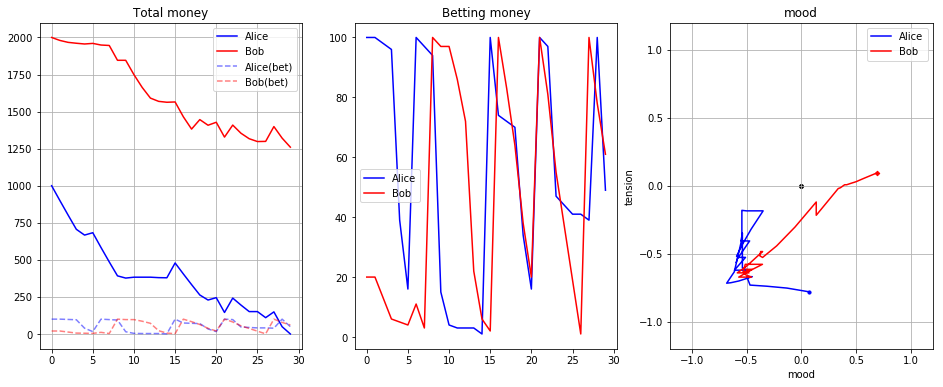

8th game:
reset
30
dealer : Hmm... 13 [('C', '4'), ('D', '9')]

Alice : Hmm... 9 [('C', '9')]

Bob : Hmm... 10 [('C', '10')]

27
dealer : Hmm... 19 [('C', '4'), ('D', '9'), ('H', '6')]

Alice : Hmm... 19 [('C', '9'), ('C', 'Q')]

Bob : BlackJack! 21 [('C', '10'), ('S', 'A')]

24
dealer : Hmm... 19 [('C', '4'), ('D', '9'), ('H', '6')]

Alice : Hmm... 19 [('C', '9'), ('C', 'Q')]

Bob : BlackJack! 21 [('C', '10'), ('S', 'A')]

card_reset: 52
reset
51
dealer : Hmm... 17 [('H', 'J'), ('C', '7')]

Alice : Hmm... 5 [('C', '5')]

Bob : Hmm... 7 [('S', '7')]

48
dealer : Hmm... 17 [('H', 'J'), ('C', '7')]

Alice : Hmm... 9 [('C', '5'), ('H', '4')]

Bob : Hmm... 17 [('S', '7'), ('H', 'K')]

46
dealer : Hmm... 17 [('H', 'J'), ('C', '7')]

Alice : Hmm... 9 [('C', '5'), ('H', '4')]

Bob : Hmm... 17 [('S', '7'), ('H', 'K')]

reset
45
dealer : Hmm... 15 [('H', '5'), ('S', '10')]

Alice : Hmm... 4 [('D', '4')]

Bob : Hmm... 10 [('D', '10')]

42
dealer : Bust!!! 25 [('H', '5'), ('S', '10'), ('S', 'K')]


45
dealer : Hmm... 19 [('C', 'A'), ('D', 'A'), ('H', 'A'), ('C', '6')]

Alice : Hmm... 14 [('H', '10'), ('S', '4')]

Bob : Hmm... 13 [('S', '3'), ('D', 'K')]

44
dealer : Hmm... 19 [('C', 'A'), ('D', 'A'), ('H', 'A'), ('C', '6')]

Alice : Hmm... 14 [('H', '10'), ('S', '4')]

Bob : Hmm... 13 [('S', '3'), ('D', 'K')]

reset
43
dealer : Hmm... 15 [('H', 'J'), ('D', '5')]

Alice : Hmm... 9 [('C', '9')]

Bob : Hmm... 8 [('C', '8')]

40
dealer : Bust!!! 23 [('H', 'J'), ('D', '5'), ('S', '8')]

Alice : Hmm... 19 [('C', '9'), ('C', 'Q')]

Bob : Hmm... 18 [('C', '8'), ('D', 'Q')]

37
dealer : Bust!!! 23 [('H', 'J'), ('D', '5'), ('S', '8')]

Alice : Hmm... 19 [('C', '9'), ('C', 'Q')]

Bob : Hmm... 18 [('C', '8'), ('D', 'Q')]

reset
36
dealer : Hmm... 14 [('D', '8'), ('S', '6')]

Alice : Hmm... 10 [('D', '10')]

Bob : Hmm... 10 [('C', 'J')]

33
dealer : BlackJack! 21 [('D', '8'), ('S', '6'), ('H', '7')]

Alice : Hmm... 16 [('D', '10'), ('H', '6')]

Bob : Hmm... 18 [('C', 'J'), ('H', '8')]

30
de

36
dealer : Hmm... 11 [('S', '9'), ('H', '2')]

Alice : Hmm... 10 [('D', 'K')]

Bob : Hmm... 10 [('C', 'K')]

33
dealer : Hmm... 12 [('S', '9'), ('H', '2'), ('S', 'A')]

Alice : Hmm... 20 [('D', 'K'), ('D', 'Q')]

Bob : Hmm... 12 [('C', 'K'), ('D', '2')]

30
dealer : Hmm... 19 [('S', '9'), ('H', '2'), ('S', 'A'), ('C', '7')]

Alice : Hmm... 20 [('D', 'K'), ('D', 'Q')]

Bob : Hmm... 12 [('C', 'K'), ('D', '2')]

29
dealer : Hmm... 19 [('S', '9'), ('H', '2'), ('S', 'A'), ('C', '7')]

Alice : Hmm... 20 [('D', 'K'), ('D', 'Q')]

Bob : Hmm... 12 [('C', 'K'), ('D', '2')]

card_reset: 52
reset
51
dealer : Hmm... 20 [('S', 'Q'), ('H', '10')]

Alice : Hmm... 11 [('H', 'A')]

Bob : Hmm... 10 [('D', 'K')]

48
dealer : Hmm... 20 [('S', 'Q'), ('H', '10')]

Alice : BlackJack! 21 [('H', 'A'), ('S', '10')]

Bob : Hmm... 18 [('D', 'K'), ('C', '8')]

46
dealer : Hmm... 20 [('S', 'Q'), ('H', '10')]

Alice : BlackJack! 21 [('H', 'A'), ('S', '10')]

Bob : Hmm... 18 [('D', 'K'), ('C', '8')]

reset
45
dealer 

Alice : Hmm... 10 [('H', 'K')]

Bob : Hmm... 10 [('S', 'J')]

41
dealer : Bust!!! 24 [('C', '4'), ('C', '10'), ('H', 'Q')]

Alice : Hmm... 14 [('H', 'K'), ('S', '4')]

Bob : BlackJack! 21 [('S', 'J'), ('H', 'A')]

38
dealer : Bust!!! 24 [('C', '4'), ('C', '10'), ('H', 'Q')]

Alice : Hmm... 14 [('H', 'K'), ('S', '4')]

Bob : BlackJack! 21 [('S', 'J'), ('H', 'A')]

reset
37
dealer : Hmm... 18 [('D', 'A'), ('C', '7')]

Alice : Hmm... 8 [('C', '8')]

Bob : Hmm... 10 [('H', '10')]

34
dealer : Hmm... 18 [('D', 'A'), ('C', '7')]

Alice : Hmm... 13 [('C', '8'), ('D', '5')]

Bob : Hmm... 17 [('H', '10'), ('D', '7')]

32
dealer : Hmm... 18 [('D', 'A'), ('C', '7')]

Alice : Hmm... 13 [('C', '8'), ('D', '5')]

Bob : Hmm... 17 [('H', '10'), ('D', '7')]

reset
31
dealer : Hmm... 16 [('S', '7'), ('D', '9')]

Alice : Hmm... 3 [('S', '3')]

Bob : Hmm... 9 [('S', '9')]

28
dealer : Bust!!! 26 [('S', '7'), ('D', '9'), ('S', '10')]

Alice : Hmm... 13 [('S', '3'), ('H', 'J')]

Bob : Hmm... 19 [('S', '9'),

44
dealer : Hmm... 18 [('C', '3'), ('C', '6'), ('C', '2'), ('H', '4'), ('H', '3')]

Alice : Hmm... 15 [('S', '6'), ('S', '9')]

Bob : BlackJack! 21 [('S', 'A'), ('S', 'Q')]

43
dealer : Hmm... 18 [('C', '3'), ('C', '6'), ('C', '2'), ('H', '4'), ('H', '3')]

Alice : Hmm... 15 [('S', '6'), ('S', '9')]

Bob : BlackJack! 21 [('S', 'A'), ('S', 'Q')]

45 --------------------------------------------------------------------------------
12th game:
reset
42
dealer : Hmm... 14 [('C', 'Q'), ('S', '4')]

Alice : Hmm... 11 [('C', 'A')]

Bob : Hmm... 5 [('H', '5')]

39
dealer : Hmm... 16 [('C', 'Q'), ('S', '4'), ('H', '2')]

Alice : BlackJack! 21 [('C', 'A'), ('D', '10')]

Bob : Hmm... 13 [('H', '5'), ('S', '8')]

36
dealer : Bust!!! 26 [('C', 'Q'), ('S', '4'), ('H', '2'), ('H', '10')]

Alice : BlackJack! 21 [('C', 'A'), ('D', '10')]

Bob : Hmm... 13 [('H', '5'), ('S', '8')]

35
dealer : Bust!!! 26 [('C', 'Q'), ('S', '4'), ('H', '2'), ('H', '10')]

Alice : BlackJack! 21 [('C', 'A'), ('D', '10')]

Bob

30
dealer : BlackJack! 21 [('C', '2'), ('S', 'Q'), ('S', '9')]

Alice : Hmm... 19 [('S', '6'), ('H', '2'), ('C', 'A')]

Bob : Hmm... 19 [('D', 'A'), ('D', '8')]

29
dealer : BlackJack! 21 [('C', '2'), ('S', 'Q'), ('S', '9')]

Alice : Hmm... 19 [('S', '6'), ('H', '2'), ('C', 'A')]

Bob : Hmm... 19 [('D', 'A'), ('D', '8')]

card_reset: 52
reset
51
dealer : Hmm... 16 [('H', '5'), ('H', 'A')]

Alice : Hmm... 10 [('S', 'J')]

Bob : Hmm... 9 [('H', '9')]

48
dealer : Hmm... 20 [('H', '5'), ('H', 'A'), ('H', '4')]

Alice : Hmm... 15 [('S', 'J'), ('C', '5')]

Bob : Hmm... 19 [('H', '9'), ('H', 'J')]

45
dealer : Hmm... 20 [('H', '5'), ('H', 'A'), ('H', '4')]

Alice : Hmm... 15 [('S', 'J'), ('C', '5')]

Bob : Hmm... 19 [('H', '9'), ('H', 'J')]

reset
44
dealer : Hmm... 11 [('S', '4'), ('H', '7')]

Alice : Hmm... 4 [('C', '4')]

Bob : Hmm... 3 [('S', '3')]

41
dealer : Hmm... 13 [('S', '4'), ('H', '7'), ('D', '2')]

Alice : Hmm... 8 [('C', '4'), ('D', '4')]

Bob : Hmm... 14 [('S', '3'), ('C', 'A

45
dealer : Hmm... 12 [('D', 'J'), ('H', '2')]

Alice : Hmm... 3 [('D', '3')]

Bob : Hmm... 6 [('D', '6')]

42
dealer : Hmm... 15 [('D', 'J'), ('H', '2'), ('H', '3')]

Alice : Hmm... 12 [('D', '3'), ('D', '9')]

Bob : Hmm... 8 [('D', '6'), ('C', '2')]

39
dealer : Hmm... 19 [('D', 'J'), ('H', '2'), ('H', '3'), ('S', '4')]

Alice : Hmm... 12 [('D', '3'), ('D', '9')]

Bob : Hmm... 8 [('D', '6'), ('C', '2')]

38
dealer : Hmm... 19 [('D', 'J'), ('H', '2'), ('H', '3'), ('S', '4')]

Alice : Hmm... 12 [('D', '3'), ('D', '9')]

Bob : Hmm... 8 [('D', '6'), ('C', '2')]

reset
37
dealer : Hmm... 15 [('D', '4'), ('D', 'A')]

Alice : Hmm... 5 [('H', '5')]

Bob : Hmm... 9 [('C', '9')]

34
dealer : Bust!!! 25 [('D', '4'), ('D', 'A'), ('H', 'Q')]

Alice : Hmm... 12 [('H', '5'), ('D', '7')]

Bob : Hmm... 12 [('C', '9'), ('C', '3')]

31
dealer : Bust!!! 25 [('D', '4'), ('D', 'A'), ('H', 'Q')]

Alice : Hmm... 12 [('H', '5'), ('D', '7')]

Bob : Hmm... 12 [('C', '9'), ('C', '3')]

reset
30
dealer : BlackJa

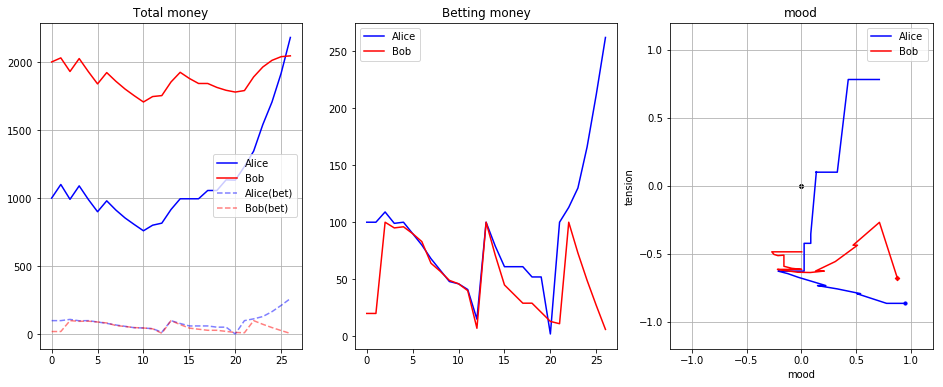

15th game:
reset
29
dealer : Hmm... 17 [('C', '9'), ('H', '8')]

Alice : Hmm... 5 [('D', '5')]

Bob : Hmm... 11 [('C', 'A')]

26
dealer : Hmm... 17 [('C', '9'), ('H', '8')]

Alice : Hmm... 15 [('D', '5'), ('S', '10')]

Bob : Hmm... 16 [('C', 'A'), ('C', '5')]

24
dealer : Hmm... 17 [('C', '9'), ('H', '8')]

Alice : Hmm... 15 [('D', '5'), ('S', '10')]

Bob : Hmm... 16 [('C', 'A'), ('C', '5')]

card_reset: 52
reset
51
dealer : Hmm... 20 [('C', '10'), ('H', '10')]

Alice : Hmm... 10 [('S', 'K')]

Bob : Hmm... 10 [('D', 'Q')]

48
dealer : Hmm... 20 [('C', '10'), ('H', '10')]

Alice : Hmm... 13 [('S', 'K'), ('S', '3')]

Bob : Hmm... 13 [('D', 'Q'), ('C', '3')]

46
dealer : Hmm... 20 [('C', '10'), ('H', '10')]

Alice : Hmm... 13 [('S', 'K'), ('S', '3')]

Bob : Hmm... 13 [('D', 'Q'), ('C', '3')]

reset
45
dealer : Hmm... 13 [('D', '8'), ('S', '5')]

Alice : Hmm... 10 [('S', 'Q')]

Bob : Hmm... 7 [('S', '7')]

42
dealer : Hmm... 19 [('D', '8'), ('S', '5'), ('C', '6')]

Alice : Hmm... 12 [('S',

reset
30
dealer : Hmm... 6 [('D', '4'), ('H', '2')]

Alice : Hmm... 10 [('C', 'J')]

Bob : Hmm... 10 [('S', 'K')]

27
dealer : Hmm... 13 [('D', '4'), ('H', '2'), ('D', '7')]

Alice : Hmm... 19 [('C', 'J'), ('C', '9')]

Bob : Hmm... 14 [('S', 'K'), ('S', '4')]

24
dealer : Hmm... 14 [('D', '4'), ('H', '2'), ('D', '7'), ('S', 'A')]

Alice : Hmm... 19 [('C', 'J'), ('C', '9')]

Bob : Hmm... 14 [('S', 'K'), ('S', '4')]

23
dealer : Bust!!! 24 [('D', '4'), ('H', '2'), ('D', '7'), ('S', 'A'), ('H', 'J')]

Alice : Hmm... 19 [('C', 'J'), ('C', '9')]

Bob : Hmm... 14 [('S', 'K'), ('S', '4')]

22
dealer : Bust!!! 24 [('D', '4'), ('H', '2'), ('D', '7'), ('S', 'A'), ('H', 'J')]

Alice : Hmm... 19 [('C', 'J'), ('C', '9')]

Bob : Hmm... 14 [('S', 'K'), ('S', '4')]

card_reset: 52
reset
51
dealer : Hmm... 15 [('C', '5'), ('D', 'K')]

Alice : Hmm... 8 [('D', '8')]

Bob : Hmm... 11 [('C', 'A')]

48
dealer : Bust!!! 23 [('C', '5'), ('D', 'K'), ('H', '8')]

Alice : Hmm... 11 [('D', '8'), ('H', '3')]

Bob 

reset
37
dealer : Hmm... 14 [('C', '4'), ('C', '10')]

Alice : Hmm... 10 [('S', 'Q')]

Bob : Hmm... 5 [('C', '5')]

34
dealer : Bust!!! 22 [('C', '4'), ('C', '10'), ('H', '8')]

Alice : Hmm... 15 [('S', 'Q'), ('S', '5')]

Bob : Hmm... 14 [('C', '5'), ('C', '9')]

31
dealer : Bust!!! 22 [('C', '4'), ('C', '10'), ('H', '8')]

Alice : Hmm... 15 [('S', 'Q'), ('S', '5')]

Bob : Hmm... 14 [('C', '5'), ('C', '9')]

reset
30
dealer : Hmm... 12 [('H', '3'), ('S', '9')]

Alice : Hmm... 7 [('S', '7')]

Bob : Hmm... 10 [('C', 'J')]

27
dealer : Hmm... 15 [('H', '3'), ('S', '9'), ('D', '3')]

Alice : Hmm... 17 [('S', '7'), ('S', 'J')]

Bob : Hmm... 17 [('C', 'J'), ('D', '7')]

24
dealer : Hmm... 17 [('H', '3'), ('S', '9'), ('D', '3'), ('D', '2')]

Alice : Hmm... 17 [('S', '7'), ('S', 'J')]

Bob : Hmm... 17 [('C', 'J'), ('D', '7')]

23
dealer : Hmm... 17 [('H', '3'), ('S', '9'), ('D', '3'), ('D', '2')]

Alice : Hmm... 17 [('S', '7'), ('S', 'J')]

Bob : Hmm... 17 [('C', 'J'), ('D', '7')]

card_reset:

reset
44
dealer : Hmm... 15 [('S', '6'), ('D', '9')]

Alice : Hmm... 4 [('C', '4')]

Bob : Hmm... 2 [('C', '2')]

41
dealer : Hmm... 16 [('S', '6'), ('D', '9'), ('S', 'A')]

Alice : Hmm... 14 [('C', '4'), ('C', 'Q')]

Bob : Hmm... 12 [('C', '2'), ('H', 'J')]

38
dealer : Hmm... 17 [('S', '6'), ('D', '9'), ('S', 'A'), ('D', 'A')]

Alice : Hmm... 14 [('C', '4'), ('C', 'Q')]

Bob : Hmm... 12 [('C', '2'), ('H', 'J')]

37
dealer : Hmm... 17 [('S', '6'), ('D', '9'), ('S', 'A'), ('D', 'A')]

Alice : Hmm... 14 [('C', '4'), ('C', 'Q')]

Bob : Hmm... 12 [('C', '2'), ('H', 'J')]

reset
36
dealer : Hmm... 17 [('D', '7'), ('S', 'Q')]

Alice : Hmm... 5 [('D', '5')]

Bob : Hmm... 8 [('C', '8')]

33
dealer : Hmm... 17 [('D', '7'), ('S', 'Q')]

Alice : Hmm... 13 [('D', '5'), ('H', '8')]

Bob : Hmm... 19 [('C', '8'), ('C', 'A')]

31
dealer : Hmm... 17 [('D', '7'), ('S', 'Q')]

Alice : Hmm... 13 [('D', '5'), ('H', '8')]

Bob : Hmm... 19 [('C', '8'), ('C', 'A')]

reset
30
dealer : Hmm... 14 [('S', '4'), (

Bob : Hmm... 13 [('H', '10'), ('C', '3')]

reset
30
dealer : Hmm... 13 [('D', '10'), ('D', '3')]

Alice : Hmm... 9 [('C', '9')]

Bob : Hmm... 10 [('H', 'Q')]

27
dealer : Bust!!! 23 [('D', '10'), ('D', '3'), ('S', 'J')]

Alice : Hmm... 19 [('C', '9'), ('C', 'K')]

Bob : BlackJack! 21 [('H', 'Q'), ('C', 'A')]

24
dealer : Bust!!! 23 [('D', '10'), ('D', '3'), ('S', 'J')]

Alice : Hmm... 19 [('C', '9'), ('C', 'K')]

Bob : BlackJack! 21 [('H', 'Q'), ('C', 'A')]

card_reset: 52
reset
51
dealer : Hmm... 20 [('S', '10'), ('C', '10')]

Alice : Hmm... 3 [('D', '3')]

Bob : Hmm... 10 [('S', 'K')]

48
dealer : Hmm... 20 [('S', '10'), ('C', '10')]

Alice : Hmm... 6 [('D', '3'), ('S', '3')]

Bob : Hmm... 14 [('S', 'K'), ('D', '4')]

46
dealer : Hmm... 20 [('S', '10'), ('C', '10')]

Alice : Hmm... 6 [('D', '3'), ('S', '3')]

Bob : Hmm... 14 [('S', 'K'), ('D', '4')]

reset
45
dealer : Hmm... 10 [('H', '2'), ('H', '8')]

Alice : Hmm... 5 [('D', '5')]

Bob : Hmm... 3 [('C', '3')]

42
dealer : Hmm... 13


Alice : Hmm... 2 [('C', '2')]

Bob : Hmm... 3 [('S', '3')]

28
dealer : BlackJack! 21 [('D', 'A'), ('S', '10')]

Alice : Hmm... 11 [('C', '2'), ('H', '9')]

Bob : Hmm... 12 [('S', '3'), ('S', '9')]

26
dealer : BlackJack! 21 [('D', 'A'), ('S', '10')]

Alice : Hmm... 11 [('C', '2'), ('H', '9')]

Bob : Hmm... 12 [('S', '3'), ('S', '9')]

card_reset: 52
reset
51
dealer : Hmm... 15 [('C', '7'), ('S', '8')]

Alice : Hmm... 3 [('D', '3')]

Bob : Hmm... 10 [('C', 'K')]

48
dealer : Bust!!! 22 [('C', '7'), ('S', '8'), ('S', '7')]

Alice : Hmm... 5 [('D', '3'), ('C', '2')]

Bob : Hmm... 20 [('C', 'K'), ('D', 'J')]

45
dealer : Bust!!! 22 [('C', '7'), ('S', '8'), ('S', '7')]

Alice : Hmm... 5 [('D', '3'), ('C', '2')]

Bob : Hmm... 20 [('C', 'K'), ('D', 'J')]

reset
44
dealer : Hmm... 7 [('S', '5'), ('S', '2')]

Alice : Hmm... 9 [('C', '9')]

Bob : Hmm... 10 [('H', 'K')]

41
dealer : Hmm... 13 [('S', '5'), ('S', '2'), ('D', '6')]

Alice : Hmm... 13 [('C', '9'), ('H', '4')]

Bob : Hmm... 15 [('H'


38
dealer : Bust!!! 22 [('D', 'Q'), ('D', '6'), ('C', '6')]

Alice : Hmm... 11 [('H', '2'), ('C', '9')]

Bob : Hmm... 6 [('D', '2'), ('S', '4')]

reset
37
dealer : Hmm... 13 [('S', '6'), ('D', '7')]

Alice : Hmm... 2 [('C', '2')]

Bob : Hmm... 10 [('H', 'J')]

34
dealer : Hmm... 20 [('S', '6'), ('D', '7'), ('C', '7')]

Alice : Hmm... 9 [('C', '2'), ('S', '7')]

Bob : Hmm... 20 [('H', 'J'), ('S', 'J')]

31
dealer : Hmm... 20 [('S', '6'), ('D', '7'), ('C', '7')]

Alice : Hmm... 9 [('C', '2'), ('S', '7')]

Bob : Hmm... 20 [('H', 'J'), ('S', 'J')]

reset
30
dealer : Hmm... 15 [('H', '5'), ('S', '10')]

Alice : Hmm... 10 [('C', '10')]

Bob : Hmm... 3 [('S', '3')]

27
dealer : Bust!!! 23 [('H', '5'), ('S', '10'), ('S', '8')]

Alice : Hmm... 20 [('C', '10'), ('H', 'Q')]

Bob : Hmm... 13 [('S', '3'), ('D', '10')]

24
dealer : Bust!!! 23 [('H', '5'), ('S', '10'), ('S', '8')]

Alice : Hmm... 20 [('C', '10'), ('H', 'Q')]

Bob : Hmm... 13 [('S', '3'), ('D', '10')]

card_reset: 52
reset
51
dealer 


Alice : Hmm... 6 [('H', '4'), ('S', '2')]

Bob : Hmm... 12 [('H', '8'), ('C', '4')]

39
dealer : Hmm... 18 [('H', '6'), ('C', 'J'), ('D', '2')]

Alice : Hmm... 6 [('H', '4'), ('S', '2')]

Bob : Hmm... 12 [('H', '8'), ('C', '4')]

reset
38
dealer : Hmm... 17 [('S', '6'), ('H', 'A')]

Alice : Hmm... 10 [('H', 'K')]

Bob : Hmm... 10 [('S', '10')]

35
dealer : Hmm... 17 [('S', '6'), ('H', 'A')]

Alice : Hmm... 20 [('H', 'K'), ('D', 'J')]

Bob : Hmm... 19 [('S', '10'), ('S', '9')]

33
dealer : Hmm... 17 [('S', '6'), ('H', 'A')]

Alice : Hmm... 20 [('H', 'K'), ('D', 'J')]

Bob : Hmm... 19 [('S', '10'), ('S', '9')]

reset
32
dealer : Hmm... 14 [('C', '9'), ('S', '5')]

Alice : Hmm... 5 [('D', '5')]

Bob : Hmm... 7 [('S', '7')]

29
dealer : Hmm... 15 [('C', '9'), ('S', '5'), ('D', 'A')]

Alice : Hmm... 15 [('D', '5'), ('C', '10')]

Bob : Hmm... 17 [('S', '7'), ('S', 'K')]

26
dealer : BlackJack! 21 [('C', '9'), ('S', '5'), ('D', 'A'), ('D', '6')]

Alice : Hmm... 15 [('D', '5'), ('C', '10')]



Bob : Hmm... 10 [('D', '10')]

29
dealer : Hmm... 20 [('C', '10'), ('S', 'Q')]

Alice : Hmm... 15 [('D', 'K'), ('H', '5')]

Bob : Hmm... 19 [('D', '10'), ('H', '9')]

27
dealer : Hmm... 20 [('C', '10'), ('S', 'Q')]

Alice : Hmm... 15 [('D', 'K'), ('H', '5')]

Bob : Hmm... 19 [('D', '10'), ('H', '9')]

card_reset: 52
reset
51
dealer : Hmm... 8 [('H', '5'), ('H', '3')]

Alice : Hmm... 2 [('D', '2')]

Bob : Hmm... 10 [('D', 'Q')]

48
dealer : Hmm... 19 [('H', '5'), ('H', '3'), ('C', 'A')]

Alice : Hmm... 13 [('D', '2'), ('H', 'A')]

Bob : Hmm... 20 [('D', 'Q'), ('D', '10')]

45
dealer : Hmm... 19 [('H', '5'), ('H', '3'), ('C', 'A')]

Alice : Hmm... 13 [('D', '2'), ('H', 'A')]

Bob : Hmm... 20 [('D', 'Q'), ('D', '10')]

reset
44
dealer : Hmm... 11 [('H', '7'), ('D', '4')]

Alice : Hmm... 5 [('C', '5')]

Bob : Hmm... 10 [('C', 'Q')]

41
dealer : BlackJack! 21 [('H', '7'), ('D', '4'), ('C', 'K')]

Alice : Hmm... 11 [('C', '5'), ('S', '6')]

Bob : Hmm... 15 [('C', 'Q'), ('D', '5')]

38
dealer

Bob : Hmm... 10 [('D', '7'), ('H', '3')]

25
dealer : BlackJack! 21 [('C', 'J'), ('D', '3'), ('S', '8')]

Alice : Hmm... 17 [('D', '10'), ('H', '7')]

Bob : Hmm... 10 [('D', '7'), ('H', '3')]

card_reset: 52
reset
51
dealer : Hmm... 11 [('D', '9'), ('H', '2')]

Alice : Hmm... 10 [('D', '10')]

Bob : Hmm... 10 [('S', 'J')]

48
dealer : Hmm... 16 [('D', '9'), ('H', '2'), ('S', '5')]

Alice : Hmm... 14 [('D', '10'), ('H', '4')]

Bob : Hmm... 20 [('S', 'J'), ('C', 'Q')]

45
dealer : Bust!!! 22 [('D', '9'), ('H', '2'), ('S', '5'), ('H', '6')]

Alice : Hmm... 14 [('D', '10'), ('H', '4')]

Bob : Hmm... 20 [('S', 'J'), ('C', 'Q')]

44
dealer : Bust!!! 22 [('D', '9'), ('H', '2'), ('S', '5'), ('H', '6')]

Alice : Hmm... 14 [('D', '10'), ('H', '4')]

Bob : Hmm... 20 [('S', 'J'), ('C', 'Q')]

reset
43
dealer : Hmm... 6 [('H', '3'), ('D', '3')]

Alice : Hmm... 9 [('H', '9')]

Bob : Hmm... 11 [('C', 'A')]

40
dealer : Hmm... 13 [('H', '3'), ('D', '3'), ('D', '7')]

Alice : Hmm... 13 [('H', '9'), ('D

44
dealer : Bust!!! 22 [('S', '8'), ('D', '4'), ('C', 'K')]

Alice : Hmm... 20 [('D', 'J'), ('D', '10')]

Bob : Hmm... 13 [('D', '2'), ('S', '4'), ('C', '7')]

reset
43
dealer : Hmm... 18 [('H', 'A'), ('D', '7')]

Alice : Hmm... 3 [('H', '3')]

Bob : Hmm... 6 [('D', '6')]

40
dealer : Hmm... 18 [('H', 'A'), ('D', '7')]

Alice : Hmm... 13 [('H', '3'), ('D', 'K')]

Bob : Hmm... 16 [('D', '6'), ('C', 'Q')]

38
dealer : Hmm... 18 [('H', 'A'), ('D', '7')]

Alice : Hmm... 13 [('H', '3'), ('D', 'K')]

Bob : Hmm... 16 [('D', '6'), ('C', 'Q')]

reset
37
dealer : Hmm... 19 [('H', '9'), ('C', 'J')]

Alice : Hmm... 3 [('D', '3')]

Bob : Hmm... 11 [('D', 'A')]

34
dealer : Hmm... 19 [('H', '9'), ('C', 'J')]

Alice : Hmm... 12 [('D', '3'), ('C', '9')]

Bob : BlackJack! 21 [('D', 'A'), ('H', 'K')]

32
dealer : Hmm... 19 [('H', '9'), ('C', 'J')]

Alice : Hmm... 12 [('D', '3'), ('C', '9')]

Bob : BlackJack! 21 [('D', 'A'), ('H', 'K')]

reset
31
dealer : Hmm... 12 [('S', '2'), ('D', 'Q')]

Alice : Hmm..

Alice : Hmm... 8 [('D', '8')]

Bob : Hmm... 8 [('S', '8')]

27
dealer : Hmm... 20 [('S', '10'), ('D', 'J')]

Alice : Hmm... 16 [('D', '8'), ('H', '8')]

Bob : Hmm... 15 [('S', '8'), ('S', '7')]

25
dealer : Hmm... 20 [('S', '10'), ('D', 'J')]

Alice : Hmm... 16 [('D', '8'), ('H', '8')]

Bob : Hmm... 15 [('S', '8'), ('S', '7')]

card_reset: 52
reset
51
dealer : Hmm... 16 [('D', 'K'), ('H', '6')]

Alice : Hmm... 6 [('C', '6')]

Bob : Hmm... 11 [('C', 'A')]

48
dealer : Bust!!! 26 [('D', 'K'), ('H', '6'), ('H', 'J')]

Alice : Hmm... 10 [('C', '6'), ('D', '4')]

Bob : Hmm... 20 [('C', 'A'), ('H', '9')]

45
dealer : Bust!!! 26 [('D', 'K'), ('H', '6'), ('H', 'J')]

Alice : Hmm... 10 [('C', '6'), ('D', '4')]

Bob : Hmm... 20 [('C', 'A'), ('H', '9')]

reset
44
dealer : Hmm... 14 [('S', 'K'), ('C', '4')]

Alice : Hmm... 10 [('D', 'J')]

Bob : Hmm... 5 [('C', '5')]

41
dealer : Hmm... 18 [('S', 'K'), ('C', '4'), ('H', '4')]

Alice : Hmm... 16 [('D', 'J'), ('S', '6')]

Bob : Hmm... 15 [('C', '5')


Bob : Hmm... 15 [('C', '7'), ('D', '8')]

card_reset: 52
reset
51
dealer : Hmm... 12 [('S', '10'), ('C', '2')]

Alice : Hmm... 9 [('C', '9')]

Bob : Hmm... 7 [('C', '7')]

48
dealer : Bust!!! 22 [('S', '10'), ('C', '2'), ('D', 'J')]

Alice : Hmm... 19 [('C', '9'), ('S', 'Q')]

Bob : Hmm... 17 [('C', '7'), ('S', 'J')]

45
dealer : Bust!!! 22 [('S', '10'), ('C', '2'), ('D', 'J')]

Alice : Hmm... 19 [('C', '9'), ('S', 'Q')]

Bob : Hmm... 17 [('C', '7'), ('S', 'J')]

reset
44
dealer : Hmm... 20 [('C', 'Q'), ('C', 'K')]

Alice : Hmm... 3 [('C', '3')]

Bob : Hmm... 7 [('H', '7')]

41
dealer : Hmm... 20 [('C', 'Q'), ('C', 'K')]

Alice : Hmm... 11 [('C', '3'), ('C', '8')]

Bob : Hmm... 14 [('H', '7'), ('S', '7')]

39
dealer : Hmm... 20 [('C', 'Q'), ('C', 'K')]

Alice : Hmm... 11 [('C', '3'), ('C', '8')]

Bob : Hmm... 14 [('H', '7'), ('S', '7')]

reset
38
dealer : Hmm... 13 [('H', 'A'), ('S', '2')]

Alice : Hmm... 8 [('D', '8')]

Bob : Hmm... 10 [('C', '10')]

35
dealer : Bust!!! 23 [('H', 'A'


Bob : Hmm... 17 [('S', 'Q'), ('S', '7')]

37
dealer : Bust!!! 22 [('D', '5'), ('C', '2'), ('C', '5'), ('S', '10')]

Alice : Hmm... 20 [('D', 'J'), ('H', 'Q')]

Bob : Hmm... 17 [('S', 'Q'), ('S', '7')]

36
dealer : Bust!!! 22 [('D', '5'), ('C', '2'), ('C', '5'), ('S', '10')]

Alice : Hmm... 20 [('D', 'J'), ('H', 'Q')]

Bob : Hmm... 17 [('S', 'Q'), ('S', '7')]

reset
35
dealer : Hmm... 15 [('S', '5'), ('S', 'K')]

Alice : Hmm... 10 [('H', 'K')]

Bob : Hmm... 8 [('H', '8')]

32
dealer : Bust!!! 25 [('S', '5'), ('S', 'K'), ('C', 'K')]

Alice : BlackJack! 21 [('H', 'K'), ('S', 'A')]

Bob : Hmm... 10 [('H', '8'), ('H', '2')]

29
dealer : Bust!!! 25 [('S', '5'), ('S', 'K'), ('C', 'K')]

Alice : BlackJack! 21 [('H', 'K'), ('S', 'A')]

Bob : Hmm... 10 [('H', '8'), ('H', '2')]

card_reset: 52
reset
51
dealer : Hmm... 20 [('S', 'J'), ('H', 'K')]

Alice : Hmm... 7 [('D', '7')]

Bob : Hmm... 8 [('D', '8')]

48
dealer : Hmm... 20 [('S', 'J'), ('H', 'K')]

Alice : Hmm... 17 [('D', '7'), ('D', 'J')]


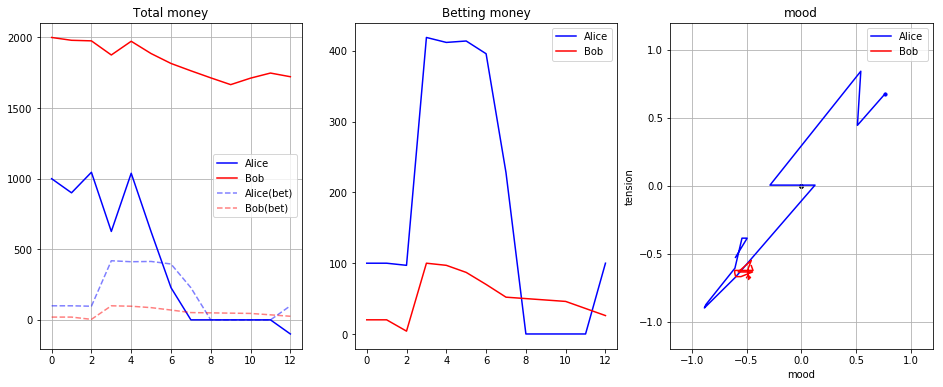

card_reset: 52
8th game:
reset
51
dealer : Hmm... 17 [('D', '7'), ('H', '10')]

Alice : Hmm... 3 [('S', '3')]

Bob : Hmm... 9 [('S', '9')]

48
dealer : Hmm... 17 [('D', '7'), ('H', '10')]

Alice : Hmm... 9 [('S', '3'), ('C', '6')]

Bob : Hmm... 17 [('S', '9'), ('C', '8')]

46
dealer : Hmm... 17 [('D', '7'), ('H', '10')]

Alice : Hmm... 13 [('S', '3'), ('C', '6'), ('S', '4')]

Bob : Hmm... 17 [('S', '9'), ('C', '8')]

45
dealer : Hmm... 17 [('D', '7'), ('H', '10')]

Alice : Hmm... 13 [('S', '3'), ('C', '6'), ('S', '4')]

Bob : Hmm... 17 [('S', '9'), ('C', '8')]

reset
44
dealer : Hmm... 16 [('D', '6'), ('S', 'Q')]

Alice : Hmm... 10 [('C', 'K')]

Bob : Hmm... 2 [('D', '2')]

41
dealer : Bust!!! 24 [('D', '6'), ('S', 'Q'), ('D', '8')]

Alice : Hmm... 17 [('C', 'K'), ('S', '7')]

Bob : Hmm... 8 [('D', '2'), ('S', '6')]

38
dealer : Bust!!! 24 [('D', '6'), ('S', 'Q'), ('D', '8')]

Alice : Hmm... 17 [('C', 'K'), ('S', '7')]

Bob : Hmm... 8 [('D', '2'), ('S', '6')]

reset
37
dealer : Hmm... 


Alice : Hmm... 8 [('D', '8')]

Bob : Hmm... 7 [('S', '7')]

41
dealer : Hmm... 20 [('H', 'J'), ('C', '4'), ('C', '6')]

Alice : Hmm... 18 [('D', '8'), ('D', '10')]

Bob : Hmm... 12 [('S', '7'), ('D', '5')]

38
dealer : Hmm... 20 [('H', 'J'), ('C', '4'), ('C', '6')]

Alice : Hmm... 18 [('D', '8'), ('D', '10')]

Bob : Hmm... 12 [('S', '7'), ('D', '5')]

reset
37
dealer : Hmm... 13 [('D', 'J'), ('C', '3')]

Alice : Hmm... 8 [('C', '8')]

Bob : Hmm... 11 [('D', 'A')]

34
dealer : Bust!!! 23 [('D', 'J'), ('C', '3'), ('S', 'J')]

Alice : Hmm... 13 [('C', '8'), ('C', '5')]

Bob : Hmm... 14 [('D', 'A'), ('D', '3')]

31
dealer : Bust!!! 23 [('D', 'J'), ('C', '3'), ('S', 'J')]

Alice : Hmm... 13 [('C', '8'), ('C', '5')]

Bob : Hmm... 14 [('D', 'A'), ('D', '3')]

reset
30
dealer : Hmm... 7 [('H', '4'), ('H', '3')]

Alice : Hmm... 9 [('C', '9')]

Bob : Hmm... 11 [('S', 'A')]

27
dealer : Hmm... 17 [('H', '4'), ('H', '3'), ('H', 'Q')]

Alice : Hmm... 16 [('C', '9'), ('D', '7')]

Bob : Hmm... 18 [(


Alice : BlackJack! 21 [('D', 'J'), ('D', 'A')]

Bob : Hmm... 16 [('S', 'Q'), ('S', '6')]

34
dealer : Hmm... 17 [('H', '6'), ('C', 'A')]

Alice : BlackJack! 21 [('D', 'J'), ('D', 'A')]

Bob : Hmm... 16 [('S', 'Q'), ('S', '6')]

reset
33
dealer : Hmm... 8 [('D', '3'), ('C', '5')]

Alice : Hmm... 4 [('S', '4')]

Bob : Hmm... 10 [('H', '10')]

30
dealer : Hmm... 11 [('D', '3'), ('C', '5'), ('C', '3')]

Alice : Hmm... 14 [('S', '4'), ('H', 'Q')]

Bob : Hmm... 20 [('H', '10'), ('C', 'K')]

27
dealer : Hmm... 13 [('D', '3'), ('C', '5'), ('C', '3'), ('C', '2')]

Alice : Hmm... 14 [('S', '4'), ('H', 'Q')]

Bob : Hmm... 20 [('H', '10'), ('C', 'K')]

26
dealer : Hmm... 18 [('D', '3'), ('C', '5'), ('C', '3'), ('C', '2'), ('H', '5')]

Alice : Hmm... 14 [('S', '4'), ('H', 'Q')]

Bob : Hmm... 20 [('H', '10'), ('C', 'K')]

25
dealer : Hmm... 18 [('D', '3'), ('C', '5'), ('C', '3'), ('C', '2'), ('H', '5')]

Alice : Hmm... 14 [('S', '4'), ('H', 'Q')]

Bob : Hmm... 20 [('H', '10'), ('C', 'K')]

card_res

23
dealer : Hmm... 20 [('C', '2'), ('S', '2'), ('D', '4'), ('H', '4'), ('C', '8')]

Alice : Hmm... 16 [('D', '6'), ('D', 'Q')]

Bob : Hmm... 17 [('D', 'J'), ('C', '7')]

22
dealer : Hmm... 20 [('C', '2'), ('S', '2'), ('D', '4'), ('H', '4'), ('C', '8')]

Alice : Hmm... 16 [('D', '6'), ('D', 'Q')]

Bob : Hmm... 17 [('D', 'J'), ('C', '7')]

card_reset: 52
reset
51
dealer : BlackJack! 21 [('S', 'K'), ('S', 'A')]

Alice : Hmm... 10 [('C', '10')]

Bob : Hmm... 4 [('D', '4')]

48
dealer : BlackJack! 21 [('S', 'K'), ('S', 'A')]

Alice : Hmm... 20 [('C', '10'), ('C', 'K')]

Bob : Hmm... 13 [('D', '4'), ('S', '9')]

46
dealer : BlackJack! 21 [('S', 'K'), ('S', 'A')]

Alice : Hmm... 20 [('C', '10'), ('C', 'K')]

Bob : Hmm... 13 [('D', '4'), ('S', '9')]

reset
45
dealer : Hmm... 13 [('H', 'K'), ('C', '3')]

Alice : Hmm... 10 [('C', 'J')]

Bob : Hmm... 10 [('S', '10')]

42
dealer : Hmm... 19 [('H', 'K'), ('C', '3'), ('C', '6')]

Alice : Hmm... 14 [('C', 'J'), ('C', '4')]

Bob : Hmm... 18 [('S', '10

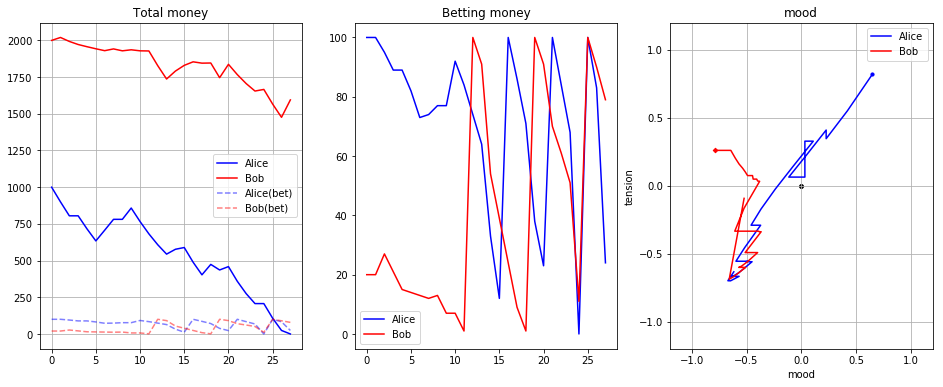

12th game:
reset
37
dealer : Hmm... 8 [('C', '4'), ('H', '4')]

Alice : Hmm... 2 [('D', '2')]

Bob : Hmm... 10 [('C', '10')]

34
dealer : Hmm... 15 [('C', '4'), ('H', '4'), ('C', '7')]

Alice : Hmm... 13 [('D', '2'), ('S', 'A')]

Bob : Hmm... 20 [('C', '10'), ('D', '10')]

31
dealer : Bust!!! 25 [('C', '4'), ('H', '4'), ('C', '7'), ('H', 'K')]

Alice : Hmm... 13 [('D', '2'), ('S', 'A')]

Bob : Hmm... 20 [('C', '10'), ('D', '10')]

30
dealer : Bust!!! 25 [('C', '4'), ('H', '4'), ('C', '7'), ('H', 'K')]

Alice : Hmm... 13 [('D', '2'), ('S', 'A')]

Bob : Hmm... 20 [('C', '10'), ('D', '10')]

reset
29
dealer : Hmm... 5 [('S', '3'), ('C', '2')]

Alice : Hmm... 10 [('C', 'J')]

Bob : Hmm... 3 [('D', '3')]

26
dealer : Hmm... 15 [('S', '3'), ('C', '2'), ('H', '10')]

Alice : Hmm... 17 [('C', 'J'), ('H', '7')]

Bob : Hmm... 14 [('D', '3'), ('D', 'A')]

23
dealer : Bust!!! 25 [('S', '3'), ('C', '2'), ('H', '10'), ('S', 'K')]

Alice : Hmm... 17 [('C', 'J'), ('H', '7')]

Bob : Hmm... 14 [('D', '3

Bob : Hmm... 15 [('S', '10'), ('C', '5')]

33
dealer : Hmm... 20 [('S', '9'), ('D', 'A')]

Alice : Hmm... 20 [('C', '10'), ('C', 'J')]

Bob : Hmm... 15 [('S', '10'), ('C', '5')]

reset
32
dealer : Hmm... 13 [('D', '7'), ('D', '6')]

Alice : Hmm... 3 [('C', '3')]

Bob : Hmm... 7 [('C', '7')]

29
dealer : Bust!!! 23 [('D', '7'), ('D', '6'), ('H', '10')]

Alice : Hmm... 14 [('C', '3'), ('C', 'A')]

Bob : Hmm... 17 [('C', '7'), ('D', '10')]

26
dealer : Bust!!! 23 [('D', '7'), ('D', '6'), ('H', '10')]

Alice : Hmm... 14 [('C', '3'), ('C', 'A')]

Bob : Hmm... 17 [('C', '7'), ('D', '10')]

card_reset: 52
reset
51
dealer : Hmm... 19 [('S', '9'), ('S', 'Q')]

Alice : Hmm... 9 [('D', '9')]

Bob : Hmm... 5 [('S', '5')]

48
dealer : Hmm... 19 [('S', '9'), ('S', 'Q')]

Alice : Hmm... 19 [('D', '9'), ('S', '10')]

Bob : Hmm... 9 [('S', '5'), ('H', '4')]

46
dealer : Hmm... 19 [('S', '9'), ('S', 'Q')]

Alice : Hmm... 19 [('D', '9'), ('S', '10')]

Bob : Hmm... 9 [('S', '5'), ('H', '4')]

reset
45
dea

Alice : Hmm... 10 [('S', 'J')]

Bob : Hmm... 11 [('H', 'A')]

28
dealer : Hmm... 17 [('C', 'K'), ('H', '7')]

Alice : Hmm... 20 [('S', 'J'), ('H', 'J')]

Bob : Hmm... 18 [('H', 'A'), ('D', '7')]

26
dealer : Hmm... 17 [('C', 'K'), ('H', '7')]

Alice : Hmm... 20 [('S', 'J'), ('H', 'J')]

Bob : Hmm... 18 [('H', 'A'), ('D', '7')]

card_reset: 52
reset
51
dealer : Hmm... 13 [('H', '2'), ('D', 'A')]

Alice : Hmm... 7 [('H', '7')]

Bob : Hmm... 4 [('C', '4')]

48
dealer : Bust!!! 23 [('H', '2'), ('D', 'A'), ('H', 'Q')]

Alice : Hmm... 10 [('H', '7'), ('D', '3')]

Bob : Hmm... 12 [('C', '4'), ('H', '8')]

45
dealer : Bust!!! 23 [('H', '2'), ('D', 'A'), ('H', 'Q')]

Alice : Hmm... 10 [('H', '7'), ('D', '3')]

Bob : Hmm... 12 [('C', '4'), ('H', '8')]

reset
44
dealer : Hmm... 13 [('H', '6'), ('D', '7')]

Alice : Hmm... 8 [('D', '8')]

Bob : Hmm... 10 [('S', '10')]

41
dealer : Bust!!! 23 [('H', '6'), ('D', '7'), ('H', 'K')]

Alice : Hmm... 18 [('D', '8'), ('H', 'J')]

Bob : Hmm... 19 [('S', '10


Bob : Hmm... 8 [('D', '8')]

40
dealer : Hmm... 19 [('S', '9'), ('D', 'J')]

Alice : Hmm... 20 [('S', 'Q'), ('D', 'Q')]

Bob : Hmm... 15 [('D', '8'), ('S', '7')]

38
dealer : Hmm... 19 [('S', '9'), ('D', 'J')]

Alice : Hmm... 20 [('S', 'Q'), ('D', 'Q')]

Bob : Hmm... 15 [('D', '8'), ('S', '7')]

reset
37
dealer : Hmm... 19 [('H', 'J'), ('C', '9')]

Alice : Hmm... 3 [('H', '3')]

Bob : Hmm... 3 [('S', '3')]

34
dealer : Hmm... 19 [('H', 'J'), ('C', '9')]

Alice : Hmm... 12 [('H', '3'), ('D', '9')]

Bob : Hmm... 5 [('S', '3'), ('H', '2')]

32
dealer : Hmm... 19 [('H', 'J'), ('C', '9')]

Alice : Hmm... 12 [('H', '3'), ('D', '9')]

Bob : Hmm... 5 [('S', '3'), ('H', '2')]

reset
31
dealer : Hmm... 13 [('D', '3'), ('C', 'K')]

Alice : Hmm... 10 [('S', '10')]

Bob : Hmm... 8 [('H', '8')]

28
dealer : Bust!!! 22 [('D', '3'), ('C', 'K'), ('H', '9')]

Alice : Hmm... 17 [('S', '10'), ('C', '7')]

Bob : Hmm... 18 [('H', '8'), ('D', 'K')]

25
dealer : Bust!!! 22 [('D', '3'), ('C', 'K'), ('H', '9')

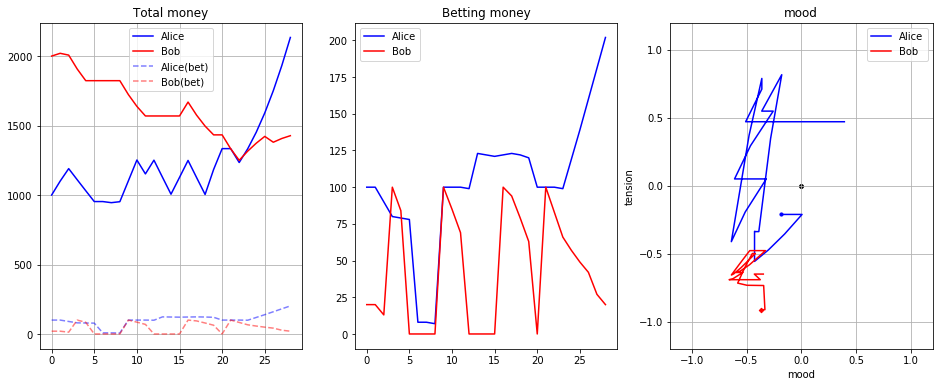

18th game:
reset
44
dealer : Hmm... 16 [('D', '7'), ('S', '9')]

Alice : Hmm... 10 [('C', 'K')]

Bob : Hmm... 3 [('H', '3')]

41
dealer : Bust!!! 23 [('D', '7'), ('S', '9'), ('C', '7')]

Alice : Hmm... 20 [('C', 'K'), ('H', 'J')]

Bob : Hmm... 13 [('H', '3'), ('S', 'K')]

38
dealer : Bust!!! 23 [('D', '7'), ('S', '9'), ('C', '7')]

Alice : Hmm... 20 [('C', 'K'), ('H', 'J')]

Bob : Hmm... 13 [('H', '3'), ('S', 'K')]

reset
37
dealer : BlackJack! 21 [('C', 'A'), ('D', '10')]

Alice : Hmm... 4 [('C', '4')]

Bob : Hmm... 2 [('D', '2')]

34
dealer : BlackJack! 21 [('C', 'A'), ('D', '10')]

Alice : Hmm... 8 [('C', '4'), ('S', '4')]

Bob : Hmm... 8 [('D', '2'), ('H', '6')]

32
dealer : BlackJack! 21 [('C', 'A'), ('D', '10')]

Alice : Hmm... 8 [('C', '4'), ('S', '4')]

Bob : Hmm... 8 [('D', '2'), ('H', '6')]

reset
31
dealer : Hmm... 18 [('C', '8'), ('D', 'J')]

Alice : Hmm... 11 [('D', 'A')]

Bob : Hmm... 9 [('D', '9')]

28
dealer : Hmm... 18 [('C', '8'), ('D', 'J')]

Alice : BlackJack! 21 [(


25
dealer : Hmm... 20 [('C', 'K'), ('S', 'J')]

Alice : Hmm... 7 [('H', '2'), ('H', '5')]

Bob : Hmm... 16 [('D', 'K'), ('D', '6')]

card_reset: 52
reset
51
dealer : BlackJack! 21 [('S', 'K'), ('C', 'A')]

Alice : Hmm... 8 [('C', '8')]

Bob : Hmm... 10 [('S', 'J')]

48
dealer : BlackJack! 21 [('S', 'K'), ('C', 'A')]

Alice : Hmm... 18 [('C', '8'), ('C', 'J')]

Bob : Hmm... 19 [('S', 'J'), ('C', '9')]

46
dealer : BlackJack! 21 [('S', 'K'), ('C', 'A')]

Alice : Hmm... 18 [('C', '8'), ('C', 'J')]

Bob : Hmm... 19 [('S', 'J'), ('C', '9')]

reset
45
dealer : Hmm... 10 [('S', '8'), ('D', '2')]

Alice : Hmm... 10 [('D', 'J')]

Bob : Hmm... 9 [('S', '9')]

42
dealer : Hmm... 15 [('S', '8'), ('D', '2'), ('H', '5')]

Alice : Hmm... 16 [('D', 'J'), ('C', '6')]

Bob : Hmm... 19 [('S', '9'), ('H', '10')]

39
dealer : Hmm... 18 [('S', '8'), ('D', '2'), ('H', '5'), ('H', '3')]

Alice : Hmm... 16 [('D', 'J'), ('C', '6')]

Bob : Hmm... 19 [('S', '9'), ('H', '10')]

38
dealer : Hmm... 18 [('S', '8'), 

42
dealer : Hmm... 20 [('D', 'K'), ('C', 'K')]

Alice : Hmm... 14 [('S', '8'), ('D', '6')]

Bob : Hmm... 13 [('S', '4'), ('C', '9')]

40
dealer : Hmm... 20 [('D', 'K'), ('C', 'K')]

Alice : Hmm... 14 [('S', '8'), ('D', '6')]

Bob : Hmm... 13 [('S', '4'), ('C', '9')]

reset
39
dealer : Hmm... 10 [('C', '8'), ('D', '2')]

Alice : Hmm... 9 [('D', '9')]

Bob : Hmm... 2 [('H', '2')]

36
dealer : Hmm... 20 [('C', '8'), ('D', '2'), ('S', '10')]

Alice : Hmm... 20 [('D', '9'), ('D', 'A')]

Bob : Hmm... 8 [('H', '2'), ('S', '6')]

33
dealer : Hmm... 20 [('C', '8'), ('D', '2'), ('S', '10')]

Alice : Hmm... 20 [('D', '9'), ('D', 'A')]

Bob : Hmm... 8 [('H', '2'), ('S', '6')]

reset
32
dealer : Hmm... 18 [('H', '7'), ('C', 'A')]

Alice : Hmm... 7 [('S', '7')]

Bob : Hmm... 6 [('H', '6')]

29
dealer : Hmm... 18 [('H', '7'), ('C', 'A')]

Alice : Hmm... 17 [('S', '7'), ('C', 'Q')]

Bob : Hmm... 11 [('H', '6'), ('D', '5')]

27
dealer : Hmm... 18 [('H', '7'), ('C', 'A')]

Alice : Hmm... 17 [('S', '7'),


Bob : Hmm... 20 [('D', 'K'), ('S', 'J')]

45
dealer : Hmm... 19 [('S', '4'), ('D', '9'), ('H', '6')]

Alice : Hmm... 10 [('C', '2'), ('C', '8')]

Bob : Hmm... 20 [('D', 'K'), ('S', 'J')]

reset
44
dealer : Hmm... 13 [('C', 'K'), ('D', '3')]

Alice : Hmm... 7 [('D', '7')]

Bob : Hmm... 4 [('H', '4')]

41
dealer : Hmm... 14 [('C', 'K'), ('D', '3'), ('H', 'A')]

Alice : Hmm... 11 [('D', '7'), ('D', '4')]

Bob : Hmm... 9 [('H', '4'), ('H', '5')]

38
dealer : Hmm... 15 [('C', 'K'), ('D', '3'), ('H', 'A'), ('D', 'A')]

Alice : Hmm... 11 [('D', '7'), ('D', '4')]

Bob : Hmm... 9 [('H', '4'), ('H', '5')]

37
dealer : Bust!!! 25 [('C', 'K'), ('D', '3'), ('H', 'A'), ('D', 'A'), ('H', 'Q')]

Alice : Hmm... 11 [('D', '7'), ('D', '4')]

Bob : Hmm... 9 [('H', '4'), ('H', '5')]

36
dealer : Bust!!! 25 [('C', 'K'), ('D', '3'), ('H', 'A'), ('D', 'A'), ('H', 'Q')]

Alice : Hmm... 11 [('D', '7'), ('D', '4')]

Bob : Hmm... 9 [('H', '4'), ('H', '5')]

reset
35
dealer : Hmm... 12 [('H', 'J'), ('H', '2')]

A

card_reset: 52
reset
51
dealer : Hmm... 14 [('H', '5'), ('H', '9')]

Alice : Hmm... 3 [('H', '3')]

Bob : Hmm... 9 [('S', '9')]

48
dealer : Hmm... 15 [('H', '5'), ('H', '9'), ('S', 'A')]

Alice : Hmm... 13 [('H', '3'), ('S', 'K')]

Bob : Hmm... 19 [('S', '9'), ('S', 'J')]

45
dealer : Hmm... 17 [('H', '5'), ('H', '9'), ('S', 'A'), ('D', '2')]

Alice : Hmm... 13 [('H', '3'), ('S', 'K')]

Bob : Hmm... 19 [('S', '9'), ('S', 'J')]

44
dealer : Hmm... 17 [('H', '5'), ('H', '9'), ('S', 'A'), ('D', '2')]

Alice : Hmm... 13 [('H', '3'), ('S', 'K')]

Bob : Hmm... 19 [('S', '9'), ('S', 'J')]

reset
43
dealer : Hmm... 10 [('D', '8'), ('S', '2')]

Alice : Hmm... 7 [('S', '7')]

Bob : Hmm... 3 [('C', '3')]

40
dealer : Hmm... 14 [('D', '8'), ('S', '2'), ('H', '4')]

Alice : Hmm... 13 [('S', '7'), ('D', '6')]

Bob : Hmm... 13 [('C', '3'), ('H', 'Q')]

37
dealer : Bust!!! 24 [('D', '8'), ('S', '2'), ('H', '4'), ('H', '10')]

Alice : Hmm... 13 [('S', '7'), ('D', '6')]

Bob : Hmm... 13 [('C', '3'), ('


26
dealer : Hmm... 20 [('H', 'Q'), ('H', '10')]

Alice : Hmm... 14 [('C', '8'), ('H', '6')]

Bob : BlackJack! 21 [('S', 'A'), ('D', 'Q')]

card_reset: 52
reset
51
dealer : Hmm... 17 [('S', '10'), ('H', '7')]

Alice : Hmm... 8 [('S', '8')]

Bob : Hmm... 10 [('D', 'Q')]

48
dealer : Hmm... 17 [('S', '10'), ('H', '7')]

Alice : Hmm... 19 [('S', '8'), ('S', 'A')]

Bob : Hmm... 19 [('D', 'Q'), ('H', '9')]

46
dealer : Hmm... 17 [('S', '10'), ('H', '7')]

Alice : Hmm... 19 [('S', '8'), ('S', 'A')]

Bob : Hmm... 19 [('D', 'Q'), ('H', '9')]

reset
45
dealer : Hmm... 11 [('C', '9'), ('C', '2')]

Alice : Hmm... 7 [('C', '7')]

Bob : Hmm... 8 [('D', '8')]

42
dealer : BlackJack! 21 [('C', '9'), ('C', '2'), ('H', 'Q')]

Alice : Hmm... 17 [('C', '7'), ('C', 'J')]

Bob : Hmm... 17 [('D', '8'), ('D', '9')]

39
dealer : BlackJack! 21 [('C', '9'), ('C', '2'), ('H', 'Q')]

Alice : Hmm... 17 [('C', '7'), ('C', 'J')]

Bob : Hmm... 17 [('D', '8'), ('D', '9')]

reset
38
dealer : Hmm... 11 [('C', '5'), ('C'

In [411]:
cand1 = []
cand2 = []
text_list = []
while len(text_list) < 4:
    cand1, cand2, text_list = game(np.random.rand(20, 10), np.random.rand(20, 10), dealer, p1, p2, text_remain=text_list, cand1=cand1, cand2=cand2)
    print('')
#print(len(cand2))

In [413]:
len(cand1)

5

In [415]:
score = [3, 2, 3, 3, 1]

In [307]:
print(text_list[0])

Alice bets 100
Bob bets 20
dealer : Hmm... 14 [('C', 'Q'), ('H', '4')]
Alice : Hmm... 8 [('S', '8')]
Bob : Hmm... 10 [('D', '10')]

dealer : Hmm... 15 [('C', 'Q'), ('H', '4'), ('D', 'A')]
Alice : Hmm... 13 [('S', '8'), ('S', '5')]
Bob : Hmm... 20 [('D', '10'), ('D', 'Q')]

dealer : Hmm... 18 [('C', 'Q'), ('H', '4'), ('D', 'A'), ('D', '3')]
Alice : Hmm... 13 [('S', '8'), ('S', '5')]
Bob : Hmm... 20 [('D', '10'), ('D', 'Q')]

dealer : Hmm... 18 [('C', 'Q'), ('H', '4'), ('D', 'A'), ('D', '3')]
Alice : Hmm... 13 [('S', '8'), ('S', '5')]
Bob : Hmm... 20 [('D', '10'), ('D', 'Q')]

Alice lost 100
Alice: remain money is 900 
Alice's mood is -0.3795, tension is -0.3680
Bob earns 40
Bob: remain money is 2020 
Bob's mood is -0.9472, tension is -0.0928

Alice bets 83
Bob bets 2
dealer : Hmm... 9 [('S', '6'), ('C', '3')]
Alice : Hmm... 10 [('S', '10')]
Bob : Hmm... 10 [('H', 'K')]

dealer : Hmm... 11 [('S', '6'), ('C', '3'), ('D', '2')]
Alice : Hmm... 14 [('S', '10'), ('S', '4')]
Bob : BlackJack! 2

## 진화 iteration

In [361]:
len(text_list)

5

6
Number of candidates: 2 , 2
card_reset: 52
0th game:
reset
51
dealer : Hmm... 13 [('D', '10'), ('H', '3')]

Alice : Hmm... 6 [('S', '6')]

Bob : Hmm... 10 [('H', 'Q')]

48
dealer : Hmm... 17 [('D', '10'), ('H', '3'), ('S', '4')]

Alice : Hmm... 9 [('S', '6'), ('D', '3')]

Bob : Hmm... 20 [('H', 'Q'), ('C', 'Q')]

45
dealer : Hmm... 17 [('D', '10'), ('H', '3'), ('S', '4')]

Alice : Hmm... 9 [('S', '6'), ('D', '3')]

Bob : Hmm... 20 [('H', 'Q'), ('C', 'Q')]

reset
44
dealer : Hmm... 12 [('D', '2'), ('D', 'K')]

Alice : Hmm... 5 [('H', '5')]

Bob : Hmm... 8 [('H', '8')]

41
dealer : Hmm... 18 [('D', '2'), ('D', 'K'), ('D', '6')]

Alice : Hmm... 14 [('H', '5'), ('C', '9')]

Bob : Hmm... 15 [('H', '8'), ('S', '7')]

38
dealer : Hmm... 18 [('D', '2'), ('D', 'K'), ('D', '6')]

Alice : Hmm... 14 [('H', '5'), ('C', '9')]

Bob : Hmm... 15 [('H', '8'), ('S', '7')]

reset
37
dealer : Hmm... 14 [('H', '9'), ('C', '5')]

Alice : Hmm... 2 [('S', '2')]

Bob : Hmm... 10 [('S', 'K')]

34
dealer : Hmm.


Bob : Bust!!! 29 [('C', 'A'), ('C', '10'), ('D', '8')]

card_reset: 52
reset
51
dealer : Hmm... 19 [('H', '9'), ('D', 'Q')]

Alice : Hmm... 2 [('C', '2')]

Bob : Hmm... 7 [('D', '7')]

48
dealer : Hmm... 19 [('H', '9'), ('D', 'Q')]

Alice : Hmm... 12 [('C', '2'), ('S', 'J')]

Bob : Hmm... 12 [('D', '7'), ('H', '5')]

46
dealer : Hmm... 19 [('H', '9'), ('D', 'Q')]

Alice : Hmm... 12 [('C', '2'), ('S', 'J')]

Bob : Hmm... 17 [('D', '7'), ('H', '5'), ('D', '5')]

45
dealer : Hmm... 19 [('H', '9'), ('D', 'Q')]

Alice : Hmm... 12 [('C', '2'), ('S', 'J')]

Bob : BlackJack! 21 [('D', '7'), ('H', '5'), ('D', '5'), ('C', '4')]

44
dealer : Hmm... 19 [('H', '9'), ('D', 'Q')]

Alice : Hmm... 12 [('C', '2'), ('S', 'J')]

Bob : Bust!!! 31 [('D', '7'), ('H', '5'), ('D', '5'), ('C', '4'), ('D', '10')]

43
dealer : Hmm... 19 [('H', '9'), ('D', 'Q')]

Alice : Hmm... 12 [('C', '2'), ('S', 'J')]

Bob : Bust!!! 31 [('D', '7'), ('H', '5'), ('D', '5'), ('C', '4'), ('D', '10')]

reset
42
dealer : Hmm... 8 [

dealer : Bust!!! 22 [('S', '9'), ('S', '4'), ('H', '9')]

Alice : Hmm... 19 [('C', '3'), ('D', '3'), ('D', '7'), ('S', '3'), ('H', '3')]

Bob : Bust!!! 22 [('D', '6'), ('D', '10'), ('D', '4'), ('S', '2')]

40
dealer : Bust!!! 22 [('S', '9'), ('S', '4'), ('H', '9')]

Alice : Bust!!! 25 [('C', '3'), ('D', '3'), ('D', '7'), ('S', '3'), ('H', '3'), ('C', '6')]

Bob : Bust!!! 22 [('D', '6'), ('D', '10'), ('D', '4'), ('S', '2')]

39
dealer : Bust!!! 22 [('S', '9'), ('S', '4'), ('H', '9')]

Alice : Bust!!! 25 [('C', '3'), ('D', '3'), ('D', '7'), ('S', '3'), ('H', '3'), ('C', '6')]

Bob : Bust!!! 22 [('D', '6'), ('D', '10'), ('D', '4'), ('S', '2')]

reset
38
dealer : Hmm... 19 [('H', 'J'), ('D', '9')]

Alice : Hmm... 10 [('S', '10')]

Bob : Hmm... 11 [('C', 'A')]

35
dealer : Hmm... 19 [('H', 'J'), ('D', '9')]

Alice : BlackJack! 21 [('S', '10'), ('H', 'A')]

Bob : Hmm... 12 [('C', 'A'), ('D', 'A')]

33
dealer : Hmm... 19 [('H', 'J'), ('D', '9')]

Alice : Bust!!! 31 [('S', '10'), ('H', 'A'), (

31
dealer : Hmm... 20 [('D', '7'), ('H', '5'), ('H', '8')]

Alice : Bust!!! 24 [('C', 'Q'), ('H', '4'), ('H', '2'), ('C', '8')]

Bob : Bust!!! 24 [('C', '5'), ('H', 'J'), ('C', '9')]

reset
30
dealer : Hmm... 12 [('H', '10'), ('S', '2')]

Alice : Hmm... 10 [('S', 'J')]

Bob : Hmm... 5 [('D', '5')]

27
dealer : BlackJack! 21 [('H', '10'), ('S', '2'), ('S', '9')]

Alice : Hmm... 20 [('S', 'J'), ('H', 'K')]

Bob : Hmm... 14 [('D', '5'), ('D', '9')]

24
dealer : BlackJack! 21 [('H', '10'), ('S', '2'), ('S', '9')]

Alice : Bust!!! 30 [('S', 'J'), ('H', 'K'), ('D', 'Q')]

Bob : Bust!!! 24 [('D', '5'), ('D', '9'), ('S', 'K')]

22
dealer : BlackJack! 21 [('H', '10'), ('S', '2'), ('S', '9')]

Alice : Bust!!! 30 [('S', 'J'), ('H', 'K'), ('D', 'Q')]

Bob : Bust!!! 24 [('D', '5'), ('D', '9'), ('S', 'K')]

card_reset: 52
reset
51
dealer : BlackJack! 21 [('S', 'A'), ('S', 'K')]

Alice : Hmm... 8 [('H', '8')]

Bob : Hmm... 10 [('C', 'Q')]

48
dealer : BlackJack! 21 [('S', 'A'), ('S', 'K')]

Alice : H

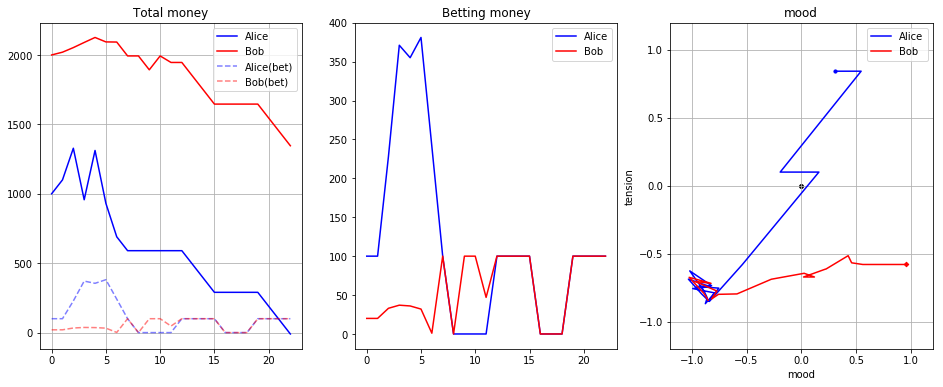

1th game:
reset
32
dealer : Hmm... 20 [('C', '9'), ('D', 'A')]

Alice : Hmm... 2 [('C', '2')]

Bob : Hmm... 10 [('H', 'Q')]

29
dealer : Hmm... 20 [('C', '9'), ('D', 'A')]

Alice : Hmm... 12 [('C', '2'), ('C', '10')]

Bob : Hmm... 19 [('H', 'Q'), ('H', '9')]

27
dealer : Hmm... 20 [('C', '9'), ('D', 'A')]

Alice : Bust!!! 22 [('C', '2'), ('C', '10'), ('D', 'J')]

Bob : Hmm... 19 [('H', 'Q'), ('H', '9')]

26
dealer : Hmm... 20 [('C', '9'), ('D', 'A')]

Alice : Bust!!! 22 [('C', '2'), ('C', '10'), ('D', 'J')]

Bob : Hmm... 19 [('H', 'Q'), ('H', '9')]

card_reset: 52
reset
51
dealer : Hmm... 19 [('S', '10'), ('H', '9')]

Alice : Hmm... 2 [('H', '2')]

Bob : Hmm... 2 [('D', '2')]

48
dealer : Hmm... 19 [('S', '10'), ('H', '9')]

Alice : Hmm... 9 [('H', '2'), ('C', '7')]

Bob : Hmm... 12 [('D', '2'), ('C', 'K')]

46
dealer : Hmm... 19 [('S', '10'), ('H', '9')]

Alice : Hmm... 16 [('H', '2'), ('C', '7'), ('S', '7')]

Bob : Hmm... 12 [('D', '2'), ('C', 'K')]

45
dealer : Hmm... 19 [('S', '10'

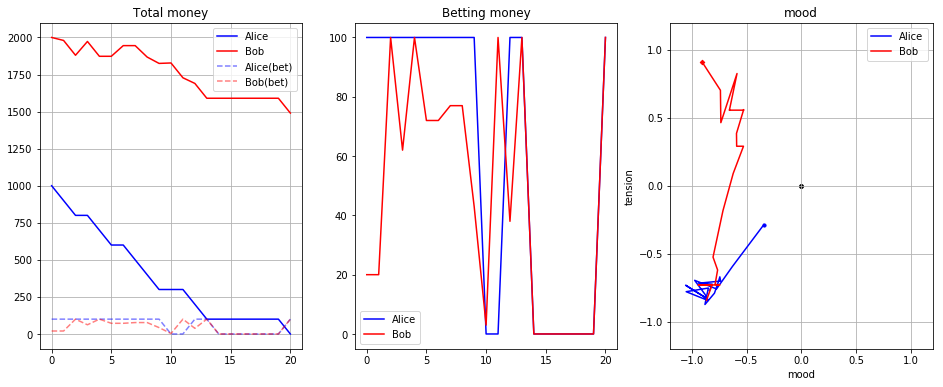

0th game:
reset
40
dealer : Hmm... 12 [('D', 'A'), ('C', 'A')]

Alice : Hmm... 9 [('H', '9')]

Bob : Hmm... 10 [('H', 'Q')]

37
dealer : Hmm... 18 [('D', 'A'), ('C', 'A'), ('C', '6')]

Alice : Hmm... 12 [('H', '9'), ('H', '3')]

Bob : Hmm... 19 [('H', 'Q'), ('D', '9')]

34
dealer : Hmm... 18 [('D', 'A'), ('C', 'A'), ('C', '6')]

Alice : Hmm... 12 [('H', '9'), ('H', '3')]

Bob : Hmm... 19 [('H', 'Q'), ('D', '9')]

reset
33
dealer : Hmm... 18 [('H', '8'), ('D', 'Q')]

Alice : Hmm... 10 [('S', '10')]

Bob : Hmm... 10 [('C', '10')]

30
dealer : Hmm... 18 [('H', '8'), ('D', 'Q')]

Alice : Hmm... 14 [('S', '10'), ('H', '4')]

Bob : Hmm... 20 [('C', '10'), ('S', 'J')]

28
dealer : Hmm... 18 [('H', '8'), ('D', 'Q')]

Alice : Hmm... 14 [('S', '10'), ('H', '4')]

Bob : Hmm... 20 [('C', '10'), ('S', 'J')]

card_reset: 52
reset
51
dealer : Hmm... 13 [('H', '4'), ('H', '9')]

Alice : Hmm... 9 [('S', '9')]

Bob : Hmm... 9 [('C', '9')]

48
dealer : Hmm... 15 [('H', '4'), ('H', '9'), ('H', '2')]

Alic

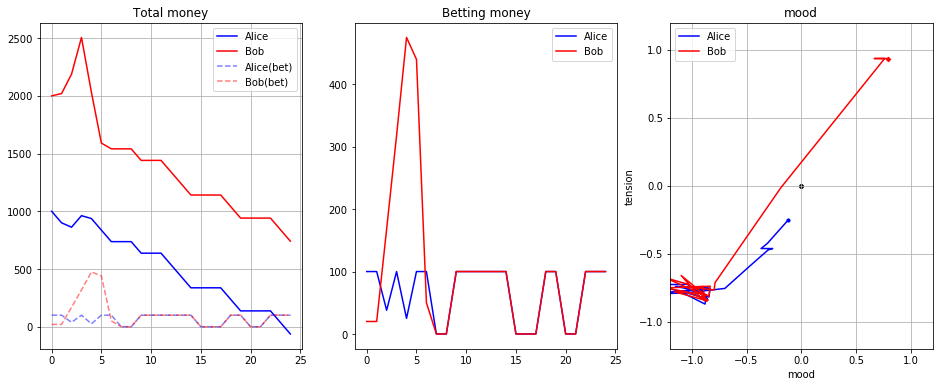

card_reset: 52
1th game:
reset
51
dealer : Hmm... 17 [('S', 'A'), ('D', '6')]

Alice : Hmm... 10 [('H', 'Q')]

Bob : Hmm... 2 [('S', '2')]

48
dealer : Hmm... 17 [('S', 'A'), ('D', '6')]

Alice : Hmm... 17 [('H', 'Q'), ('C', '7')]

Bob : Hmm... 6 [('S', '2'), ('D', '4')]

46
dealer : Hmm... 17 [('S', 'A'), ('D', '6')]

Alice : Hmm... 17 [('H', 'Q'), ('C', '7')]

Bob : Hmm... 12 [('S', '2'), ('D', '4'), ('H', '6')]

45
dealer : Hmm... 17 [('S', 'A'), ('D', '6')]

Alice : Hmm... 17 [('H', 'Q'), ('C', '7')]

Bob : Hmm... 12 [('S', '2'), ('D', '4'), ('H', '6')]

reset
44
dealer : Hmm... 6 [('S', '4'), ('H', '2')]

Alice : Hmm... 10 [('S', 'J')]

Bob : Hmm... 10 [('C', 'K')]

41
dealer : Hmm... 11 [('S', '4'), ('H', '2'), ('S', '5')]

Alice : Hmm... 16 [('S', 'J'), ('C', '6')]

Bob : Hmm... 20 [('C', 'K'), ('S', '10')]

38
dealer : Hmm... 12 [('S', '4'), ('H', '2'), ('S', '5'), ('H', 'A')]

Alice : Hmm... 16 [('S', 'J'), ('C', '6')]

Bob : Hmm... 20 [('C', 'K'), ('S', '10')]

37
dealer : Hm


Alice : Hmm... 19 [('C', 'Q'), ('S', '9')]

Bob : Bust!!! 31 [('S', 'A'), ('C', 'K'), ('S', 'J')]

45
dealer : Hmm... 20 [('D', 'J'), ('D', '10')]

Alice : Hmm... 19 [('C', 'Q'), ('S', '9')]

Bob : Bust!!! 31 [('S', 'A'), ('C', 'K'), ('S', 'J')]

reset
44
dealer : Hmm... 17 [('D', '6'), ('H', 'A')]

Alice : Hmm... 10 [('H', 'J')]

Bob : Hmm... 6 [('S', '6')]

41
dealer : Hmm... 17 [('D', '6'), ('H', 'A')]

Alice : BlackJack! 21 [('H', 'J'), ('D', 'A')]

Bob : Hmm... 10 [('S', '6'), ('H', '4')]

39
dealer : Hmm... 17 [('D', '6'), ('H', 'A')]

Alice : BlackJack! 21 [('H', 'J'), ('D', 'A')]

Bob : Hmm... 16 [('S', '6'), ('H', '4'), ('H', '6')]

38
dealer : Hmm... 17 [('D', '6'), ('H', 'A')]

Alice : BlackJack! 21 [('H', 'J'), ('D', 'A')]

Bob : Hmm... 20 [('S', '6'), ('H', '4'), ('H', '6'), ('S', '4')]

37
dealer : Hmm... 17 [('D', '6'), ('H', 'A')]

Alice : BlackJack! 21 [('H', 'J'), ('D', 'A')]

Bob : Bust!!! 28 [('S', '6'), ('H', '4'), ('H', '6'), ('S', '4'), ('S', '8')]

36
dealer : 


Alice : Hmm... 12 [('S', 'J'), ('C', '2')]

Bob : Bust!!! 23 [('H', '5'), ('D', '8'), ('S', '6'), ('C', '4')]

35
dealer : Bust!!! 25 [('D', 'Q'), ('S', '2'), ('D', '3'), ('H', 'J')]

Alice : Hmm... 12 [('S', 'J'), ('C', '2')]

Bob : Bust!!! 23 [('H', '5'), ('D', '8'), ('S', '6'), ('C', '4')]

reset
34
dealer : Hmm... 9 [('D', '4'), ('C', '5')]

Alice : Hmm... 10 [('C', 'J')]

Bob : Hmm... 7 [('C', '7')]

31
dealer : Hmm... 16 [('D', '4'), ('C', '5'), ('S', '7')]

Alice : BlackJack! 21 [('C', 'J'), ('D', 'A')]

Bob : Hmm... 17 [('C', '7'), ('H', '10')]

28
dealer : Bust!!! 25 [('D', '4'), ('C', '5'), ('S', '7'), ('C', '9')]

Alice : BlackJack! 21 [('C', 'J'), ('D', 'A')]

Bob : Bust!!! 23 [('C', '7'), ('H', '10'), ('C', '6')]

26
dealer : Bust!!! 25 [('D', '4'), ('C', '5'), ('S', '7'), ('C', '9')]

Alice : BlackJack! 21 [('C', 'J'), ('D', 'A')]

Bob : Bust!!! 23 [('C', '7'), ('H', '10'), ('C', '6')]

card_reset: 52
reset
51
dealer : Hmm... 18 [('S', '7'), ('S', 'A')]

Alice : Hmm... 2

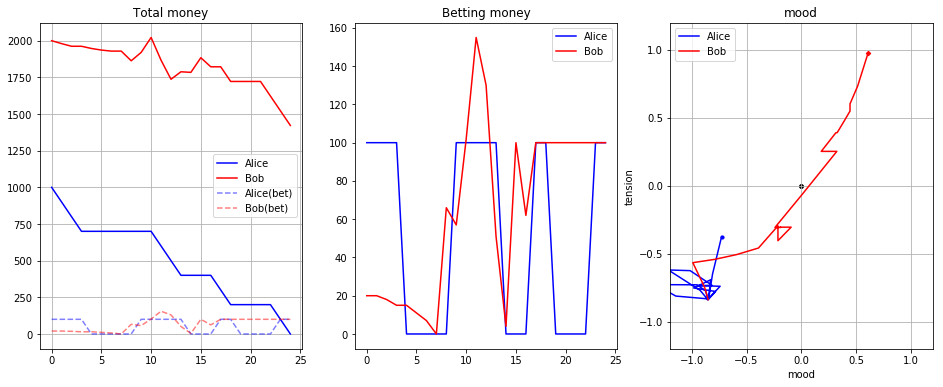

In [422]:
# scoring 1 ~ 5
print(len(cand2))
cand1, cand2 = gen(cand1, cand2, score)
print('Number of candidates:', len(cand1), ',', len(cand2))
text_list = []
while len(text_list) < 4:
    cand1, cand2 = cross(cand1, cand2)
    cand1, cand2, text_list = game(cand1, cand2, dealer, p1, p2, text_remain=text_list, cand2=list(cand2), cand1=list(cand1))

In [388]:
text_list

["Alice bets 100\nBob bets 20\ndealer : Hmm... 16 [('D', '6'), ('H', 'Q')]\nAlice : Hmm... 7 [('C', '7')]\nBob : Hmm... 10 [('C', 'J')]\n\ndealer : Hmm... 17 [('D', '6'), ('H', 'Q'), ('S', 'A')]\nAlice : Hmm... 17 [('C', '7'), ('D', 'K')]\nBob : Hmm... 15 [('C', 'J'), ('H', '5')]\n\ndealer : Hmm... 17 [('D', '6'), ('H', 'Q'), ('S', 'A')]\nAlice : Hmm... 17 [('C', '7'), ('D', 'K')]\nBob : Hmm... 15 [('C', 'J'), ('H', '5')]\n\n\nEven!\nAlice: remain money is 1000 \nAlice's mood is -0.5596, tension is 0.9758\nBob lost 20\nBob: remain money is 1980 \nBob's mood is 0.7435, tension is 0.2958\n\n================================================================================\nAlice bets 100\nBob bets 12\ndealer : Hmm... 10 [('S', '7'), ('D', '3')]\nAlice : Hmm... 10 [('C', 'Q')]\nBob : Hmm... 6 [('C', '6')]\n\ndealer : Hmm... 14 [('S', '7'), ('D', '3'), ('S', '4')]\nAlice : Hmm... 15 [('C', 'Q'), ('D', '5')]\nBob : Hmm... 9 [('C', '6'), ('H', '3')]\n\ndealer : BlackJack! 21 [('S', '7'), ('D',

In [418]:
score = [1, 1, 2, 3, 2, 1]

In [417]:
len(cand1)

6

6
Number of candidates: 2 , 2
0th game:
reset
40
dealer : Hmm... 12 [('S', 'Q'), ('C', '2')]

Alice : Hmm... 6 [('H', '6')]

Bob : Hmm... 4 [('S', '4')]

37
dealer : Hmm... 20 [('S', 'Q'), ('C', '2'), ('D', '8')]

Alice : Hmm... 13 [('H', '6'), ('C', '7')]

Bob : Hmm... 11 [('S', '4'), ('S', '7')]

34
dealer : Hmm... 20 [('S', 'Q'), ('C', '2'), ('D', '8')]

Alice : Hmm... 13 [('H', '6'), ('C', '7')]

Bob : BlackJack! 21 [('S', '4'), ('S', '7'), ('D', 'K')]

33
dealer : Hmm... 20 [('S', 'Q'), ('C', '2'), ('D', '8')]

Alice : Hmm... 13 [('H', '6'), ('C', '7')]

Bob : Bust!!! 23 [('S', '4'), ('S', '7'), ('D', 'K'), ('S', '2')]

32
dealer : Hmm... 20 [('S', 'Q'), ('C', '2'), ('D', '8')]

Alice : Hmm... 13 [('H', '6'), ('C', '7')]

Bob : Bust!!! 23 [('S', '4'), ('S', '7'), ('D', 'K'), ('S', '2')]

reset
31
dealer : Hmm... 20 [('H', 'Q'), ('S', 'K')]

Alice : Hmm... 5 [('H', '5')]

Bob : Hmm... 10 [('H', '10')]

28
dealer : Hmm... 20 [('H', 'Q'), ('S', 'K')]

Alice : Hmm... 8 [('H', '5'), ('

Bob : Bust!!! 23 [('H', '3'), ('C', '4'), ('H', 'A'), ('D', '2'), ('C', '3')]

22
dealer : Hmm... 20 [('C', 'K'), ('H', 'Q')]

Alice : Bust!!! 22 [('D', 'K'), ('H', '4'), ('C', '8')]

Bob : Bust!!! 23 [('H', '3'), ('C', '4'), ('H', 'A'), ('D', '2'), ('C', '3')]

card_reset: 52
reset
51
dealer : Hmm... 7 [('H', '2'), ('D', '5')]

Alice : Hmm... 5 [('S', '5')]

Bob : Hmm... 2 [('S', '2')]

48
dealer : Hmm... 10 [('H', '2'), ('D', '5'), ('D', '3')]

Alice : Hmm... 11 [('S', '5'), ('C', '6')]

Bob : Hmm... 12 [('S', '2'), ('D', 'Q')]

45
dealer : Hmm... 19 [('H', '2'), ('D', '5'), ('D', '3'), ('S', '9')]

Alice : Hmm... 12 [('S', '5'), ('C', '6'), ('C', 'A')]

Bob : Hmm... 13 [('S', '2'), ('D', 'Q'), ('S', 'A')]

42
dealer : Hmm... 19 [('H', '2'), ('D', '5'), ('D', '3'), ('S', '9')]

Alice : Hmm... 16 [('S', '5'), ('C', '6'), ('C', 'A'), ('D', '4')]

Bob : Hmm... 17 [('S', '2'), ('D', 'Q'), ('S', 'A'), ('S', '4')]

40
dealer : Hmm... 19 [('H', '2'), ('D', '5'), ('D', '3'), ('S', '9')]

Ali

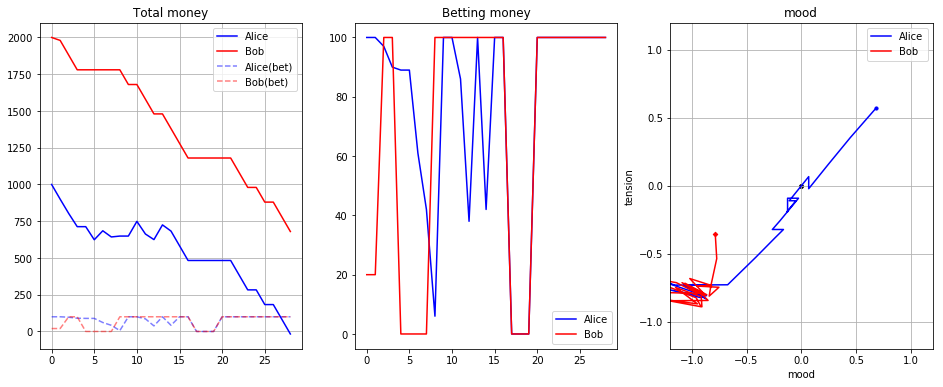

1th game:
reset
40
dealer : Hmm... 16 [('D', '10'), ('D', '6')]

Alice : Hmm... 9 [('S', '9')]

Bob : Hmm... 10 [('H', 'J')]

37
dealer : Hmm... 17 [('D', '10'), ('D', '6'), ('H', 'A')]

Alice : Hmm... 12 [('S', '9'), ('C', '3')]

Bob : Hmm... 16 [('H', 'J'), ('S', '6')]

34
dealer : Hmm... 17 [('D', '10'), ('D', '6'), ('H', 'A')]

Alice : Hmm... 12 [('S', '9'), ('C', '3')]

Bob : Hmm... 16 [('H', 'J'), ('S', '6')]

reset
33
dealer : Hmm... 18 [('S', '7'), ('D', 'A')]

Alice : Hmm... 5 [('C', '5')]

Bob : Hmm... 8 [('C', '8')]

30
dealer : Hmm... 18 [('S', '7'), ('D', 'A')]

Alice : Hmm... 7 [('C', '5'), ('C', '2')]

Bob : Hmm... 16 [('C', '8'), ('D', '8')]

28
dealer : Hmm... 18 [('S', '7'), ('D', 'A')]

Alice : Hmm... 7 [('C', '5'), ('C', '2')]

Bob : Hmm... 16 [('C', '8'), ('D', '8')]

card_reset: 52
reset
51
dealer : Hmm... 11 [('H', '6'), ('C', '5')]

Alice : Hmm... 9 [('C', '9')]

Bob : Hmm... 10 [('S', 'K')]

48
dealer : Hmm... 14 [('H', '6'), ('C', '5'), ('C', '3')]

Alice : Hm

24
dealer : Hmm... 19 [('H', 'K'), ('D', '9')]

Alice : BlackJack! 21 [('S', 'K'), ('S', '2'), ('H', '9')]

Bob : Bust!!! 23 [('H', '5'), ('S', '10'), ('D', '8')]

22
dealer : Hmm... 19 [('H', 'K'), ('D', '9')]

Alice : Bust!!! 27 [('S', 'K'), ('S', '2'), ('H', '9'), ('H', '6')]

Bob : Bust!!! 23 [('H', '5'), ('S', '10'), ('D', '8')]

21
dealer : Hmm... 19 [('H', 'K'), ('D', '9')]

Alice : Bust!!! 27 [('S', 'K'), ('S', '2'), ('H', '9'), ('H', '6')]

Bob : Bust!!! 23 [('H', '5'), ('S', '10'), ('D', '8')]

card_reset: 52
reset
51
dealer : Hmm... 16 [('H', '6'), ('C', 'Q')]

Alice : Hmm... 10 [('S', 'K')]

Bob : Hmm... 10 [('S', 'J')]

48
dealer : Bust!!! 22 [('H', '6'), ('C', 'Q'), ('S', '6')]

Alice : Hmm... 12 [('S', 'K'), ('S', '2')]

Bob : Hmm... 20 [('S', 'J'), ('H', '10')]

45
dealer : Bust!!! 22 [('H', '6'), ('C', 'Q'), ('S', '6')]

Alice : Hmm... 16 [('S', 'K'), ('S', '2'), ('S', '4')]

Bob : Bust!!! 22 [('S', 'J'), ('H', '10'), ('H', '2')]

43
dealer : Bust!!! 22 [('H', '6'), ('

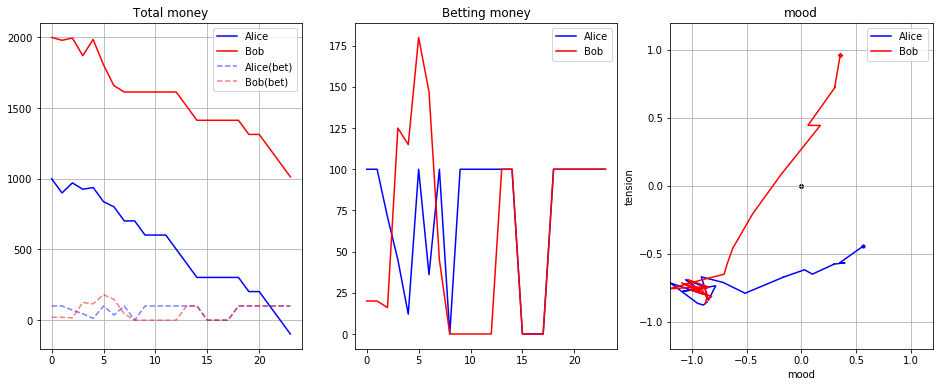

1th game:
reset
31
dealer : Hmm... 12 [('S', '5'), ('C', '7')]

Alice : Hmm... 11 [('S', 'A')]

Bob : Hmm... 10 [('D', 'Q')]

28
dealer : Hmm... 18 [('S', '5'), ('C', '7'), ('D', '6')]

Alice : Hmm... 13 [('S', 'A'), ('H', '2')]

Bob : Hmm... 15 [('D', 'Q'), ('H', '5')]

25
dealer : Hmm... 18 [('S', '5'), ('C', '7'), ('D', '6')]

Alice : Hmm... 14 [('S', 'A'), ('H', '2'), ('H', 'A')]

Bob : Hmm... 18 [('D', 'Q'), ('H', '5'), ('H', '3')]

23
dealer : Hmm... 18 [('S', '5'), ('C', '7'), ('D', '6')]

Alice : Bust!!! 24 [('S', 'A'), ('H', '2'), ('H', 'A'), ('H', 'J')]

Bob : Hmm... 20 [('D', 'Q'), ('H', '5'), ('H', '3'), ('C', '2')]

21
dealer : Hmm... 18 [('S', '5'), ('C', '7'), ('D', '6')]

Alice : Bust!!! 24 [('S', 'A'), ('H', '2'), ('H', 'A'), ('H', 'J')]

Bob : Bust!!! 30 [('D', 'Q'), ('H', '5'), ('H', '3'), ('C', '2'), ('D', 'K')]

20
dealer : Hmm... 18 [('S', '5'), ('C', '7'), ('D', '6')]

Alice : Bust!!! 24 [('S', 'A'), ('H', '2'), ('H', 'A'), ('H', 'J')]

Bob : Bust!!! 30 [('D', 'Q


Bob : Hmm... 2 [('H', '2')]

27
dealer : Hmm... 20 [('D', '10'), ('H', '3'), ('S', '7')]

Alice : Hmm... 19 [('D', '9'), ('S', '10')]

Bob : Hmm... 7 [('H', '2'), ('H', '5')]

24
dealer : Hmm... 20 [('D', '10'), ('H', '3'), ('S', '7')]

Alice : Hmm... 19 [('D', '9'), ('S', '10')]

Bob : Hmm... 7 [('H', '2'), ('H', '5')]

card_reset: 52
reset
51
dealer : Hmm... 14 [('H', '9'), ('D', '5')]

Alice : Hmm... 7 [('D', '7')]

Bob : Hmm... 3 [('S', '3')]

48
dealer : Bust!!! 24 [('H', '9'), ('D', '5'), ('D', 'K')]

Alice : Hmm... 16 [('D', '7'), ('D', '9')]

Bob : Hmm... 13 [('S', '3'), ('C', 'K')]

45
dealer : Bust!!! 24 [('H', '9'), ('D', '5'), ('D', 'K')]

Alice : Hmm... 16 [('D', '7'), ('D', '9')]

Bob : Hmm... 13 [('S', '3'), ('C', 'K')]

reset
44
dealer : Hmm... 20 [('H', '10'), ('H', 'J')]

Alice : Hmm... 4 [('H', '4')]

Bob : Hmm... 2 [('D', '2')]

41
dealer : Hmm... 20 [('H', '10'), ('H', 'J')]

Alice : Hmm... 7 [('H', '4'), ('D', '3')]

Bob : Hmm... 10 [('D', '2'), ('H', '8')]

39
d


Bob : Hmm... 20 [('C', 'J'), ('D', '2'), ('S', '8')]

23
dealer : Hmm... 20 [('D', '5'), ('C', '2'), ('C', '3'), ('S', 'K')]

Alice : Bust!!! 24 [('H', '6'), ('S', 'J'), ('C', '8')]

Bob : Bust!!! 30 [('C', 'J'), ('D', '2'), ('S', '8'), ('D', 'Q')]

22
dealer : Hmm... 20 [('D', '5'), ('C', '2'), ('C', '3'), ('S', 'K')]

Alice : Bust!!! 24 [('H', '6'), ('S', 'J'), ('C', '8')]

Bob : Bust!!! 30 [('C', 'J'), ('D', '2'), ('S', '8'), ('D', 'Q')]

card_reset: 52
reset
51
dealer : Hmm... 13 [('D', '8'), ('C', '5')]

Alice : Hmm... 7 [('S', '7')]

Bob : Hmm... 11 [('S', 'A')]

48
dealer : Bust!!! 22 [('D', '8'), ('C', '5'), ('D', '9')]

Alice : Hmm... 18 [('S', '7'), ('C', 'A')]

Bob : Hmm... 16 [('S', 'A'), ('H', '5')]

45
dealer : Bust!!! 22 [('D', '8'), ('C', '5'), ('D', '9')]

Alice : Bust!!! 25 [('S', '7'), ('C', 'A'), ('C', '7')]

Bob : Bust!!! 24 [('S', 'A'), ('H', '5'), ('C', '8')]

43
dealer : Bust!!! 22 [('D', '8'), ('C', '5'), ('D', '9')]

Alice : Bust!!! 25 [('S', '7'), ('C', 'A')

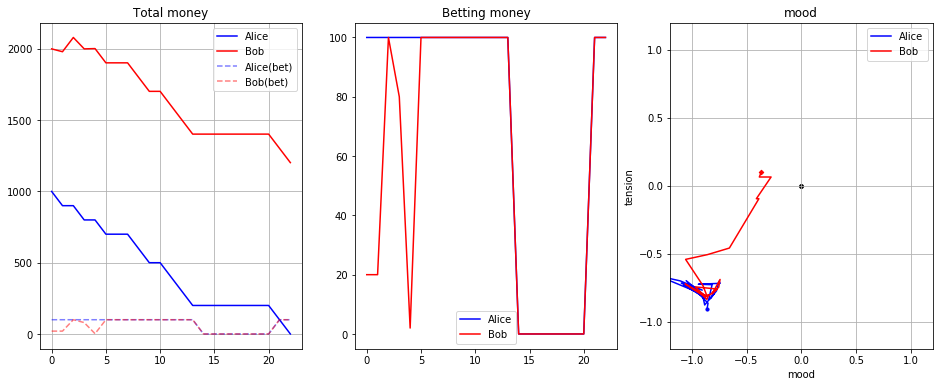

card_reset: 52
1th game:
reset
51
dealer : Hmm... 17 [('D', 'J'), ('S', '7')]

Alice : Hmm... 4 [('S', '4')]

Bob : Hmm... 4 [('H', '4')]

48
dealer : Hmm... 17 [('D', 'J'), ('S', '7')]

Alice : Hmm... 6 [('S', '4'), ('S', '2')]

Bob : Hmm... 8 [('H', '4'), ('C', '4')]

46
dealer : Hmm... 17 [('D', 'J'), ('S', '7')]

Alice : Hmm... 17 [('S', '4'), ('S', '2'), ('S', 'A')]

Bob : Hmm... 8 [('H', '4'), ('C', '4')]

45
dealer : Hmm... 17 [('D', 'J'), ('S', '7')]

Alice : Bust!!! 25 [('S', '4'), ('S', '2'), ('S', 'A'), ('D', '8')]

Bob : Hmm... 8 [('H', '4'), ('C', '4')]

44
dealer : Hmm... 17 [('D', 'J'), ('S', '7')]

Alice : Bust!!! 25 [('S', '4'), ('S', '2'), ('S', 'A'), ('D', '8')]

Bob : Hmm... 8 [('H', '4'), ('C', '4')]

reset
43
dealer : Hmm... 12 [('C', '9'), ('S', '3')]

Alice : Hmm... 11 [('D', 'A')]

Bob : Hmm... 5 [('S', '5')]

40
dealer : Bust!!! 22 [('C', '9'), ('S', '3'), ('D', 'Q')]

Alice : BlackJack! 21 [('D', 'A'), ('S', 'Q')]

Bob : Hmm... 12 [('S', '5'), ('D', '7')]

37

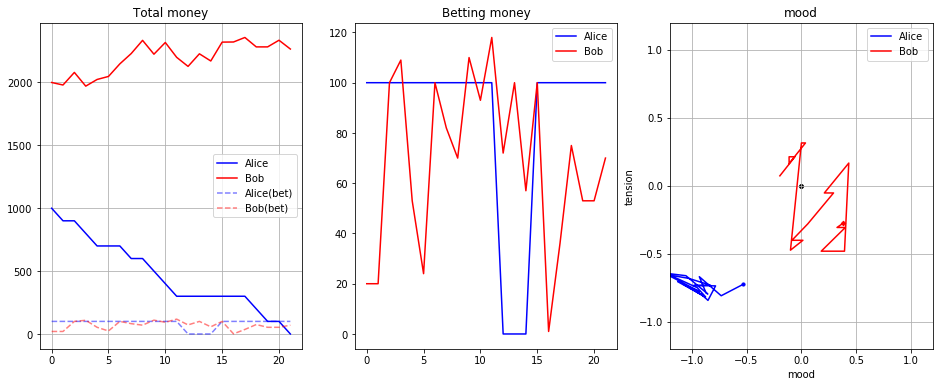

card_reset: 52
2th game:
reset
51
dealer : Hmm... 13 [('S', 'Q'), ('D', '3')]

Alice : Hmm... 8 [('C', '8')]

Bob : Hmm... 7 [('S', '7')]

48
dealer : Hmm... 15 [('S', 'Q'), ('D', '3'), ('S', '2')]

Alice : Hmm... 19 [('C', '8'), ('D', 'A')]

Bob : Hmm... 17 [('S', '7'), ('D', 'J')]

45
dealer : Hmm... 20 [('S', 'Q'), ('D', '3'), ('S', '2'), ('H', '5')]

Alice : Hmm... 19 [('C', '8'), ('D', 'A')]

Bob : Hmm... 17 [('S', '7'), ('D', 'J')]

44
dealer : Hmm... 20 [('S', 'Q'), ('D', '3'), ('S', '2'), ('H', '5')]

Alice : Hmm... 19 [('C', '8'), ('D', 'A')]

Bob : Hmm... 17 [('S', '7'), ('D', 'J')]

reset
43
dealer : Hmm... 19 [('H', '10'), ('S', '9')]

Alice : Hmm... 10 [('S', 'K')]

Bob : Hmm... 10 [('H', 'K')]

40
dealer : Hmm... 19 [('H', '10'), ('S', '9')]

Alice : Hmm... 20 [('S', 'K'), ('H', 'J')]

Bob : BlackJack! 21 [('H', 'K'), ('C', 'A')]

38
dealer : Hmm... 19 [('H', '10'), ('S', '9')]

Alice : Bust!!! 27 [('S', 'K'), ('H', 'J'), ('C', '7')]

Bob : BlackJack! 21 [('H', 'K'), ('C'

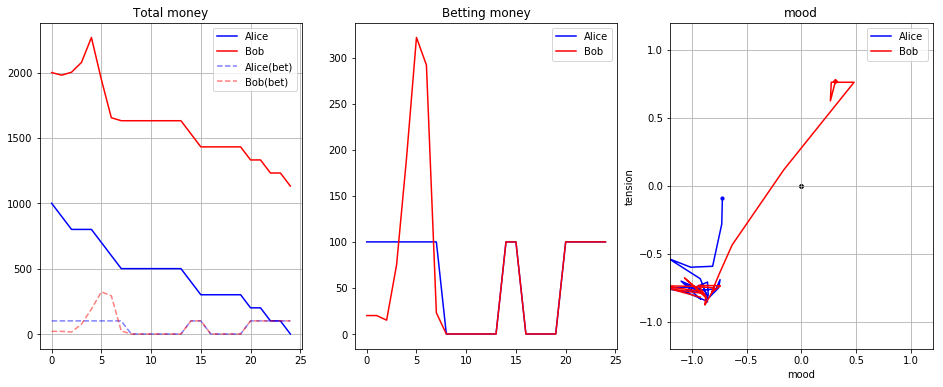

card_reset: 52
3th game:
reset
51
dealer : Hmm... 13 [('H', '5'), ('S', '8')]

Alice : Hmm... 6 [('S', '6')]

Bob : Hmm... 4 [('H', '4')]

48
dealer : Bust!!! 23 [('H', '5'), ('S', '8'), ('C', 'K')]

Alice : Hmm... 13 [('S', '6'), ('S', '7')]

Bob : Hmm... 14 [('H', '4'), ('C', '10')]

45
dealer : Bust!!! 23 [('H', '5'), ('S', '8'), ('C', 'K')]

Alice : Hmm... 13 [('S', '6'), ('S', '7')]

Bob : Hmm... 14 [('H', '4'), ('C', '10')]

reset
44
dealer : Hmm... 11 [('S', '5'), ('H', '6')]

Alice : Hmm... 3 [('C', '3')]

Bob : Hmm... 10 [('C', 'Q')]

41
dealer : Hmm... 20 [('S', '5'), ('H', '6'), ('S', '9')]

Alice : Hmm... 9 [('C', '3'), ('C', '6')]

Bob : Hmm... 12 [('C', 'Q'), ('D', '2')]

38
dealer : Hmm... 20 [('S', '5'), ('H', '6'), ('S', '9')]

Alice : Hmm... 9 [('C', '3'), ('C', '6')]

Bob : Hmm... 12 [('C', 'Q'), ('D', '2')]

reset
37
dealer : Hmm... 14 [('S', 'J'), ('C', '4')]

Alice : Hmm... 4 [('D', '4')]

Bob : Hmm... 3 [('H', '3')]

34
dealer : Bust!!! 24 [('S', 'J'), ('C', '4')

In [423]:
# scoring 1 ~ 5
print(len(cand2))
cand1, cand2 = gen(cand1, cand2, score)
print('Number of candidates:', len(cand1), ',', len(cand2))
text_list = []
while len(text_list) < 4:
    cand1, cand2 = mutation(cand1, cand2)
    cand1, cand2, text_list = game(cand1, cand2, dealer, p1, p2, text_remain=text_list, cand2=list(cand2), cand1=list(cand1))

In [346]:
cand1, cand2 = mutation(cand1, cand2)
while len(cand2) < 8:
    cand1, cand2, text_list = game(cand1, cand2, dealer, p1, p2, text_remain=text_list, cand1=list(cand1), cand2=list(cand2))

0th game:


ValueError: low >= high

In [294]:
len(cand1)

8

In [300]:
score = [1, 1, 2, 1, 1, 1, 3]